# Webscraping Fotocasa 
Proyecto para generar DataFrame por foto casa en Madrid, Barcelona y Malaga

## Importar librerias

In [1]:
import numpy as np
import pandas as pd

import os
import datetime

import random

import requests
from bs4 import BeautifulSoup
from selenium import webdriver
from selenium.webdriver.common.by import By

from time import sleep

import json
import re

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'iframe' # Lab
#pio.renderers.default = 'notebook' # Notebook
import folium
import math

import geopandas as gpd

import branca
import io

import base64

## Path

In [5]:
# project directory
current_directory = os.getcwd()
folder = current_directory.split("\\")[-1]
if folder != 'real-estate-rental-analysis':
    os.chdir('..')
    print(os.getcwd()) 
else:
    print(os.getcwd())

c:\projects\real-estate-rental-analysis


## 1. 🚫SCRAPING: Rental House Web
Observación: Los datos fueron obtenidos mediante técnicas de web scraping sobre páginas públicas, y posteriormente anonimizados para su uso educativo. 

## 3. Limpieza de DataFrame

### 3.1 Descarga de DataFrame desde csv

In [145]:
path = "data/raw/raw_malaga.csv"
df = pd.read_csv(path, index_col=0)

### 3.2 Generación de lista de distritos de Madrid desde el geojson y de columna distritos

In [146]:
with open("data/geo/districts_malaga.geojson", "r") as js:
    city_geo = json.load(js)

districts_geo = [data["properties"]["NOMBRE"] for data in city_geo["features"]]

In [147]:
sorted(districts_geo)

['Bailen - Miraflores',
 'Campanillas',
 'Carretera de Cádiz',
 'Centro',
 'Churriana',
 'Ciudad Jardin',
 'Cruz de Humilladero',
 'Este',
 'Palma - Palmilla',
 'Puerto de la Torre',
 'Teatinos - Universidad']

In [148]:
def district_name(address):
    districs = address.split(" en ")[-1].strip()
    districs = districs.split(",")[-1].strip() if len(districs.split(",")) > 1 else districs
    for district in districts_geo:
        if district in districs:
            return district
    return districs

In [149]:
dictionary_districts_to_geojson = {
                                 "Bailén - Miraflores" : "Bailen - Miraflores",
                                 "Residencial Jardín Botánico" : "Ciudad Jardin",
                                 "Ciudad Jardín" : "Ciudad Jardin"}

In [150]:
df["district"] = df["direction"].apply(district_name)

In [151]:
sorted(df["district"].unique())

['Bailén - Miraflores',
 'Campanillas',
 'Carretera de Cádiz',
 'Centro',
 'Churriana',
 'Ciudad Jardín',
 'Cruz de Humilladero',
 'Este',
 'Martiricos - La Roca',
 'Puerto de la Torre',
 'Residencial Jardín Botánico',
 'Teatinos - Universidad']

#### 3.2.1. Realización de replace para que coincidan los distritos con los del geojson

In [152]:
df["district"] = df["district"].replace(dictionary_districts_to_geojson)

### 3.3 Generación de las siguientes columnas: precio, id, hab, baño, dimensiones, ascensor, terracza, aire acondicionado, balcon, piscina y planta

In [153]:
df["price"] = [price.split()[0].replace(".","") if price.split()[0].replace(".","").isnumeric() else np.nan for price in df["price"]]

In [154]:
serie_extras = df["extras"].apply(lambda x: "".join(x))

df["hab"] = serie_extras.apply(lambda x: re.findall(r"(\d+) hab", x)[0] if len(re.findall(r"(.) hab", x)) > 0 else 0)

df["baño"] = serie_extras.apply(lambda x: re.findall(r"(\d+) bañ", x)[0] if len(re.findall(r"(.) bañ", x)) > 0 else 0)

df["dimensiones"] = serie_extras.apply(lambda x: re.findall(r"(\d+) m²", x)[0] if len(re.findall(r"(.) m²", x)) > 0 else 0)

df["ascensor"] = serie_extras.apply(lambda x: 1 if len(re.findall(r"Ascensor", x)) > 0 else 0)

df["terraza"] = serie_extras.apply(lambda x: 1 if len(re.findall(r"Terraza", x)) > 0 else 0)

df["air"] = serie_extras.apply(lambda x: 1 if len(re.findall(r"Aire", x)) > 0 else 0)
 
df["balcon"] = serie_extras.apply(lambda x: 1 if len(re.findall(r"Balc", x)) > 0 else 0)

df["piscina"] = serie_extras.apply(lambda x: 1 if len(re.findall(r"Pisci", x)) > 0 else 0)
 
df["planta"] = serie_extras.apply(lambda x: re.findall(r"(\w+) planta", x, flags=re.IGNORECASE)[0] if re.findall(r"(\w+) planta", x, flags=re.IGNORECASE) else ("bajo" if re.search(r"bajos?", x, flags=re.IGNORECASE) else np.nan))


### 3.5. Procesamos time_ago

In [155]:
df["time_ago"] = df["time_ago"].apply(lambda x: x.split()[1] if len(x.split()) >= 2 else 0) #0 es novedad, para que despues podamos pasar las columna a entero. La he sobreescrito porque estaba seguro. La verdad que si queremos, podemos hacerlo en otra columna

### 3.6 Procesamos reduccion del precio

In [156]:
#nos quedamos solo con la cantidad de dinero. #me he dado cuenta que tambien lo podemos hacer con split tal y como lo he hecho abajo con time ago
df["price_reduction_amount"] = df["price_reduction"].str.extract(r'(\d+(?:[.,]\d+)?)') # las interrogaciones hace que no te lo devuelvan como dos columnas. puede ser que baje 1.000€ por eso lo tenemos que poner los puntos o las comas
# no podriamos poner: df["price_reduction"].str.extract(r'(\d+([.,]\d+)?)') porque nos lo da en diferentes columnas
df["price_reduction_amount"] = df["price_reduction_amount"].str.replace('.', '')
# str.replace("", 0)
df["price_reduction_amount"] = df["price_reduction_amount"].fillna(0)

#### 3.6.1 Check reduccion del precio

In [157]:
#comprobamos que no haya na donde hay price reduction por seguridad
price_reduction_check  = df[df["price_reduction"].notna()][["price_reduction","price_reduction_amount"]]
price_reduction_check[price_reduction_check["price_reduction_amount"].isna()] 
#si da vacio significa que está bien hecho.

,price_reduction,price_reduction_amount


### 3.7 Generamos la columna ciudad 

In [158]:
df["ciudad"] = path.split("_")[1].split(".")[0]

In [159]:
df["ciudad"] = df["ciudad"].str.capitalize()

### 3.8 Limpieza de columnas sobrantes (Unnamed:0, extras y district_new_1), conversión de strings a int todas las variables numéricas que indican cantidad, excepto price que será float

In [160]:
df = df.drop(['link', 'scrapping_page', 'description', 'inmobiliario', 'extras', 'direction'], axis = 1)

In [ ]:
df_clean = df

In [177]:
df_clean["dimensiones"]

0      135
1       60
2       81
3       88
4      112
      ... 
521     50
522     80
523     85
524     80
525     80
Name: dimensiones, Length: 526, dtype: int64

In [178]:
df_clean.keys()

Index(['price', 'strong', 'scrapping_date', 'time_ago', 'price_reduction',
       'district', 'hab', 'baño', 'dimensiones', 'ascensor', 'terraza', 'air',
       'balcon', 'piscina', 'planta', 'price_reduction_amount', 'ciudad'],
      dtype='object')

In [179]:
df_clean["price"] = df["price"].astype("float")
df_clean["hab"] = df["hab"].astype("int")
df_clean["baño"] = df["baño"].astype("int")
df_clean["dimensiones"] = df_clean["dimensiones"].astype("int")
df_clean["price_reduction_amount"] = df_clean["price_reduction_amount"].astype("int")

### 3.9 Títulos de columnas homogeneizados

In [180]:
df_clean = df_clean.rename(columns={
    "ciudad" : "city",
    "dimensiones" : "dimension",
    "scrapping_date" : "scraping_date",
    "scrapping_page" : "scraping_page",
    "direction": "address", #1 renombrar
    "strong": "type", #2 renombrar
    "price": "rental_cost", #0 renombrar
    "hab": "rooms", #11 renombrar
    "baño": "bathrooms", #12 renombrar
    "ascensor": "elevator", #14 renombrar
    "terraza": "terrace", #15 renombrar
    "air": "air_conditioning", #16 renombrar
    "balcon": "balcony", #17 renombrar
    "piscina": "pool", #18 renombrar
    "planta": "floor", #19 renombrar
    "time_ago": "time_ago_from_scrapping_date", #7
})

### 3.10 Reordenamiento de columnas

In [181]:
df_clean = df_clean.reindex(["city",
                            "district",
                            "type",
                            "rental_cost",
                            "price_reduction_amount",
                            "dimension",
                            "rooms",
                            "bathrooms",
                            "elevator",
                            "terrace",
                            "air_conditioning",
                            "balcony",
                            "pool",
                            "floor",
                            "time_ago_from_scrapping_date",
                            "scraping_date"], axis = 1)

In [182]:
df_clean

,city,district,type,rental_cost,price_reduction_amount,dimension,rooms,bathrooms,elevator,terrace,air_conditioning,balcony,pool,floor,time_ago_from_scrapping_date,scraping_date
0,Malaga,Centro,Piso,2000.0,400,135,5,2,1,1,0,1,0,NaN,32,17-03-2024 | 11:37
1,Malaga,Centro,Piso,1150.0,0,60,1,1,1,0,1,0,0,4ª,90,17-03-2024 | 11:37
2,Malaga,Carretera de Cádiz,Piso,950.0,0,81,3,1,1,1,0,0,0,3ª,4,17-03-2024 | 11:37
3,Malaga,Centro,Piso,1350.0,0,88,2,2,1,0,1,0,0,NaN,86,17-03-2024 | 11:37
4,Malaga,Centro,Piso,1850.0,350,112,3,1,0,0,0,0,0,NaN,0,17-03-2024 | 11:37
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
521,Malaga,Carretera de Cádiz,Apartamento,650.0,0,50,1,1,0,0,0,0,0,NaN,5,17-03-2024 | 11:46
522,Malaga,Este,Piso,930.0,0,80,2,1,0,0,0,0,0,NaN,5,17-03-2024 | 11:46
523,Malaga,Cruz de Humilladero,Piso,800.0,0,85,3,1,0,0,0,0,0,NaN,5,17-03-2024 | 11:46
524,Malaga,Cruz de Humilladero,Piso,750.0,0,80,2,1,0,0,0,0,0,NaN,5,17-03-2024 | 11:46


### 3.11 Limpieza de columna address

#### GUARDADO DE DF CLEAN A CSV

In [183]:
df_clean.to_csv("data/processed/malaga.csv")

In [184]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 526 entries, 0 to 525
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   city                          526 non-null    object 
 1   district                      526 non-null    object 
 2   type                          526 non-null    object 
 3   rental_cost                   521 non-null    float64
 4   price_reduction_amount        526 non-null    int64  
 5   dimension                     526 non-null    int64  
 6   rooms                         526 non-null    int64  
 7   bathrooms                     526 non-null    int64  
 8   elevator                      526 non-null    int64  
 9   terrace                       526 non-null    int64  
 10  air_conditioning              526 non-null    int64  
 11  balcony                       526 non-null    int64  
 12  pool                          526 non-null    int64  
 13  floor     

## 4. Union de DataFrames: BARCELONA, MADRID, MALAGA 

In [189]:
df_bar = pd.read_csv("data/processed/dataframe_pisos_barcelona_limpio.csv", index_col=0)

In [190]:
df_bar.columns

Index(['id', 'city', 'district', 'type', 'rental_cost',
       'price_reduction_amount', 'dimension', 'rooms', 'bathrooms', 'elevator',
       'terrace', 'air_conditioning', 'balcony', 'pool', 'floor',
       'description', 'real_estate', 'url', 'time_ago_from_scrapping_date',
       'scraping_date', 'scraping_page'],
      dtype='object')

In [192]:
df_bar.drop(['url', 'scraping_page', 'description', 'real_estate'], axis = 1)

,id,city,district,type,rental_cost,price_reduction_amount,dimension,rooms,bathrooms,elevator,terrace,air_conditioning,balcony,pool,floor,time_ago_from_scrapping_date,scraping_date
0,181570995,Barcelona,Sants - Montjuïc,Piso,1100.0,140,63,3,1,1,0,0,0,0,NaN,0,17-03-2024 | 13:15
1,182059135,Barcelona,Horta - Guinardó,Piso,1140.0,0,67,3,1,0,1,0,0,0,bajo,0,17-03-2024 | 13:15
2,182462387,Barcelona,Eixample,Piso,1600.0,0,84,3,1,1,0,1,0,0,4ª,0,17-03-2024 | 13:15
3,181792100,Barcelona,Eixample,Piso,1700.0,290,115,4,2,1,0,0,1,0,NaN,0,17-03-2024 | 13:15
4,182302652,Barcelona,Sants - Montjuïc,Piso,1395.0,0,53,2,1,1,0,0,0,0,7ª,0,17-03-2024 | 13:15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3617,177084129,Barcelona,Ciutat Vella,Piso,NaN,0,0,2,1,0,0,0,0,0,NaN,371,17-03-2024 | 13:53
3618,178566734,Barcelona,Ciutat Vella,Piso,NaN,0,0,2,1,0,0,0,0,0,NaN,244,17-03-2024 | 13:53
3619,182468791,Barcelona,Eixample,Piso,6000.0,0,250,4,3,1,0,0,1,0,NaN,1,17-03-2024 | 13:53
3620,182109994,Barcelona,Ciutat Vella,Ático,890.0,0,50,1,0,0,1,0,0,0,6ª,18,17-03-2024 | 13:53


### 4.1 Cargo los DF

In [ ]:
df_barcelona = pd.read_csv("Data/dataframe_pisos_barcelona_limpio.csv")
df_madrid = pd.read_csv("Data/dataframe_pisos_madrid_limpio.csv")
df_malaga = pd.read_csv"data/processed/malaga.csv")

In [67]:
## Concateno a un solo DataFrame
df = pd.concat([df_barcelona, df_madrid, df_malaga], axis = 0)
## Reinicio el index para que me tome todos los valores desde 0
df = prueba.reset_index(drop=True)
## Dropeo la primera columna que tiene el index anterior
df = df.drop(["Unnamed: 0"], axis = 1)
## Lo guardo como un nuevo .CSV
df.to_csv("Data/df_fotocasa_bcn-mad-mlg.csv", index = False)

## 5. Análisis Exploratorio de Datos 

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'iframe' # Lab
#pio.renderers.default = 'notebook' # Notebook
import folium
import math

In [2]:
# Cargo el DF que contenga las tres ciudades
df = pd.read_csv("Data/df_fotocasa_bcn-mad-mlg.csv")

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7889 entries, 0 to 7888
Data columns (total 21 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   id                            7889 non-null   int64  
 1   city                          7889 non-null   object 
 2   district                      7889 non-null   object 
 3   type                          7889 non-null   object 
 4   rental_cost                   7854 non-null   float64
 5   price_reduction_amount        7889 non-null   int64  
 6   dimension                     7889 non-null   int64  
 7   rooms                         7889 non-null   int64  
 8   bathrooms                     7889 non-null   int64  
 9   elevator                      7889 non-null   int64  
 10  terrace                       7889 non-null   int64  
 11  air_conditioning              7889 non-null   int64  
 12  balcony                       7889 non-null   int64  
 13  poo

In [5]:
df['id'] = df['id'].astype(str)

### 5.1 Limpieza de todos los datos que creemos que hay que eliminar

In [6]:
pd.set_option("display.max_colwidth", None) #para ver bien los datos


df_cleaned = df[(df["dimension"] > 10) & (df['dimension'].notna() )] # a mas metros cuadrados menos correlacion. investigar por qué hay intervalos donde la correlacion es muy alta. & (df["dimension"] < 1000) d
df_cleaned = df_cleaned[(df_cleaned['rental_cost'] >300) & df_cleaned['rental_cost'].notna()]
df_cleaned = df_cleaned[df_cleaned["bathrooms"] != 0 & df_cleaned['bathrooms'].notna()] #esto podemos quitarlo si quereis. solo hay 62 resultados
df_cleaned = df_cleaned.drop(["time_ago_from_scrapping_date","price_reduction_amount"], axis=1)  #lo recuparemos despues cuando hagamos otras relaciones 

In [7]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7357 entries, 0 to 7888
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                7357 non-null   object 
 1   city              7357 non-null   object 
 2   district          7357 non-null   object 
 3   type              7357 non-null   object 
 4   rental_cost       7357 non-null   float64
 5   dimension         7357 non-null   int64  
 6   rooms             7357 non-null   int64  
 7   bathrooms         7357 non-null   int64  
 8   elevator          7357 non-null   int64  
 9   terrace           7357 non-null   int64  
 10  air_conditioning  7357 non-null   int64  
 11  balcony           7357 non-null   int64  
 12  pool              7357 non-null   int64  
 13  floor             4107 non-null   object 
 14  description       7277 non-null   object 
 15  real_estate       5718 non-null   object 
 16  url               7357 non-null   object 
 17  

### 5.2 Hacemos boxplot para ver valores atipicos (podemos hacerlo por plt o sns)

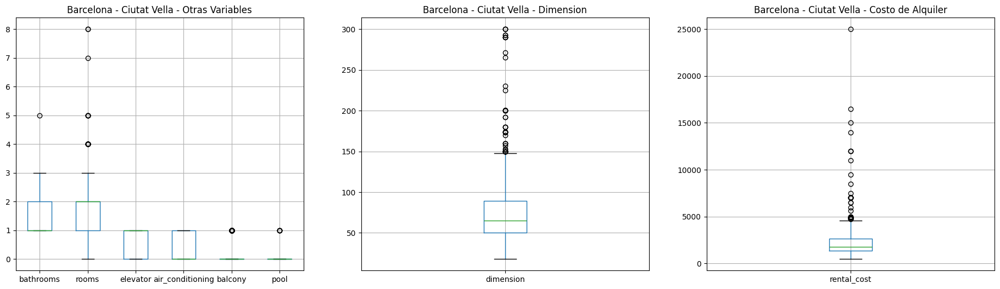

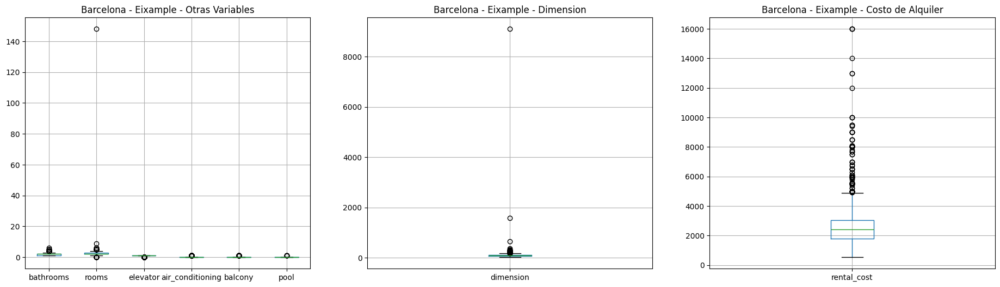

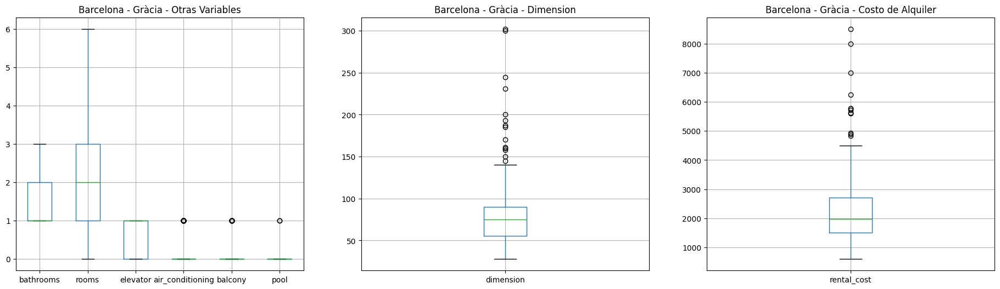

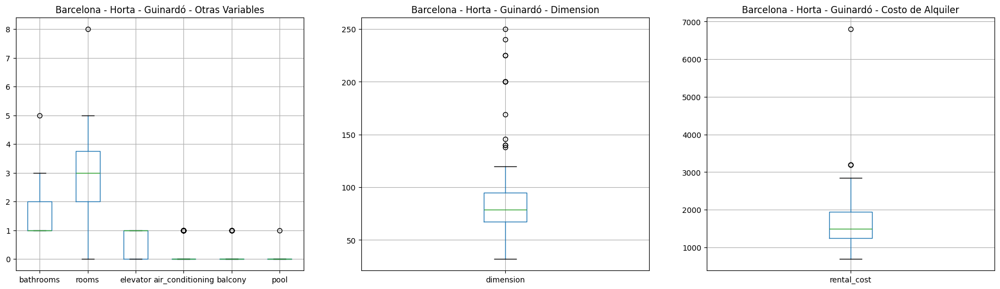

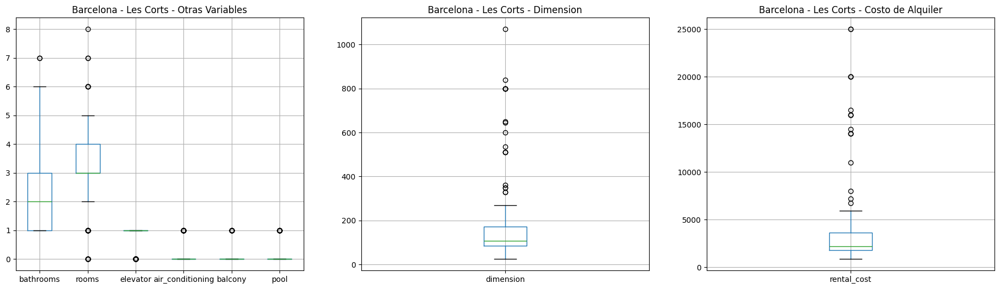

...

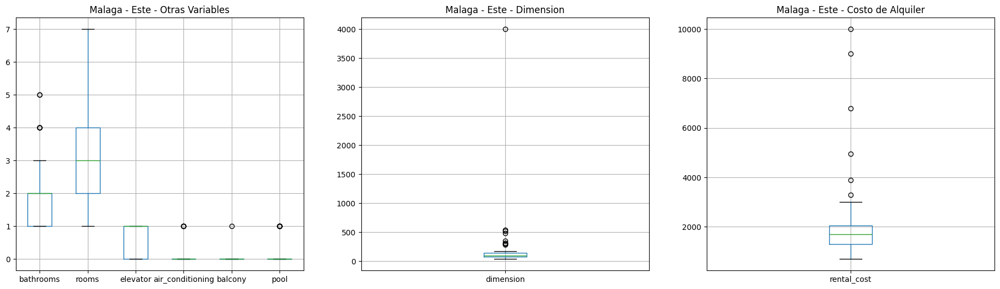

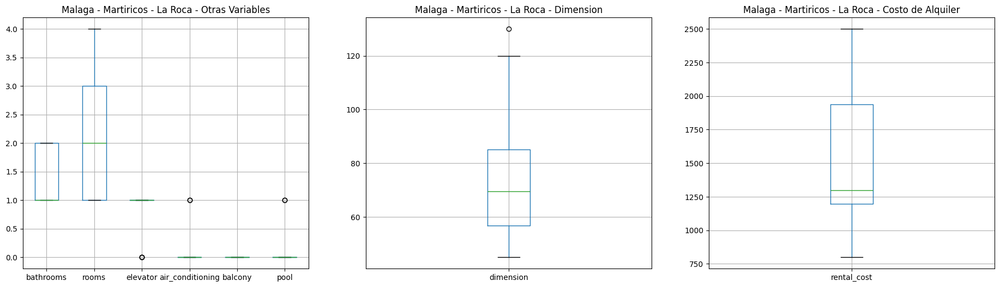

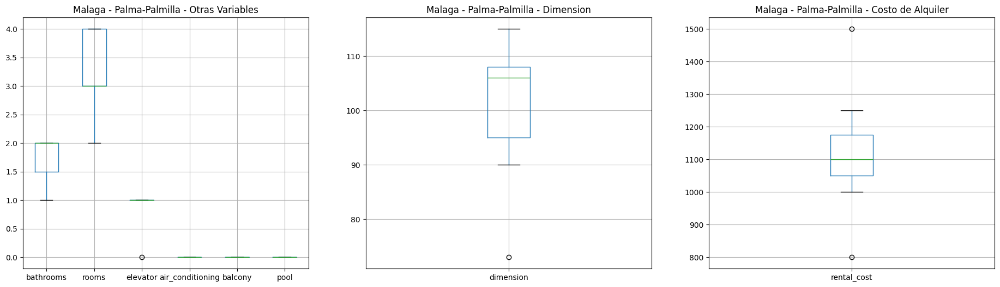

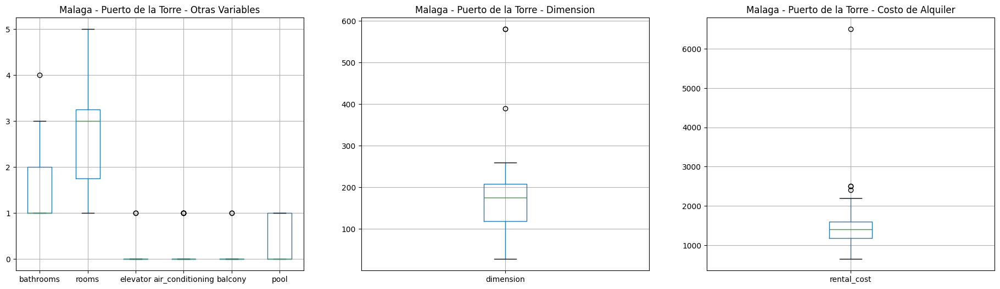

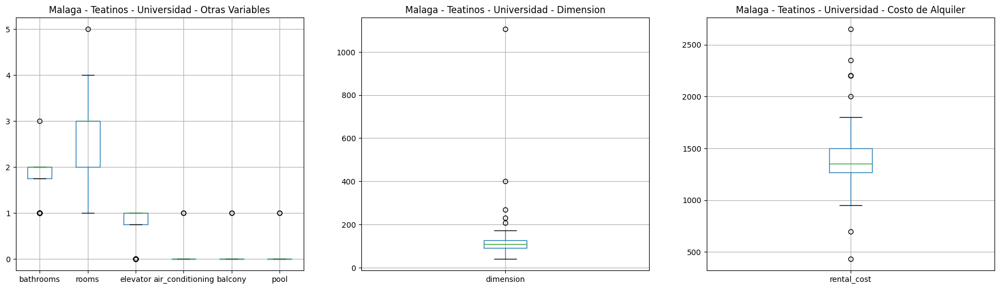

In [8]:
grouped_by_city_district = df_cleaned.groupby(["city", "district"])[["bathrooms", "rooms", "elevator", "air_conditioning", "balcony", "pool", "dimension", "rental_cost"]]

for (city, district), data in grouped_by_city_district:    # Boxplots para las columnas seleccionadas (excluyendo "price_reduction_amount" y "time_ago_from_scrapping_date")
    #podemos iterar un grouby. resulta que los indices son: las columas selecionadas pro groupby (city y district) y data, las columnas selecionadas

    plt.figure(figsize=(23, 6))
    
    plt.subplot(1, 3, 1)  
    data.drop(["dimension", "rental_cost"], axis=1).boxplot()
    plt.title(f"{city} - {district} - Otras Variables")
    
    plt.subplot(1, 3, 2)  
    data[["dimension"]].boxplot()
    plt.title(f"{city} - {district} - Dimension")
    
    plt.subplot(1, 3, 3)  
    data[["rental_cost"]].boxplot()
    plt.title(f"{city} - {district} - Costo de Alquiler")
    
    plt.show()



In [ ]:

grouped_by_city_district = df_cleaned.groupby(["city", "district"])

numeric_columns = ["bathrooms", "rooms", "elevator", "air_conditioning", "balcony", "pool", "dimension", "rental_cost"]

for (city, district), data in grouped_by_city_district:
    plt.figure(figsize=(22, 6))
    
    plt.subplot(1, 3, 1)  
    sns.boxplot(data=data[numeric_columns[:-2]])
    plt.title(f"{city} - {district} - Otras Variables")
    
    plt.subplot(1, 3, 2)  
    sns.boxplot(y=data["dimension"])
    plt.title(f"{city} - {district} - Dimension")
    
    plt.subplot(1, 3, 3)  
    sns.boxplot(y=data["rental_cost"])
    plt.title(f"{city} - {district} - Costo de Alquiler")
    
    plt.show()


### 5.3 Creamos funcion para filtrar nuestro df segun distrito

In [24]:
def filter_outliers(series,k):
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - k * IQR
    upper_bound = Q3 + k * IQR
    return series[series.between(lower_bound, upper_bound)]

numeric_columns = df_cleaned.select_dtypes(include=['float64', 'int64']).keys()
objects = df_cleaned.select_dtypes(include=['object']).keys()      

df_temp = pd.DataFrame()
 
for city in df_cleaned["city"].unique():
    for district in df_cleaned[df_cleaned["city"] == city]["district"].unique(): 
        df_temp1 = df_cleaned[(df_cleaned["district"] == district) & (df_cleaned["city"] == city)][numeric_columns].apply(lambda x: filter_outliers(x, 2.5), axis = 0)
        #df_temp1["district"] = district
        #df_temp1["city"] = city 
        df_temp1[objects] = df_cleaned[(df_cleaned["district"] == district) & (df_cleaned["city"] == city)][objects]
        df_temp = pd.concat([df_temp,df_temp1], axis=0)
                
df_temp = df_temp[df_temp["rental_cost"].notna()]

df_test = df_temp #df_cleaned.groupby(["city", "district"])[numeric_columns].agg(lambda x: filter_outliers(x,1.5))

In [27]:
df_test.to_csv("Data/df_no_outliers-no_nan_bcn-mad-mlg.csv", index = False)

### SE CARGAN AMBOS .CSV

In [2]:
df = pd.read_csv("Data/df_fotocasa_bcn-mad-mlg.csv")
df_no_outliers = pd.read_csv("Data/df_no_outliers-no_nan_bcn-mad-mlg.csv")

### 5.4 AIRTABLE

In [20]:
API_KEY = "patReaVh4LWancJCH.cea0e92d987b0ca3bbe8c8155a91555ae016af3463a43b503eaf39b55971f12c"  # Usuario

BASE_ID = "apprJCGFqzNbKB59V" # Base: Tabla API

TABLE_ID = "tblK5GbNLAWRcIeRJ" # Tabla: datos_1

#### 5.4.1 Clase AIRTABLE: Funciones de subida y bajada

In [21]:
from tqdm import tqdm
from pandas import DataFrame

class Airtable:
    def __init__(self, API_KEY, BASE_ID, TABLE_ID):
        self.API_KEY = API_KEY
        self.BASE_ID = BASE_ID
        self.TABLE_ID = TABLE_ID 

    def download_data_table_airtable(self):
        url = f"https://api.airtable.com/v0/{self.BASE_ID}/{self.TABLE_ID}"
        headers = {"Authorization": f"Bearer {self.API_KEY}"}
        params = {"offset" : None}
        df_airtable = pd.DataFrame()

        while params.get("offset") != None or df_airtable.shape[0] == 0:            
            response = requests.get(url = url, headers = headers, params = params)            
            print(f"response: {response.status_code}")
            params["offset"] = response.json().get("offset")
            df_airtable = pd.concat([df_airtable, pd.json_normalize(response.json()["records"])], ignore_index = True)
            sleep(0.5)

        df_airtable.columns = [x.split(".")[1] if "." in x else x for x in df_airtable.columns]
        df_airtable = df_airtable.drop(df_airtable.columns[[0, 1]], axis=1) 
        df_airtable = df_airtable.sort_values(by=df_airtable.columns[0])
        df_airtable = df_airtable.set_index(df_airtable.columns[0])
        df_airtable.index.name = None
        
        return df_airtable

     def upload_df_airtable(self,df:DataFrame):
        url = f"https://api.airtable.com/v0/meta/bases/{self.BASE_ID}/tables"
        headers = {"Authorization": f"Bearer {self.API_KEY}"}
        params = {}
        response = requests.get(url, headers=headers)
        base_schema = response.json()
        ID_COLUMNA_1 = base_schema["tables"][0]["fields"][0]["id"]
        url = f'https://api.airtable.com/v0/meta/bases/{self.BASE_ID}/tables/{self.TABLE_ID}/fields/{ID_COLUMNA_1}'
        df = df.reset_index()
        nombre_primera_columna = df.columns[0]
        data = {"name": nombre_primera_columna}
        url = f'https://api.airtable.com/v0/meta/bases/{self.BASE_ID}/tables/{self.TABLE_ID}/fields/{ID_COLUMNA_1}'
        response = requests.patch(url, headers=headers, json=data, params= params)
        print(f"{response.status_code} primera columna")
        df_tipos = pd.DataFrame(df.dtypes, columns=['Tipo'], index=None)
        df_tipos = df_tipos.reset_index()
        url = f"https://api.airtable.com/v0/meta/bases/{self.BASE_ID}/tables/{self.TABLE_ID}/fields"
        
        for name, datos in zip(df_tipos["index"], df_tipos["Tipo"]):
            decimales = df[name].apply(lambda x: len(str(x).split('.')[1]) if '.' in str(x) else 0).max()
            x = str(datos)
            if x == "object":
                datos = {
                "name": name,
                "type": "multilineText"}     
            elif "int" in x:
                datos = {
                "name": name,
                "options": {
                "precision": int(decimales)},
                "type": "number"}
            else:
                datos = {
                "name": name,
                "options": {
                "precision": int(decimales)},
                "type": "number"}     
            response = requests.post(url, headers=headers, json=datos, params= params)
            print(f"Response: {response.status_code}\nNombre de la columna creada: {name}\n")
        endpoint = f"https://api.airtable.com/v0/{self.BASE_ID}/{self.TABLE_ID}"

        for idx in tqdm(range(0, len(df), 10)):
            df_n = df.iloc[idx:idx + 10]
            records = {"records": []}
            for i in range(len(df_n)):
                fila = {"fields": df_n.iloc[i].dropna().to_dict()}
                records["records"].append(fila)
            response = requests.post(url=endpoint, json=records, headers=headers)
        return response.status_code

#### 5.4.2 Subida de la función

In [22]:
API_KEY = "patReaVh4LWancJCH.cea0e92d987b0ca3bbe8c8155a91555ae016af3463a43b503eaf39b55971f12c"  # Usuario

BASE_ID = "apprJCGFqzNbKB59V" 

TABLE_ID = "tblK5GbNLAWRcIeRJ"

mi_airtable = Airtable(API_KEY=API_KEY, BASE_ID=BASE_ID, TABLE_ID=TABLE_ID)

df_airtable = mi_airtable.download_data_table_airtable()

response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
response: 200
respon

### 5.5 Generación de HEATMAPS

In [32]:
num_distritos_madrid_malaga_bcn = 0

for city in df["city"].unique():
    
    num_distritos_madrid_malaga_bcn += len(df[df["city"] == city]["district"].unique())

#### 5.5.1 HEATMAP: Distrito de precios y caracteristicas

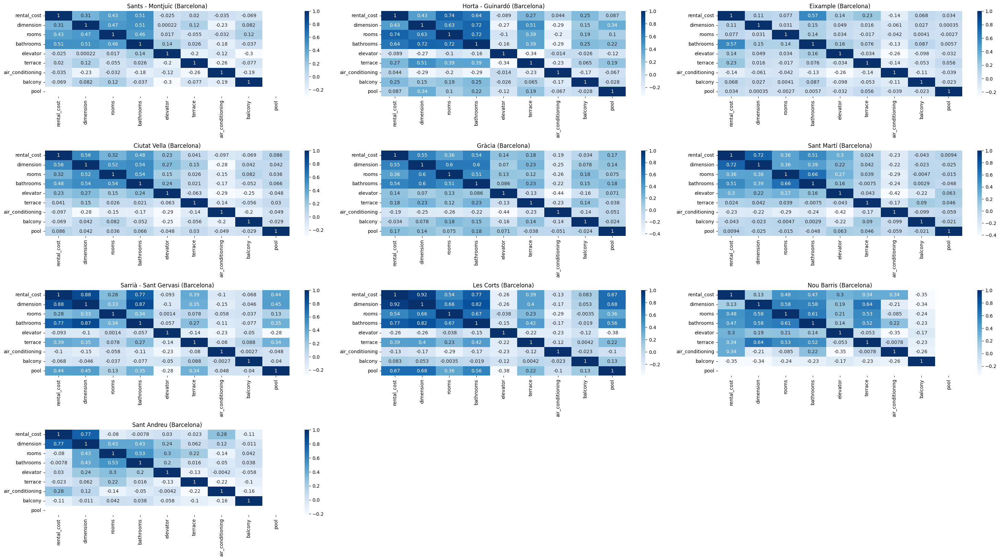

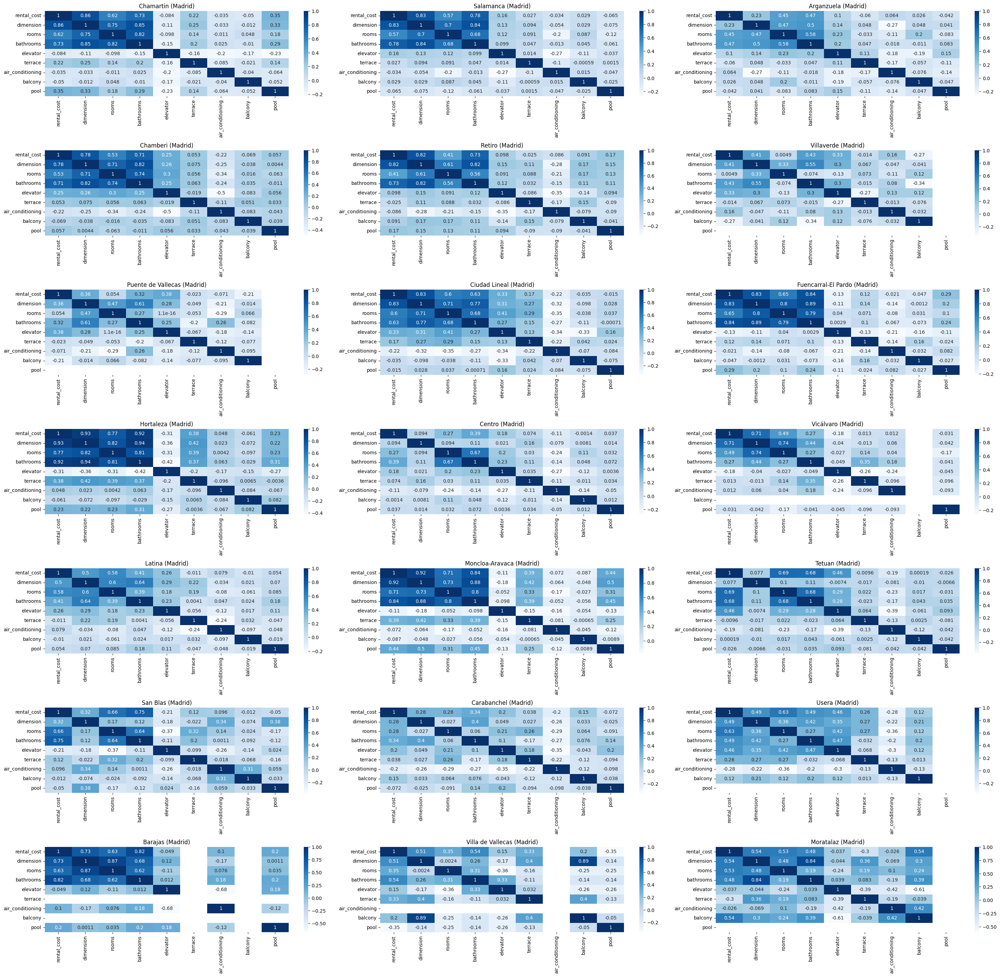

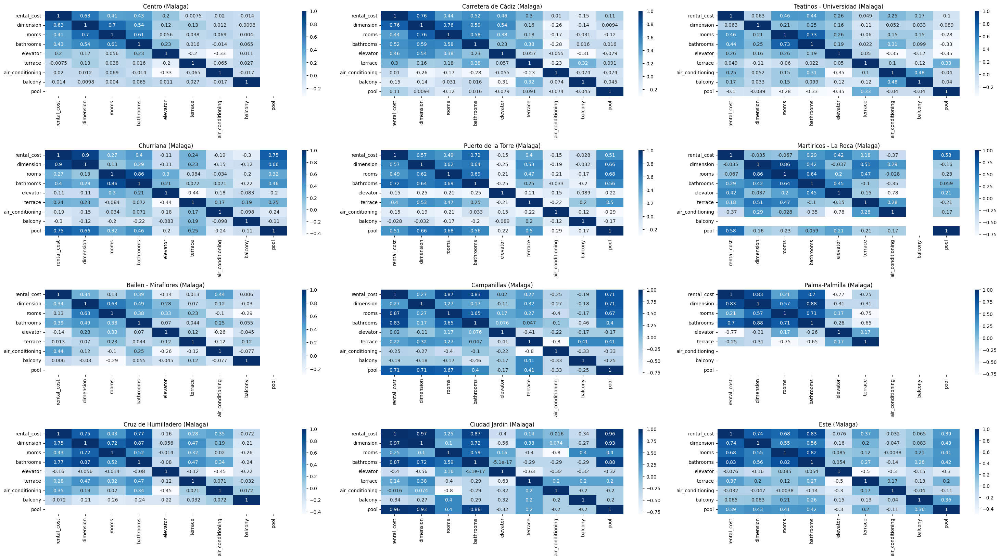

In [33]:
n_cols = 3
n_rows = math.ceil(num_distritos_madrid_malaga_bcn / n_cols)

for city in df['city'].unique():
    position = 0
    fig = plt.figure(figsize=(30, 60))
    for district  in df[df['city'] == city]["district"].unique():
        position += 1
        
        df_district = df[(df["district"] == district)&(df["city"] == city)]
    
        ax = fig.add_subplot(n_rows, n_cols, position)
        plt.title(f"{district} ({city})", fontsize = 12)
        sns.heatmap(data = df_district[["rental_cost",
                            "dimension",
                            "rooms",
                            "bathrooms",
                            "elevator",
                            "terrace",
                            "air_conditioning",
                            "balcony",
                            "pool"]].corr(),
                    annot = True,
                    cmap = "Blues",
                    ax = ax)

        ax.set_title(f"{district} ({city})", fontsize = 12)
    plt.tight_layout()
    plt.show()

##### 5.4.1.1 Definición de variables significativas, eliminando las columnas que no contengan valores > 0.5.

In [56]:
df_corr = df.groupby(["city","district"])[["rental_cost",
                            "dimension",
                            "rooms",
                            "bathrooms",
                            "elevator",
                            "terrace",
                            "air_conditioning",
                            "balcony",
                            "pool"]].corr()

In [57]:
def correlation(dataset, threshold):
    col_corr = set() # Set of all the names of deleted columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i, j] <= threshold) and (corr_matrix.columns[j] not in col_corr):
                colname = corr_matrix.columns[i] # getting the name of column
                col_corr.add(colname)
                if colname in dataset.columns:
                    del dataset[colname] # deleting the column from the dataset

In [58]:
correlation(df_corr, 0.5)

In [59]:
significant_variables = df_corr.columns

In [60]:
df_corr.to_csv("Data/df_corr.csv")

#### 5.5.2 Correlación acumulada

##### Creacion funcion para medir la importacia de cada una de las variables en cualquier df que queramos

In [54]:
def acumulative_corr(df, correlation_columns: list, column_to_iterate: str):
    x = np.linspace(df[column_to_iterate].min(), df[column_to_iterate].max(), 75)
    plt.figure(figsize=(20, 6))  
    for hue in correlation_columns:
        correlations = []
        for corr in x:
            subset = df[df[column_to_iterate] <= corr]
            correlation = subset[hue].corr(subset[column_to_iterate])
            correlations.append(correlation)
        
        sns.lineplot(x=x, y=correlations, label=hue) 
    
    plt.xlabel(f"{column_to_iterate}")
    plt.ylabel('Correlacion')
    plt.title(f"Correlacion de {', '.join(correlation_columns)} conforme aumenta {column_to_iterate}")
    plt.legend()  
    plt.show()

##### Visualización para las tres ciudades: Barcelona, Madrid, Malaga

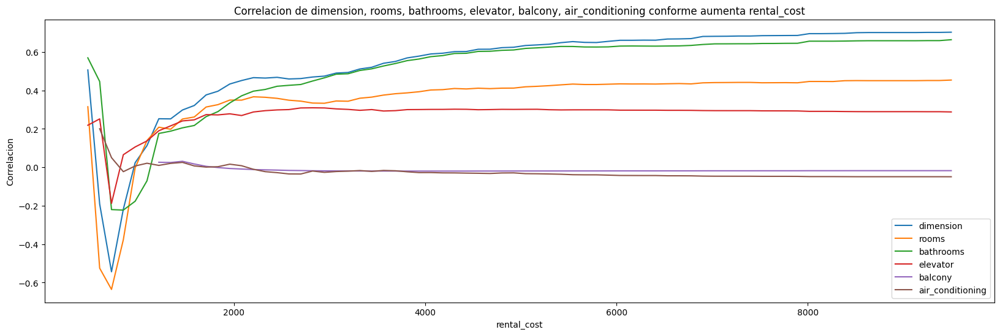

In [55]:
acumulative_corr(df_no_outliers, ["dimension", "rooms", "bathrooms", "elevator","balcony","air_conditioning"], "rental_cost")

#### 5.5.3 HEATMAP: reducción precios con tiempo de publicación

In [ ]:
df_con_rebajas = df[df["price_reduction_amount"] != 0]

df_con_rebajas.head(3)

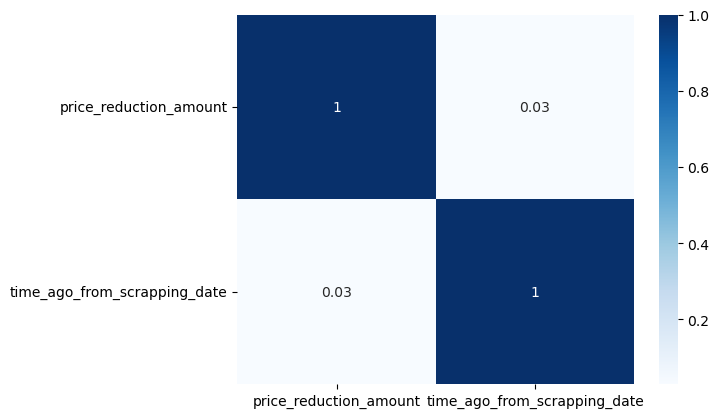

In [15]:
sns.heatmap(data = df_con_rebajas[["price_reduction_amount",
            "time_ago_from_scrapping_date"]].corr(),
            annot = True,
            cmap = "Blues")   
    
plt.show()

#### 5.5.4 Correlación entre el porcentaje de anuncios con rebajas hay segun los dias 
Se hace junto con los outliers porque es la proporción, no el valor como tal.

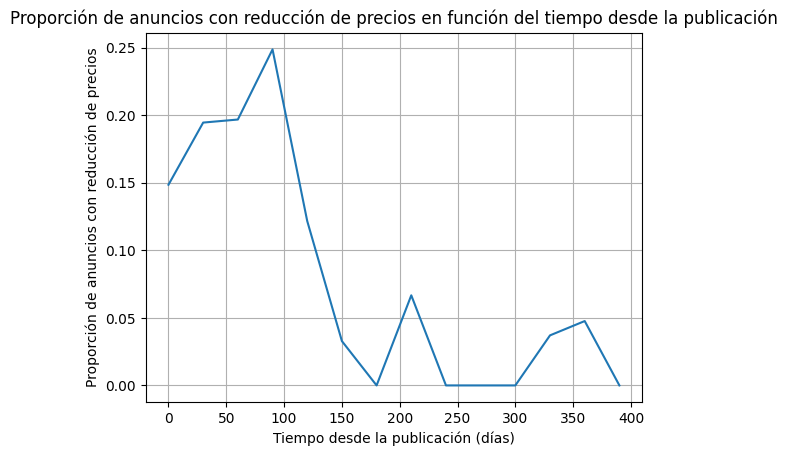

In [92]:

df_analisis = df[["time_ago_from_scrapping_date","price_reduction_amount"]]
time_ranges = range(0, 400, 30)
proportion_with_reduction = []

for t in time_ranges:
    ads_with_reduction_in_range = df_analisis[(df_analisis["time_ago_from_scrapping_date"] >= t) & 
                                              (df_analisis["time_ago_from_scrapping_date"] < t + 30) & #para que no siempre haya valores en concreto 0. 
                                              (df_analisis["price_reduction_amount"] != 0)]
    ads_in_range = df_analisis[(df_analisis["time_ago_from_scrapping_date"] >= t) & 
                                (df_analisis["time_ago_from_scrapping_date"] < t + 30)]
    proportion = len(ads_with_reduction_in_range) / len(ads_in_range)
    proportion_with_reduction.append(proportion)

plt.plot(time_ranges, proportion_with_reduction)
plt.xlabel('Tiempo desde la publicación (días)')
plt.ylabel('Proporción de anuncios con reducción de precios')
plt.title('Proporción de anuncios con reducción de precios en función del tiempo desde la publicación')
plt.grid()
plt.show()



In [28]:
from scipy.stats import ttest_ind
df_analisis = df[["price_reduction_amount", "time_ago_from_scrapping_date"]]

# Dividir los datos en dos grupos: con y sin rebaja
with_reduction = df_analisis[df_analisis["price_reduction_amount"] != 0]["time_ago_from_scrapping_date"]
without_reduction = df_analisis[df_analisis["price_reduction_amount"] == 0]["time_ago_from_scrapping_date"]

# Realizar la prueba t de Student
t_statistic, p_value = ttest_ind(with_reduction, without_reduction)

print("Estadística t:", t_statistic)
print("Valor p:", p_value)


Estadística t: -5.667276163305031
Valor p: 1.5019569261773702e-08


In [71]:
from scipy.stats import mannwhitneyu

# Realizar la prueba de Mann-Whitney U
statistic, p_value = mannwhitneyu(with_reduction, without_reduction, alternative='two-sided')

print("Estadística de prueba de Mann-Whitney U:", statistic)
print("Valor p:", p_value)


Estadística de prueba de Mann-Whitney U: 4383461.0
Valor p: 0.0003895436424678453


##### GPT: Con base en la prueba t de Student realizada y de mannwhitneyu, la estadística de t y de mann-whitney negativa indica que hay una diferencia significativa en el tiempo que llevan los anuncios de los pisos en el portal inmobiliario entre los que tienen una rebaja de precio y los que no la tienen. En particular, los anuncios de pisos con rebajas de precio tienden a ser más recientes, es decir, llevan menos tiempo publicados en comparación con los anuncios de pisos sin rebaja de precio.

##### GPT: El valor p extremadamente pequeño (aproximadamente 1.50e-08) indica una alta certeza de esta diferencia observada. Por lo tanto, podemos concluir que hay una asociación significativa entre el tiempo transcurrido desde la publicación del anuncio y si el precio del piso ha sido reducido, lo que sugiere que las propiedades con rebajas tienden a ser publicadas más recientemente en el portal inmobiliario.

###  hemos concluido que:                                         μ_with_reduction ≠ μ_without_reduction

#### Fer: realmente creo que lo que pasa es que las propiedades que tienen "rebajas" tieneden a tener menor tiempo en la plataforma porque la gente las compra antes. Deberiamos hacer otras pruebas pero nos es imposible acceder a esa informacion. Es una conclusion a nivel general

## 6 Visualización

In [2]:
df = pd.read_csv("Data/df_fotocasa_bcn-mad-mlg.csv")
df_no_outliers = pd.read_csv("Data/df_no_outliers-no_nan_bcn-mad-mlg.csv")

In [5]:
df_no_outliers.count()

rental_cost         7125
dimension           7029
rooms               7085
bathrooms           6994
elevator            6488
terrace             6275
air_conditioning    6130
balcony             6583
pool                6967
id                  7125
city                7125
district            7125
type                7125
floor               3991
description         7045
real_estate         5512
url                 7125
scraping_date       7125
scraping_page       7125
dtype: int64

### 6.1 Generación de Choropleth

#### 6.1.1 Choropleth Barcelona

##### 6.1.1.1 Generación de DF sin outliers de media de precio y €/m2 de Barcelona

In [6]:
df_barcelona_no_outliers = df_no_outliers[df_no_outliers["city"] == "Barcelona"]

df_no_outliers_mean_barcelona = df_barcelona_no_outliers.groupby(['city','district']).mean(numeric_only=True)["rental_cost"] / df_barcelona_no_outliers.groupby(['city','district']).mean(numeric_only=True)["dimension"]
df_no_outliers_mean_barcelona = df_no_outliers_mean_barcelona.reset_index()
df_no_outliers_mean_barcelona = df_no_outliers_mean_barcelona.rename(columns = {0:"euro_per_m2"})
df_no_outliers_mean_barcelona = pd.merge(df_no_outliers_mean_barcelona, df_barcelona_no_outliers.groupby('district').mean(numeric_only=True)["rental_cost"].reset_index(), on = "district", how = "inner")

##### 6.1.1.2 Generación de columnas con centroide de distritos y mergeado con DF de medias

In [7]:
city_geo = "Data/districtes.geojson"
df_geo_barcelona = gpd.read_file(city_geo)
df_geo_barcelona["lon"] = df_geo_barcelona["geometry"].centroid.x
df_geo_barcelona["lat"] = df_geo_barcelona["geometry"].centroid.y
df_geo_barcelona = df_geo_barcelona.rename(columns={'NOM':'district'})

df_no_outliers_mean_barcelona = pd.merge(df_no_outliers_mean_barcelona, df_geo_barcelona[['district', 'lat', 'lon']], on = 'district', how = 'inner')

C:\Users\alfre\AppData\Local\Temp\ipykernel_2296\3891268486.py:3: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


C:\Users\alfre\AppData\Local\Temp\ipykernel_2296\3891268486.py:4: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




##### 6.1.1.3 Añadir barplot con €/m2 y rental cost medio para saber como influye cada distrito en los mismos

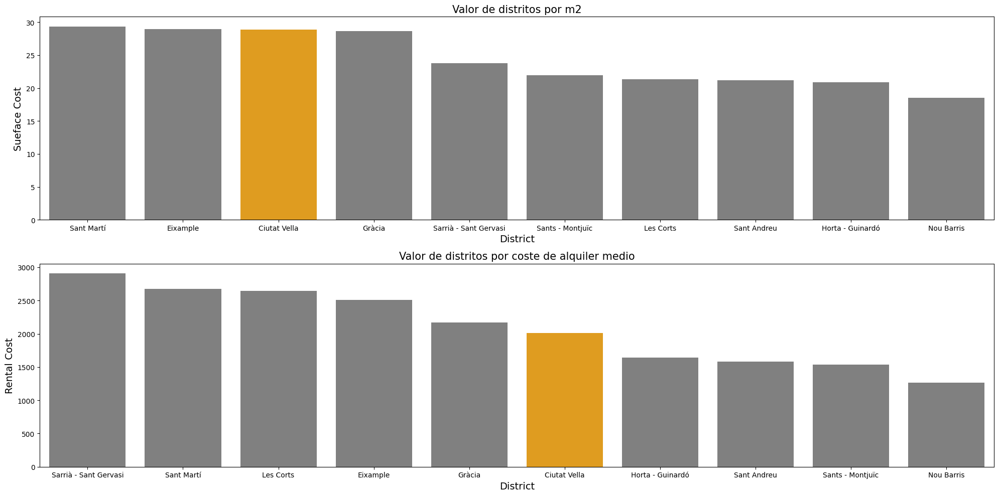

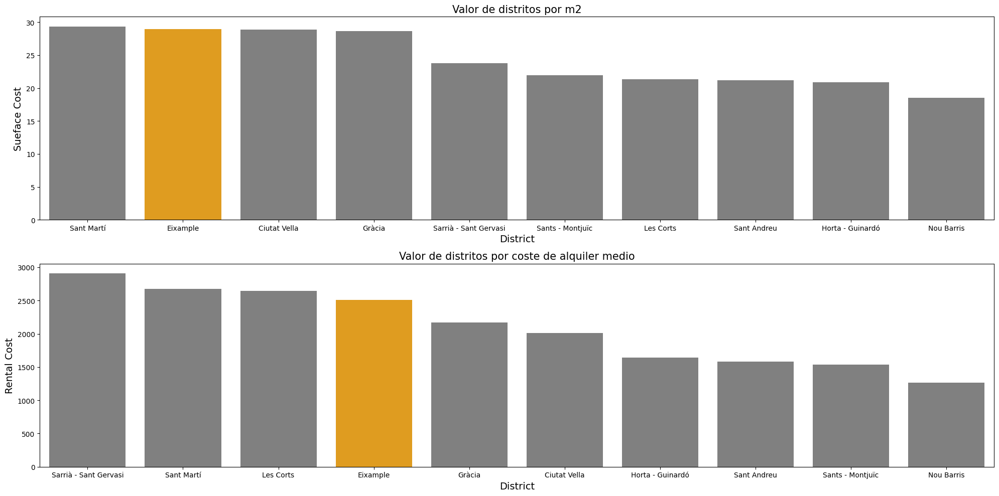

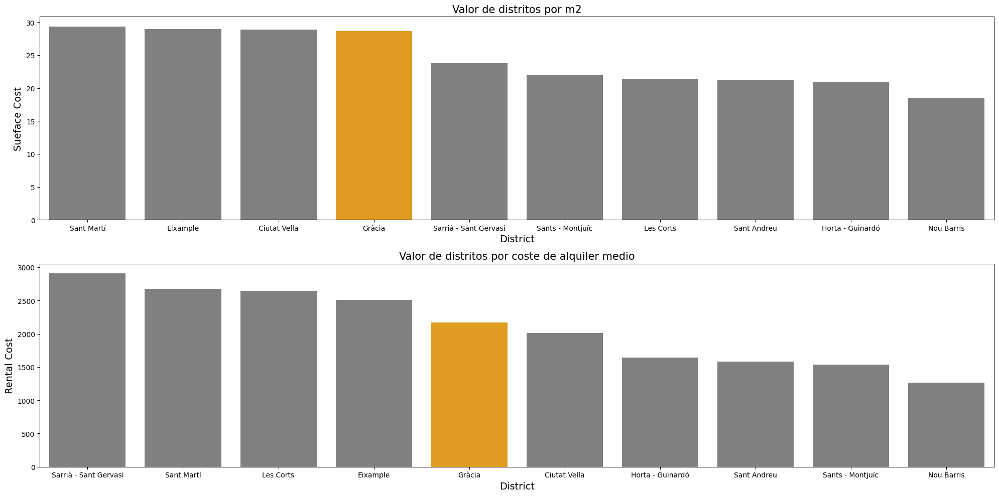

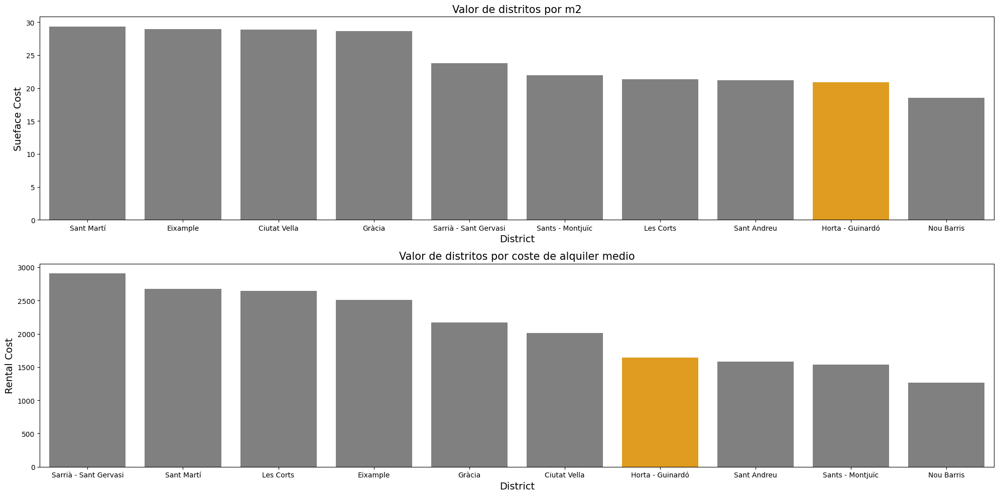

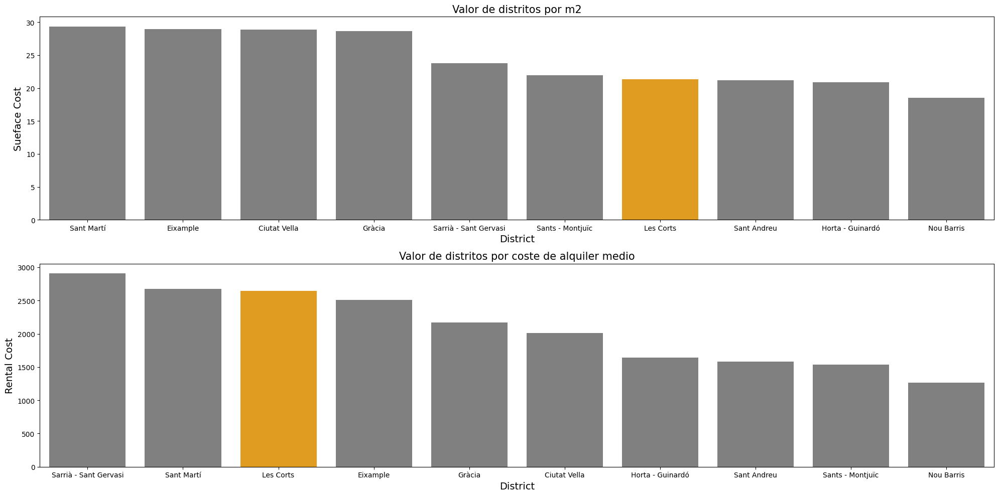

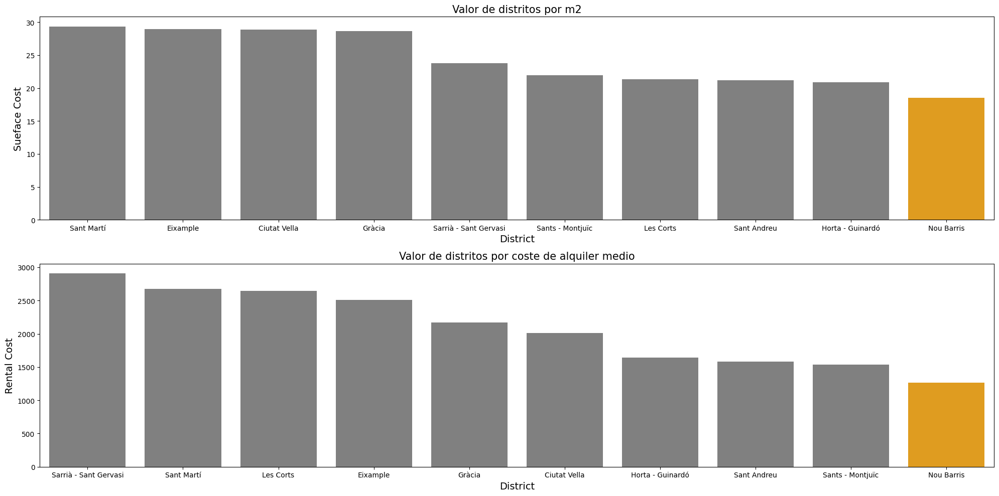

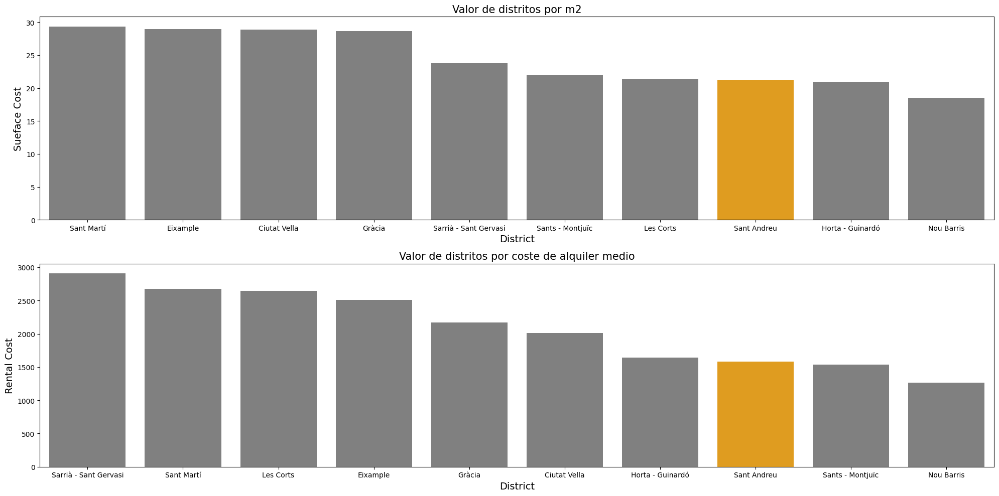

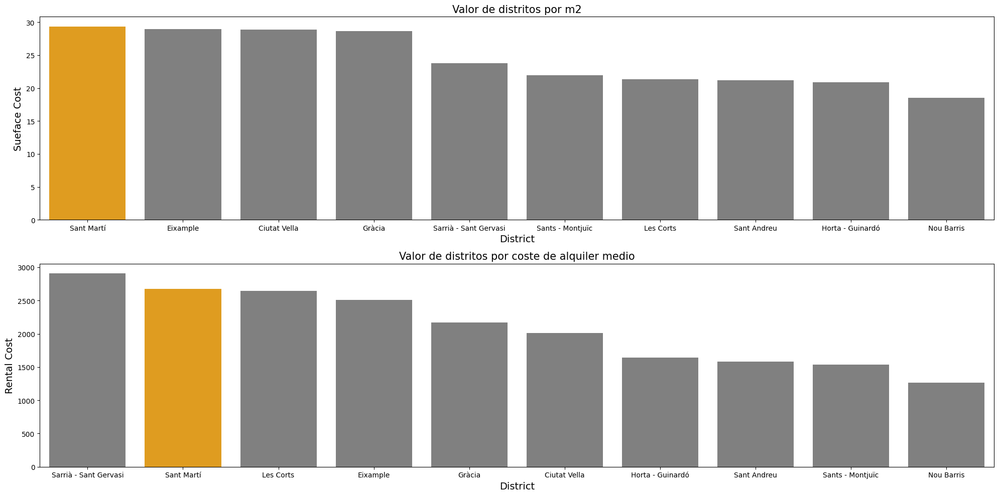

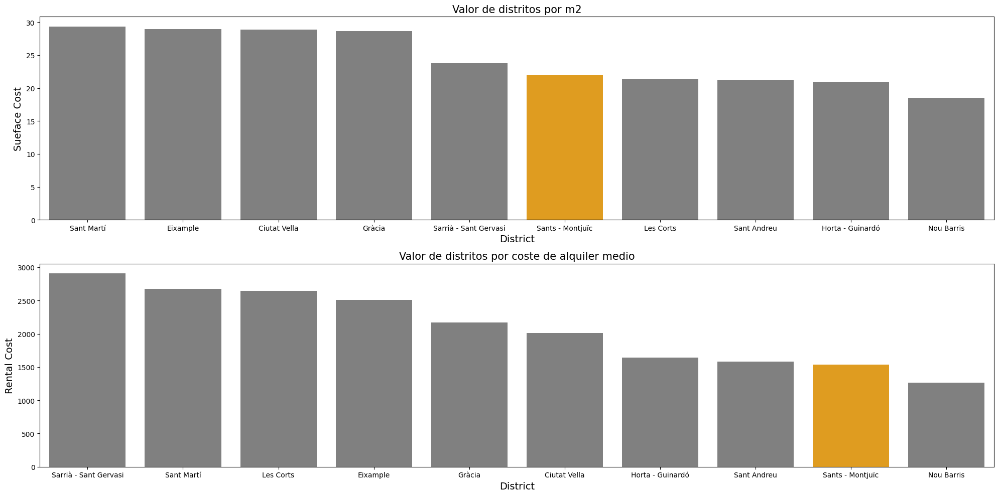

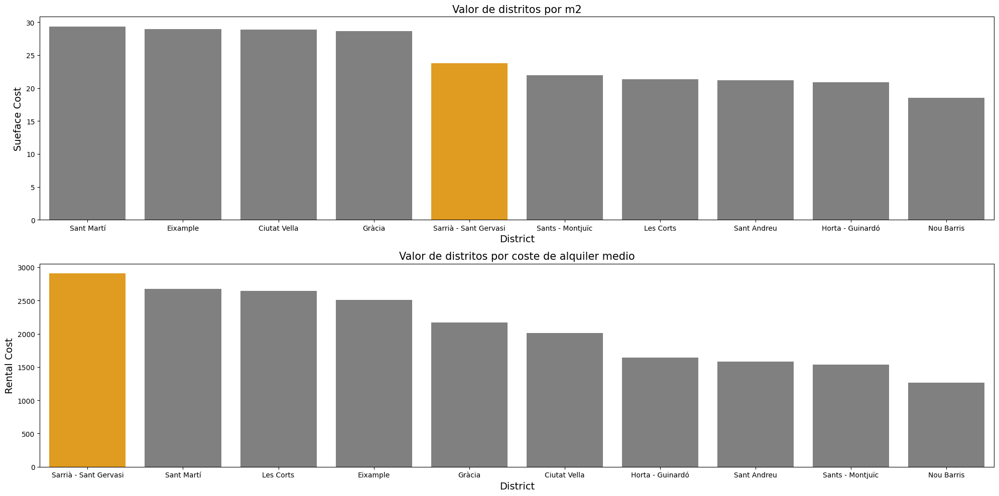

In [9]:
for district in df_no_outliers_mean_barcelona["district"].unique():
    cols = ['grey' if (x != district) else 'orange' for x in df_no_outliers_mean_barcelona["district"].unique()]    
    fig = plt.figure(figsize=(20, 10))
    ax1 = fig.add_subplot(2, 1, 1)
    ax1.set_title(f"Valor de distritos por m2", fontsize = 15)
    sns.barplot(data = df_no_outliers_mean_barcelona, 
                x = "district", 
                y = "euro_per_m2", 
                order = df_no_outliers_mean_barcelona.sort_values('euro_per_m2', ascending = False)['district'],
                ax = ax1,
                hue = "district",
                palette = cols)
    plt.xlabel('District', fontsize=14)
    plt.ylabel('Sueface Cost', fontsize=14)   
    ax2 = fig.add_subplot(2, 1, 2)
    ax2.set_title(f"Valor de distritos por coste de alquiler medio", fontsize = 15)    
    sns.barplot(data = df_no_outliers_mean_barcelona, 
                x = "district", 
                y = "rental_cost", 
                order = df_no_outliers_mean_barcelona.sort_values('rental_cost', ascending = False)['district'],
                ax = ax2,
                hue = "district", 
                palette = cols)
    plt.xlabel('District', fontsize=14)
    plt.ylabel('Rental Cost', fontsize=14)
    
    plt.tight_layout()
    plt.savefig(f'barplot_bcn_{district}.png')
    plt.show()

##### 6.1.1.4 Generación de mapa Choropleth de €/m2 por distrito y con markers de precio medio

In [10]:
lat = 40.463667
lng = -3.74922

city_map = folium.Map(location = [lat, lng], zoom_start = 11.4)
costs_by_district = folium.map.FeatureGroup()
   
for name, lat, lng, rental_cost, ind, euro_per_m2 in zip(df_no_outliers_mean_barcelona['district'],
                                                         df_no_outliers_mean_barcelona["lat"],
                                                         df_no_outliers_mean_barcelona["lon"],
                                                         df_no_outliers_mean_barcelona["rental_cost"],
                                                         df_no_outliers_mean_barcelona.index,
                                                         df_no_outliers_mean_barcelona["euro_per_m2"]):

    with open(f'barplot_bcn_{name}.png', 'rb') as f:
        encoded_string = f"data:image/png;base64,{base64.b64encode(f.read()).decode()}"

    html = f'''<div style="white-space: nowrap; text-align: center; font-family: sans-serif">
                    Distrito: {name}<br>
                    Precio medio: {round(rental_cost,0)}<br>
                    € / m2: {round(euro_per_m2,1)}<br>
                </div>
                <div>
                    <img src="{encoded_string}" alt="barplot" style="width: 800px;" id="img_{ind}">
                </div>'''
    
    popup = folium.Popup(html, max_width=1050)
    
    costs_by_district.add_child(folium.Marker(location = [lat, lng],
                                      icon     = folium.DivIcon(html=
                                        f"""<div style="white-space: nowrap; text-align: center; font-family: "Gill Sans", sans-serif; color: black; font-size: x-small">
                                        {df_no_outliers_mean_barcelona['district'].iloc[ind]}</div>"""),
                                      popup = popup))

city_map.add_child(costs_by_district)
folium.Choropleth(geo_data = city_geo,
                  data     = df_no_outliers_mean_barcelona,  # Utilizamos el DataFrame con la media del costo de alquiler por distrito
                  columns  = ["district", "euro_per_m2"],
                  key_on   = "feature.properties.NOM",
                  name = "geometry",
                  fill_color   = "YlOrRd",
                  fill_opacity=0.7,
                  line_opacity=0.5,
                  legend_name="Media de euros por m2").add_to(city_map)

city_map.save("Data/mapa_bcn.html")

#### 6.1.2 Choropleth Madrid

##### 6.1.2.1 Generación de DF sin outliers de media de precio y €/m2 de Madrid

In [13]:
# Filtra los datos para obtener solo los de Barcelona
df_madrid_no_outliers = df_no_outliers[df_no_outliers["city"] == "Madrid"]
df_madrid_no_outliers.replace({"Vicálvaro" : "Vicalvaro"}, inplace=True)
#Generación de DF con medias de rental_cost y de euro/m2.
df_no_outliers_mean_madrid = df_madrid_no_outliers.groupby(['city','district']).mean(numeric_only=True)["rental_cost"] / df_madrid_no_outliers.groupby(['city','district']).mean(numeric_only=True)["dimension"]
df_no_outliers_mean_madrid = df_no_outliers_mean_madrid.reset_index()
df_no_outliers_mean_madrid = df_no_outliers_mean_madrid.rename(columns = {0:"euro_per_m2"})
df_no_outliers_mean_madrid = pd.merge(df_no_outliers_mean_madrid, df_madrid_no_outliers.groupby('district').mean(numeric_only=True)["rental_cost"].reset_index(), on = "district", how = "inner")

/tmp/ipykernel_17574/2541928039.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### 6.1.2.2 Generación de columnas con centroide de distritos y mergeado con DF de medias

In [14]:
city_geo = "Data/madrid-districts.geojson" # Archivo GeoJSON

df_geo_madrid = gpd.read_file(city_geo)
df_geo_madrid["lon"] = df_geo_madrid["geometry"].centroid.x
df_geo_madrid["lat"] = df_geo_madrid["geometry"].centroid.y
df_geo_madrid = df_geo_madrid.rename(columns = {'name':'district'})

df_no_outliers_mean_madrid = pd.merge(df_no_outliers_mean_madrid, df_geo_madrid[['district', 'lat', 'lon']], on = 'district', how = 'inner')

/tmp/ipykernel_17574/2445666038.py:4: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/tmp/ipykernel_17574/2445666038.py:5: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




##### 6.1.2.3 Añadir barplot con €/m2 y rental cost medio para saber como influye cada distrito en los mismos

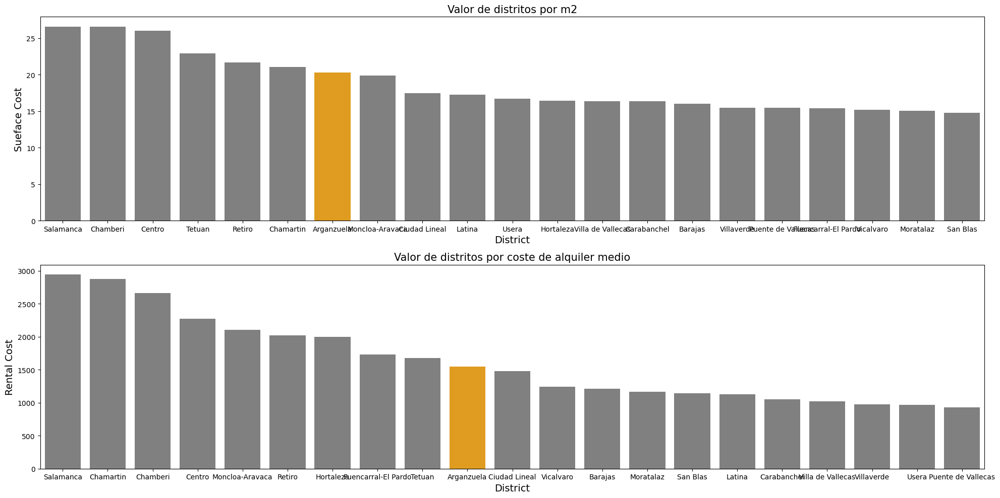

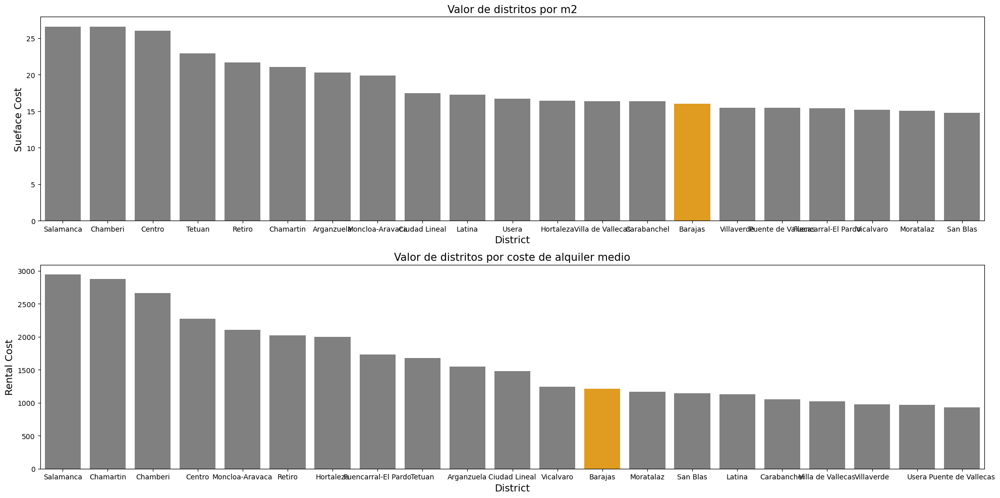

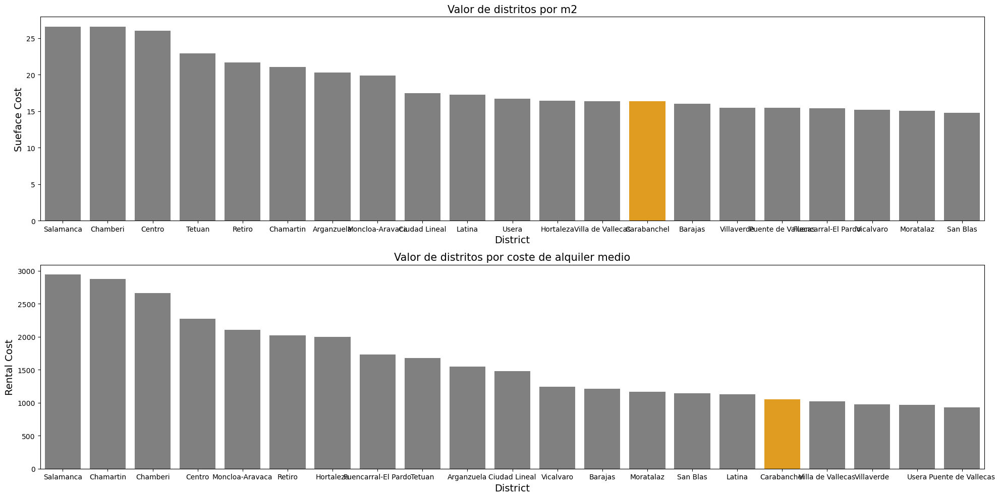

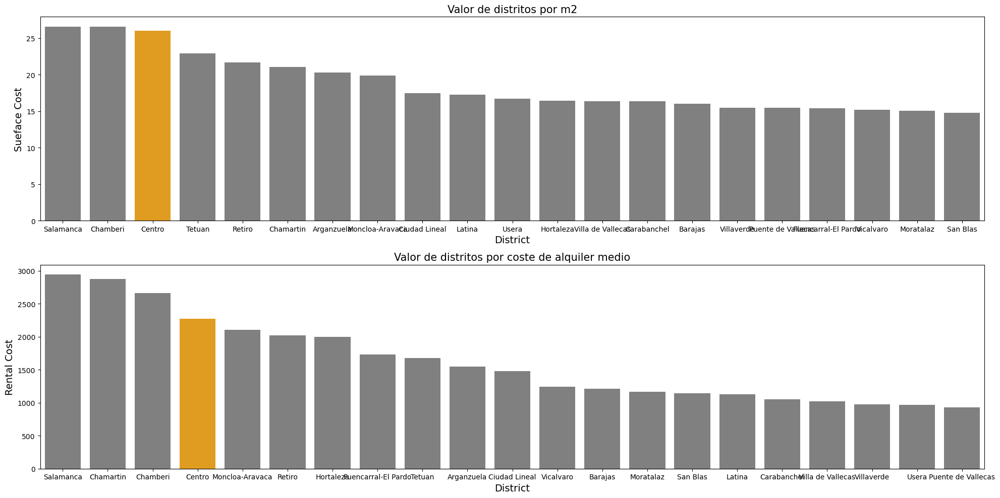

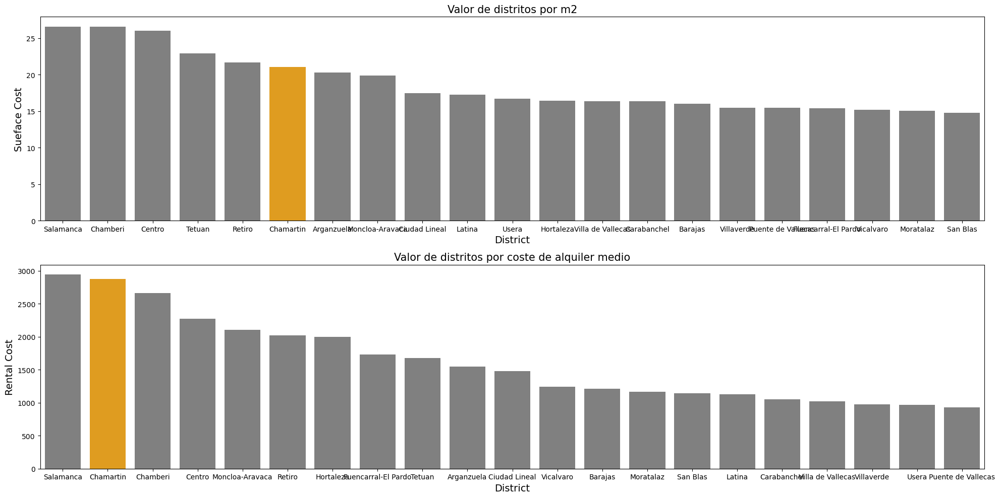

...

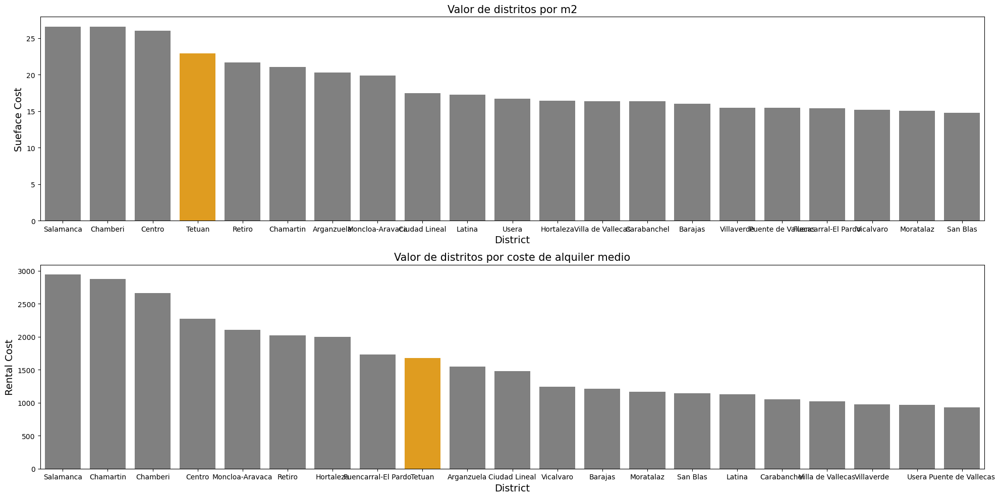

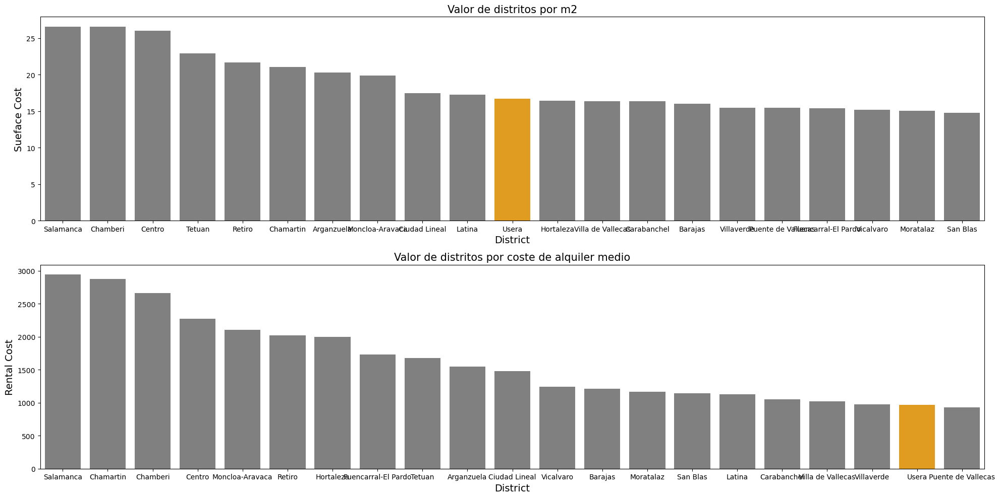

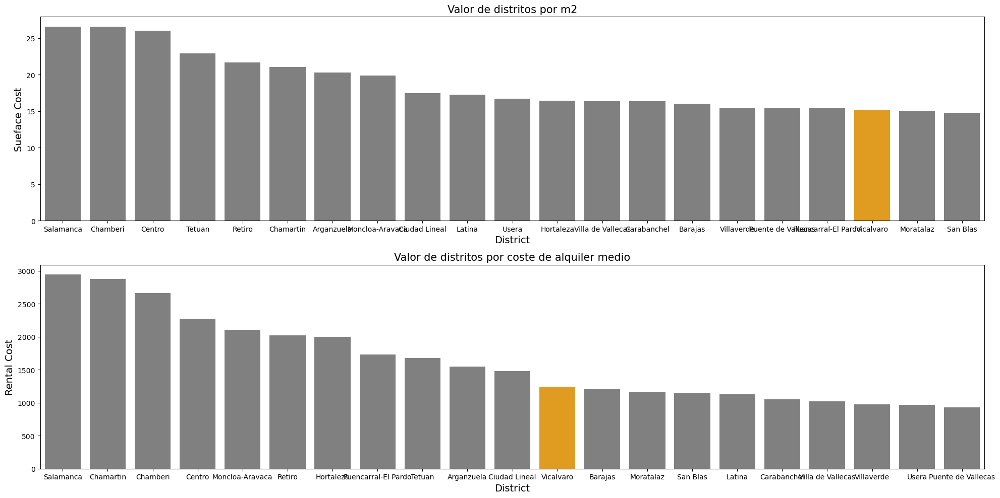

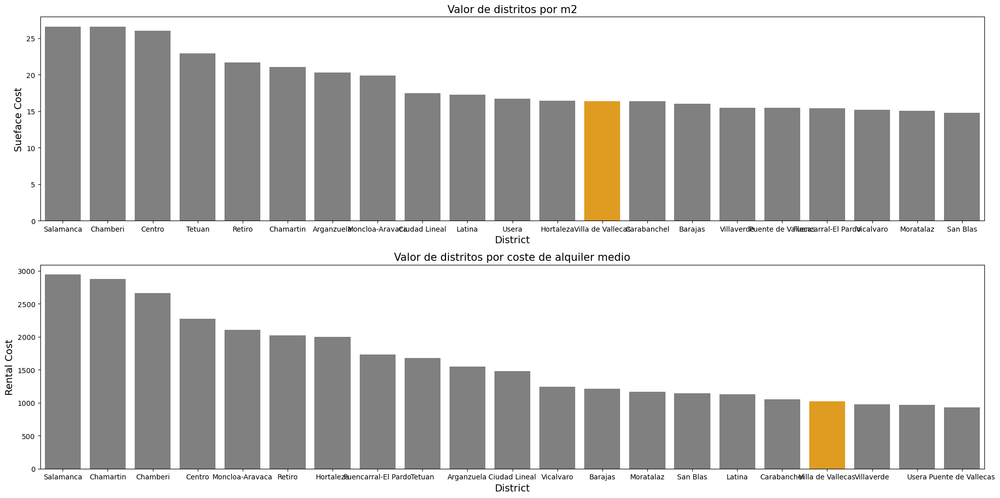

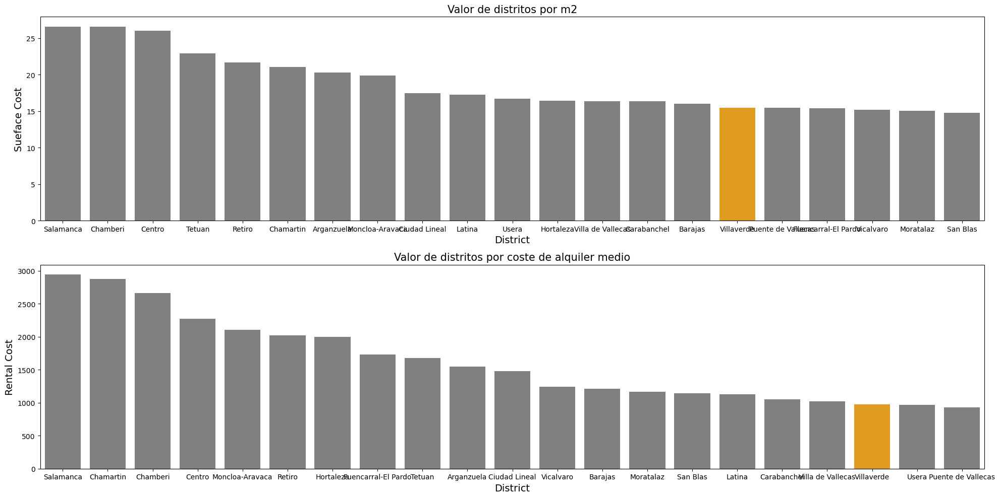

In [220]:
for district in df_no_outliers_mean_madrid["district"].unique():
    cols = ['grey' if (x != district) else 'orange' for x in df_no_outliers_mean_madrid["district"].unique()]
    
    fig = plt.figure(figsize=(20, 10))
    ax1 = fig.add_subplot(2, 1, 1)
    ax1.set_title(f"Valor de distritos por m2", fontsize = 15)
    
    sns.barplot(data = df_no_outliers_mean_madrid, 
                x = "district", 
                y = "euro_per_m2", 
                order = df_no_outliers_mean_madrid.sort_values('euro_per_m2', ascending = False)['district'],
                ax = ax1,
                hue = "district",
                palette = cols)
    plt.xlabel('District', fontsize=14)
    plt.ylabel('Sueface Cost', fontsize=14)
    
    ax2 = fig.add_subplot(2, 1, 2)
    ax2.set_title(f"Valor de distritos por coste de alquiler medio", fontsize = 15)
    
    sns.barplot(data = df_no_outliers_mean_madrid, 
                x = "district", 
                y = "rental_cost", 
                order = df_no_outliers_mean_madrid.sort_values('rental_cost', ascending = False)['district'],
                ax = ax2,
                hue = "district", 
                palette = cols)
    plt.xlabel('District', fontsize=14)
    plt.ylabel('Rental Cost', fontsize=14)
    
    plt.tight_layout()
    plt.savefig(f'barplot_madrid_{district}.png')
    plt.show()

##### 6.1.2.4 Generación de mapa Choropleth de €/m2 por distrito y con markers.


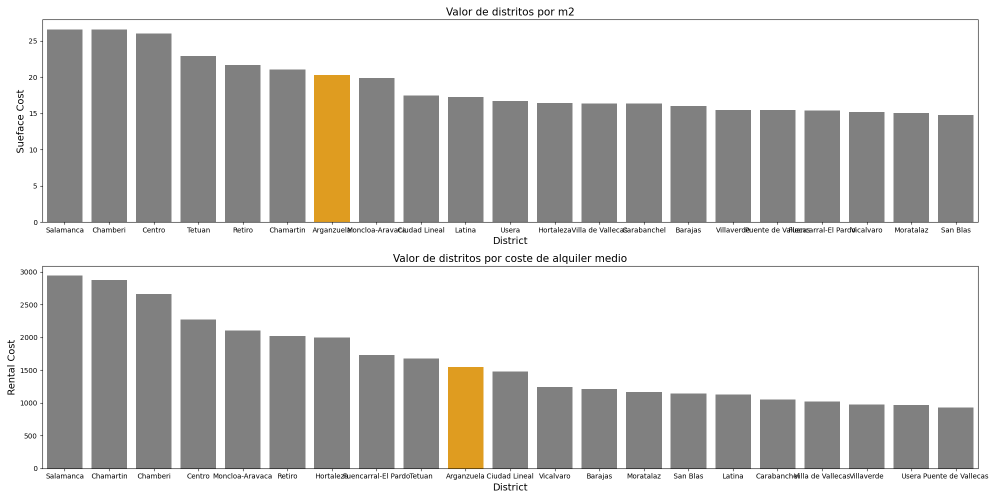
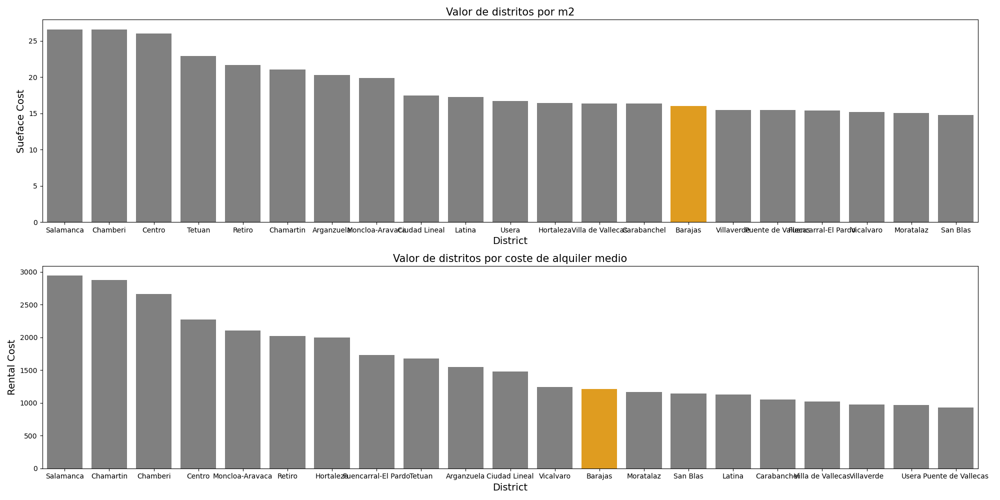
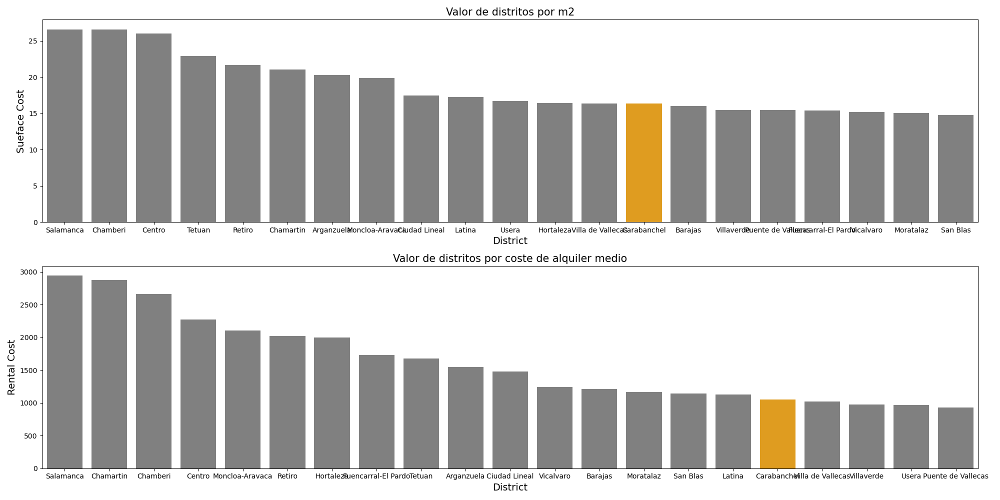
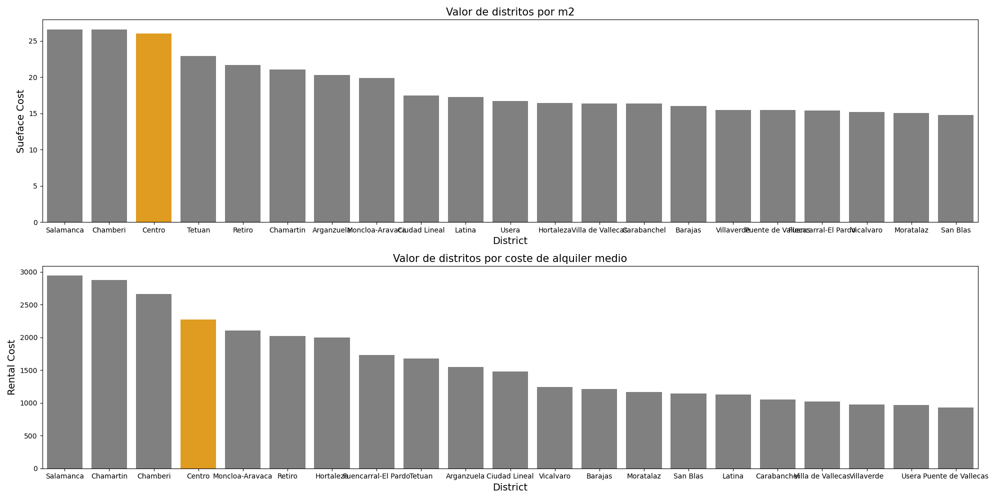
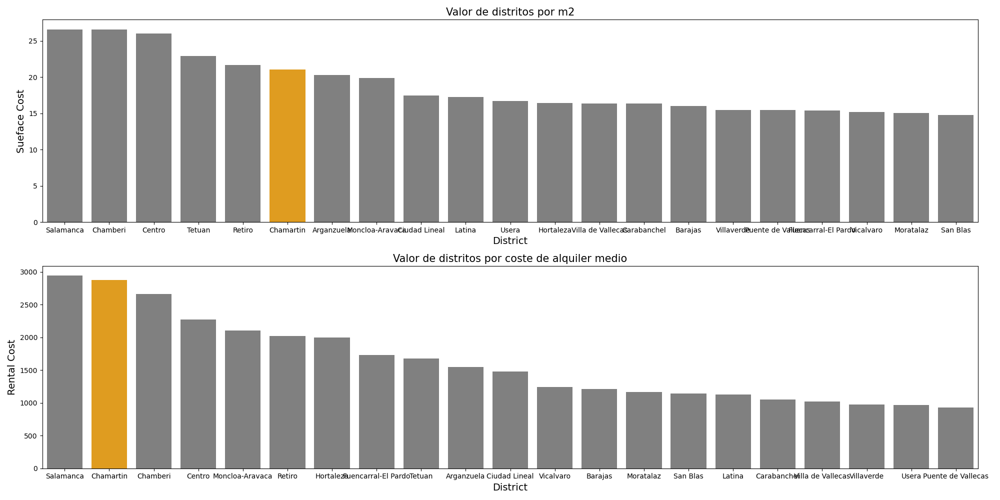
...
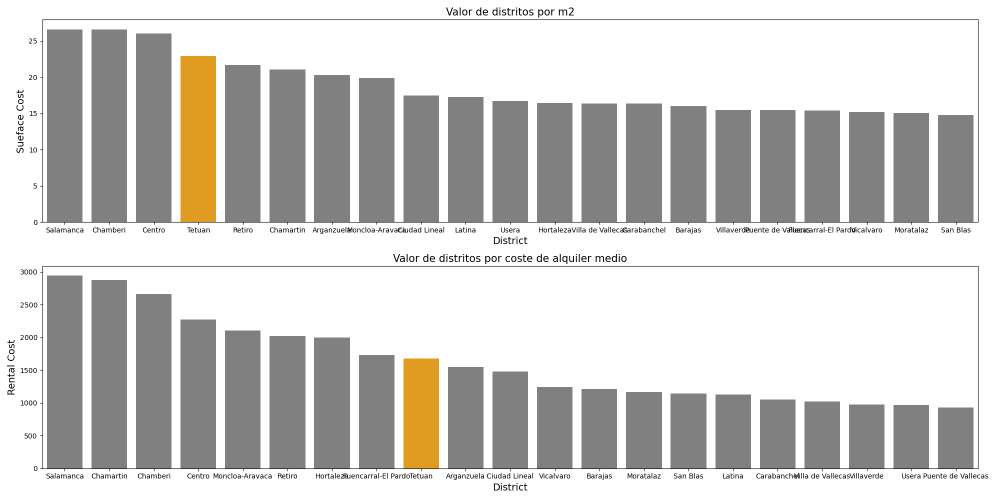
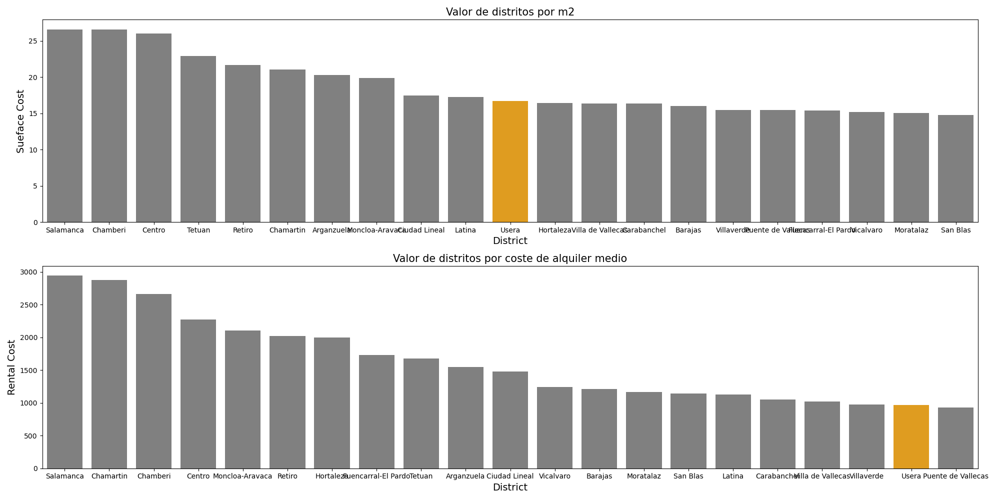
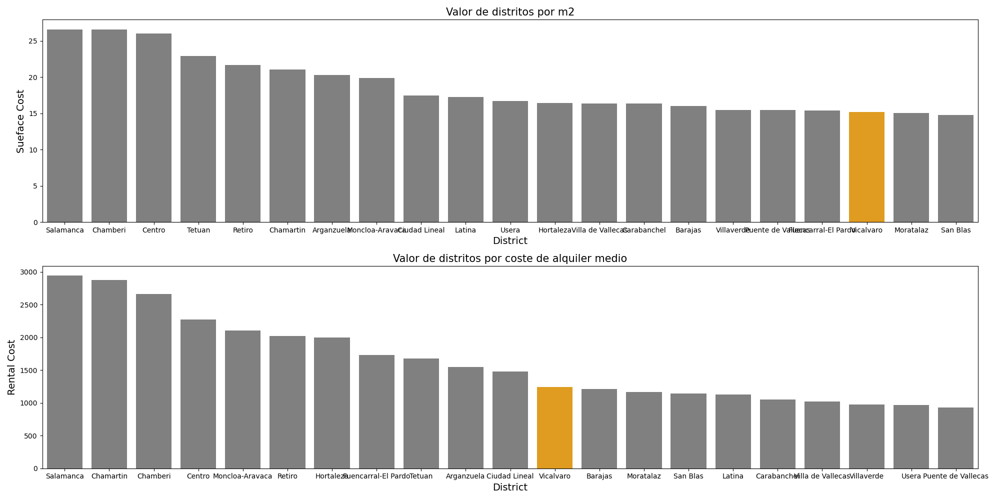
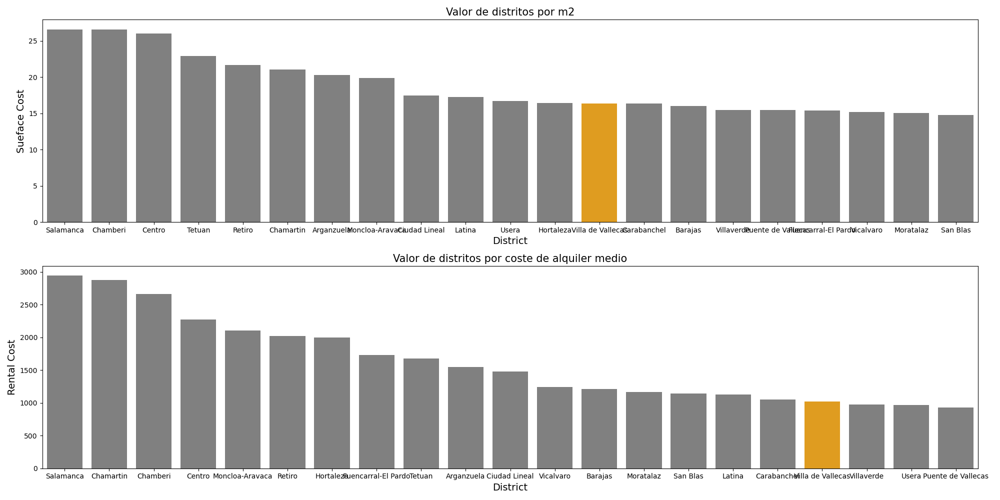
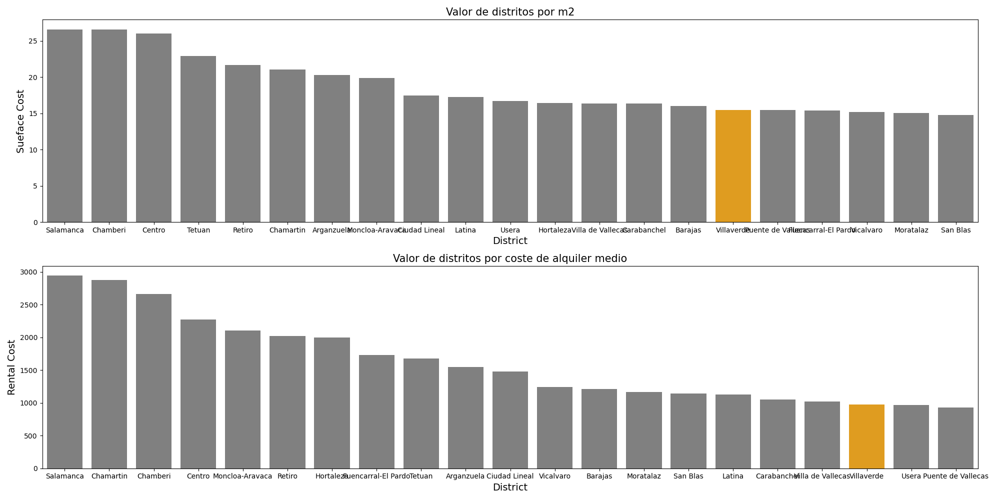

In [15]:
lat = 40.5
lng = -3.666667

city_map = folium.Map(location = [lat, lng], zoom_start = 11.4)

# Inicializamos un FeatureGroup() para los costes medios en el DataFrame
costs_by_district = folium.map.FeatureGroup()

# Recorre los costes y agrega a cada uno al FeatureGroup() de costes medios
# La columna Y y X son las coordenadas, latitud y longitud respectivamente
# La columna "rental_cost" es el coste medio.
    # Cargar imagen del gráfico de barras
   
for name, lat, lng, rental_cost, ind, euro_per_m2 in zip(df_no_outliers_mean_madrid['district'],
                                                         df_no_outliers_mean_madrid["lat"],
                                                         df_no_outliers_mean_madrid["lon"],
                                                         df_no_outliers_mean_madrid["rental_cost"],
                                                         df_no_outliers_mean_madrid.index,
                                                         df_no_outliers_mean_madrid["euro_per_m2"]):

    with open(f'barplot_madrid_{name}.png', 'rb') as f:
        encoded_string = f"data:image/png;base64,{base64.b64encode(f.read()).decode()}"
    
    # HTML para el popup
    html = f'''<div style="white-space: nowrap; text-align: center; font-family: sans-serif">
                    Distrito: {name}<br>
                    Precio medio: {round(rental_cost,0)}<br>
                    € / m2: {round(euro_per_m2,1)}<br>
                </div>
                <div>
                    <img src="{encoded_string}" alt="barplot" style="width: 800px;" id="img_{ind}">
                </div>'''
    
    # Popup con el HTML
    popup = folium.Popup(html, max_width=1050)
    
    costs_by_district.add_child(folium.Marker(location = [lat, lng],
                                      icon     = folium.DivIcon(html=f"""<div style="white-space: nowrap; text-align: center; font-family: "Gill Sans", sans-serif; color: black; font-size: x-small">{df_no_outliers_mean_madrid['district'].iloc[ind]}</div>"""),
                                      popup = popup))
# Agrega costes medios al map
city_map.add_child(costs_by_district)

folium.Choropleth(geo_data = city_geo,
                  data     = df_no_outliers_mean_madrid,  # Utilizamos el DataFrame con la media del costo de alquiler por distrito
                  columns  = ["district", "euro_per_m2"],
                  key_on   = "feature.properties.name",
                  name = "geometry",
                  fill_color   = "YlOrRd",
                  fill_opacity=0.7,
                  line_opacity=0.5,
                  legend_name="Media de euros por m2").add_to(city_map)

city_map.save("Data/mapa_madrid.html")

city_map

#### 6.1.3 Choropleth Malaga

##### 6.1.3.1 Generación de DF sin outliers de media de precio y €/m2 de Málaga

In [16]:
# Filtra los datos para obtener solo los de Barcelona
df_malaga_no_outliers = df_no_outliers[df_no_outliers["city"] == "Malaga"]
df_malaga_no_outliers.replace({"Palma-Palmilla" : "Palma - Palmilla"}, inplace=True)

#Generación de DF con medias de rental_cost y de euro/m2.
df_no_outliers_mean_malaga = df_malaga_no_outliers.groupby(['city','district']).mean(numeric_only=True)["rental_cost"] / df_malaga_no_outliers.groupby(['city','district']).mean(numeric_only=True)["dimension"]
df_no_outliers_mean_malaga = df_no_outliers_mean_malaga.reset_index()
df_no_outliers_mean_malaga = df_no_outliers_mean_malaga.rename(columns = {0:"euro_per_m2"})
df_no_outliers_mean_malaga = pd.merge(df_no_outliers_mean_malaga, df_malaga_no_outliers.groupby('district').mean(numeric_only=True)["rental_cost"].reset_index(), on = "district", how = "inner")

/tmp/ipykernel_17574/528931458.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



##### 6.1.3.2 Generación de columnas con centroide de distritos y mergeado con DF de medias

In [17]:
city_geo = "Data/Distritos_Malaga.geojson" # Archivo GeoJSON
df_geo_malaga = gpd.read_file(city_geo)
df_geo_malaga["lon"] = df_geo_malaga["geometry"].centroid.x
df_geo_malaga["lat"] = df_geo_malaga["geometry"].centroid.y
df_geo_malaga = df_geo_malaga.rename(columns={'NOMBRE':'district'})

df_no_outliers_mean_malaga = pd.merge(df_no_outliers_mean_malaga, df_geo_malaga[['district', 'lat', 'lon']], on = 'district', how = 'inner')

/tmp/ipykernel_17574/1822675028.py:3: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


/tmp/ipykernel_17574/1822675028.py:4: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




##### 6.1.3.3 Añadir barplot con €/m2 y rental cost medio para saber como influye cada distrito en los mismos

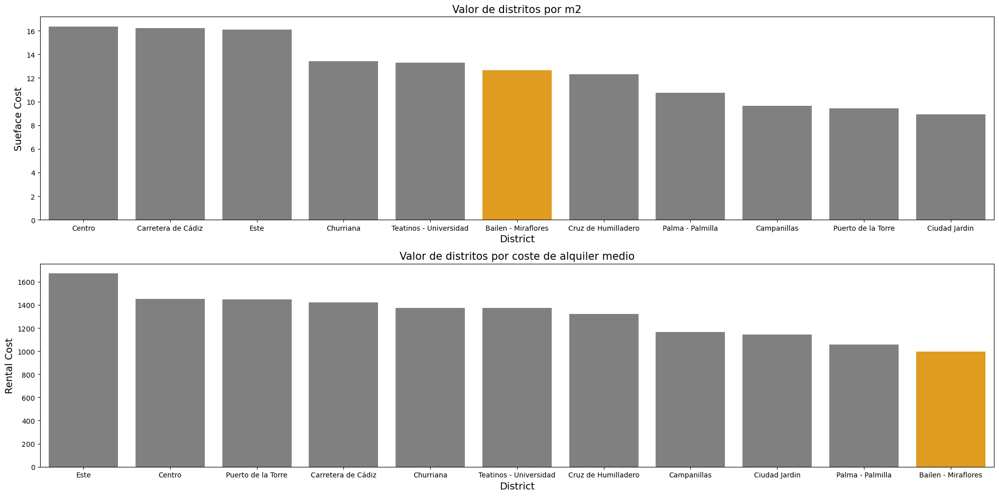

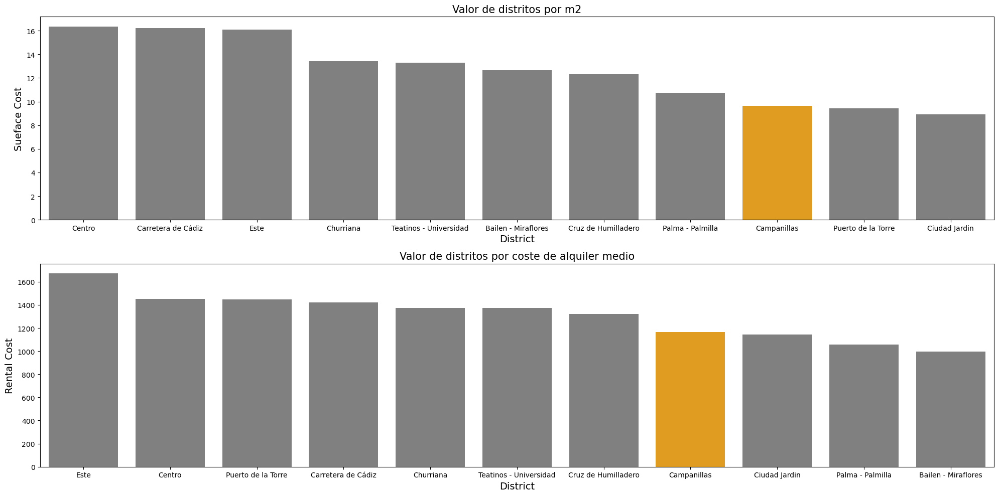

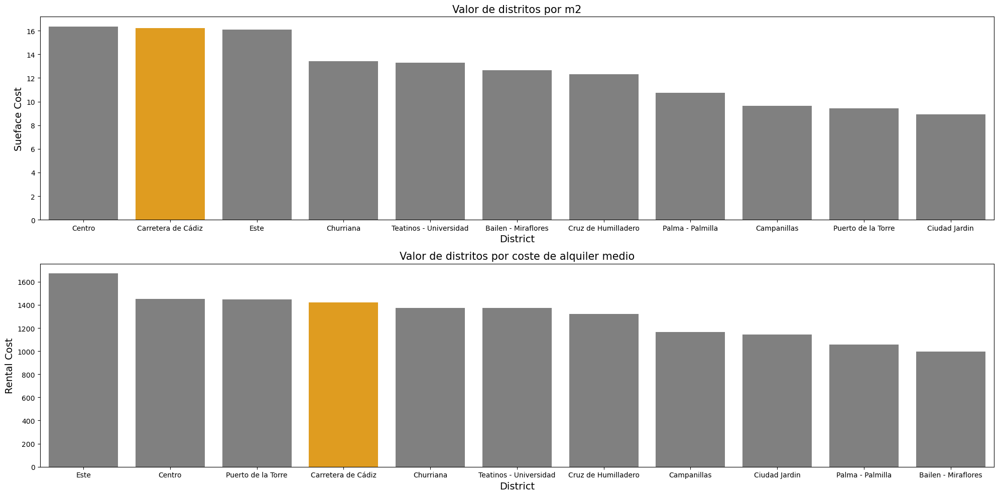

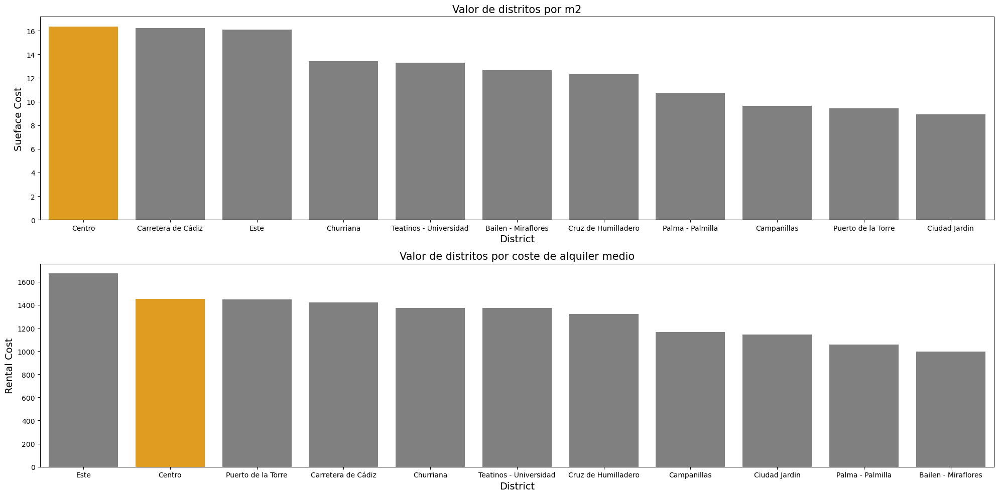

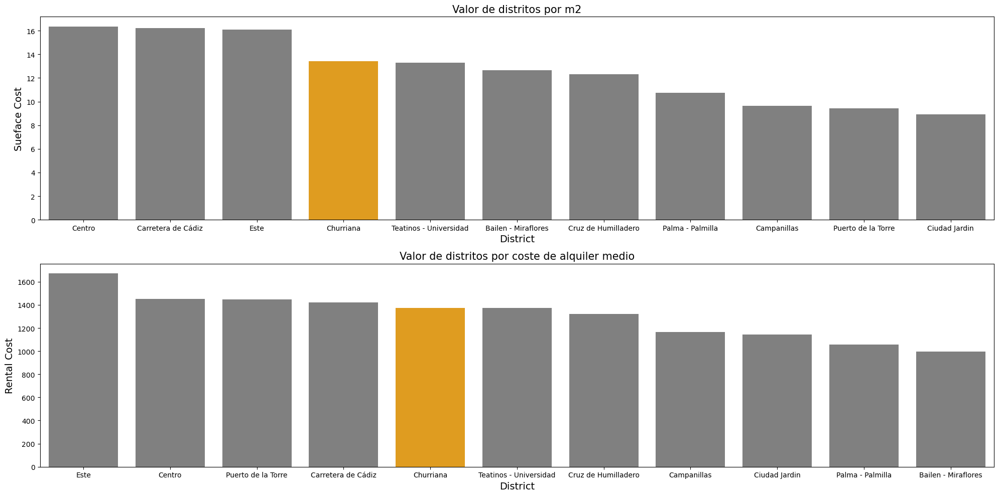

...

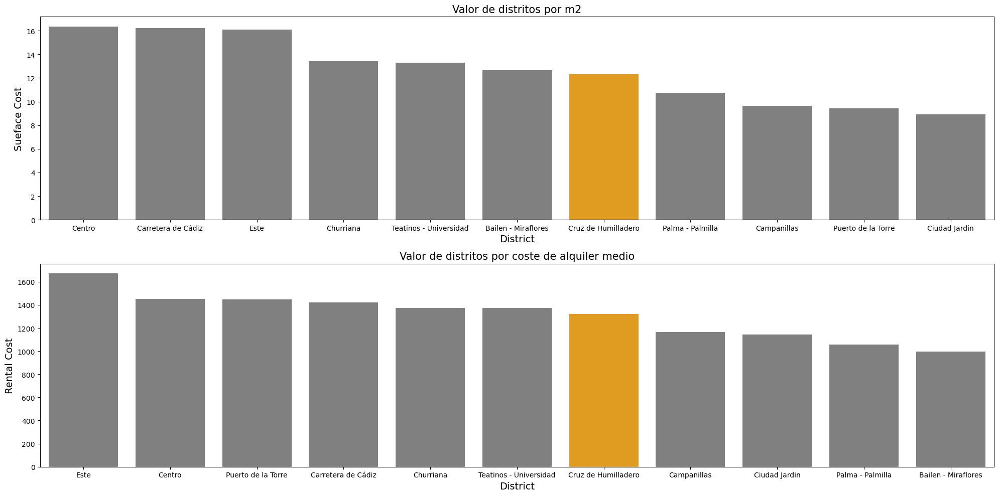

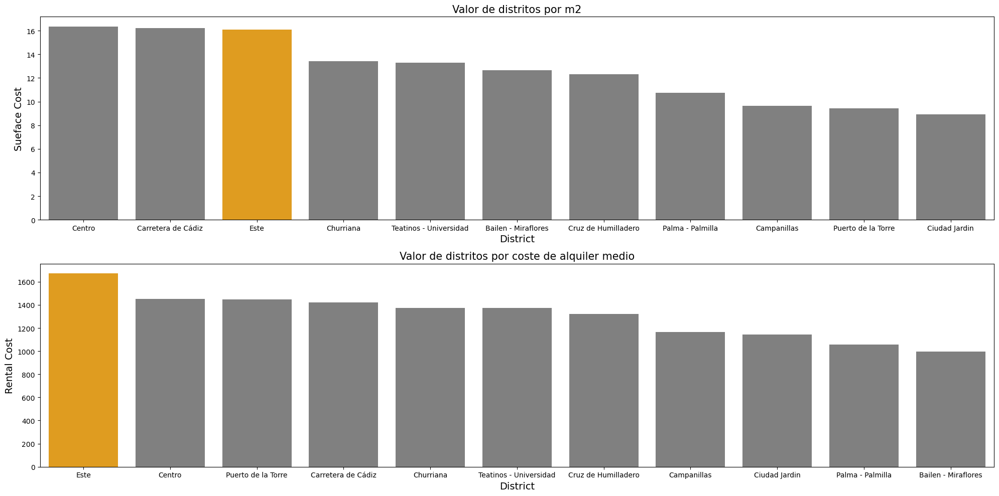

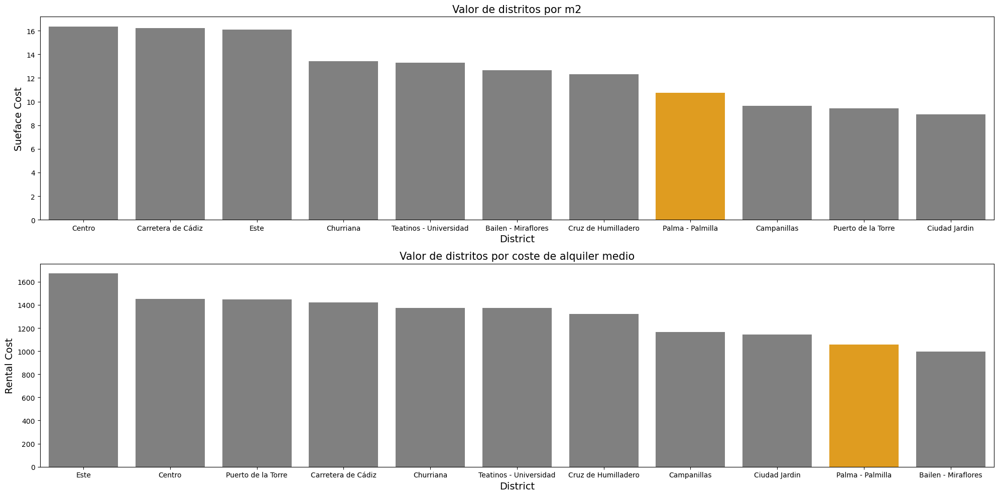

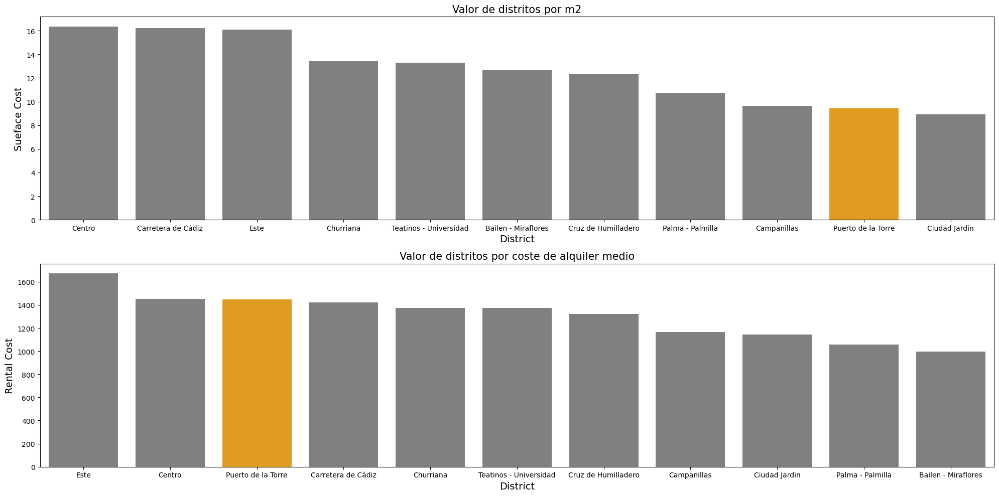

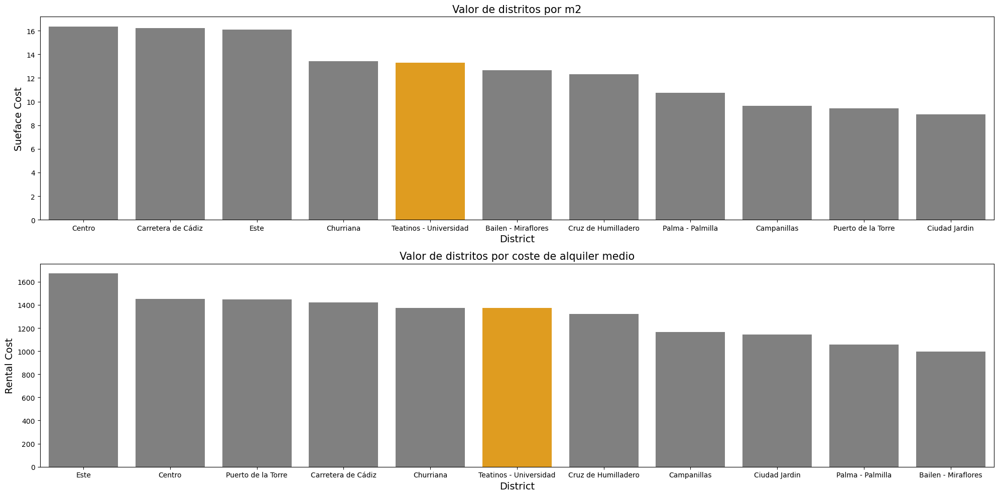

In [206]:
for district in df_no_outliers_mean_malaga["district"].unique():
    cols = ['grey' if (x != district) else 'orange' for x in df_no_outliers_mean_malaga["district"].unique()]
    
    fig = plt.figure(figsize=(20, 10))
    ax1 = fig.add_subplot(2, 1, 1)
    ax1.set_title(f"Valor de distritos por m2", fontsize = 15)
    
    sns.barplot(data = df_no_outliers_mean_malaga, 
                x = "district", 
                y = "euro_per_m2", 
                order = df_no_outliers_mean_malaga.sort_values('euro_per_m2', ascending = False)['district'],
                ax = ax1,
                hue = "district",
                palette = cols)
    plt.xlabel('District', fontsize=14)
    plt.ylabel('Sueface Cost', fontsize=14)
    
    ax2 = fig.add_subplot(2, 1, 2)
    ax2.set_title(f"Valor de distritos por coste de alquiler medio", fontsize = 15)
    
    sns.barplot(data = df_no_outliers_mean_malaga, 
                x = "district", 
                y = "rental_cost", 
                order = df_no_outliers_mean_malaga.sort_values('rental_cost', ascending = False)['district'],
                ax = ax2,
                hue = "district", 
                palette = cols)
    plt.xlabel('District', fontsize=14)
    plt.ylabel('Rental Cost', fontsize=14)
    
    plt.tight_layout()
    plt.savefig(f'barplot_malaga_{district}.png')
    plt.show()

##### 6.1.3.4 Generación de mapa Choropleth de €/m2 por distrito y con markers


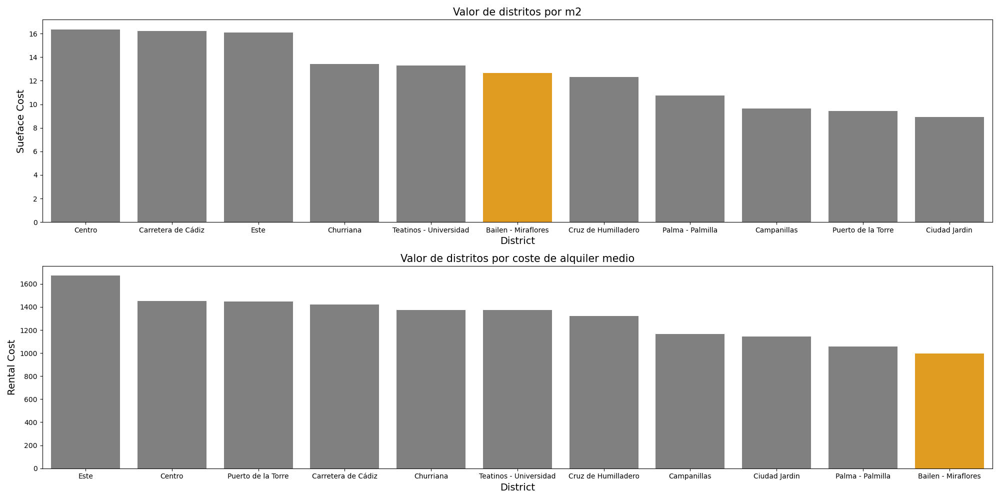
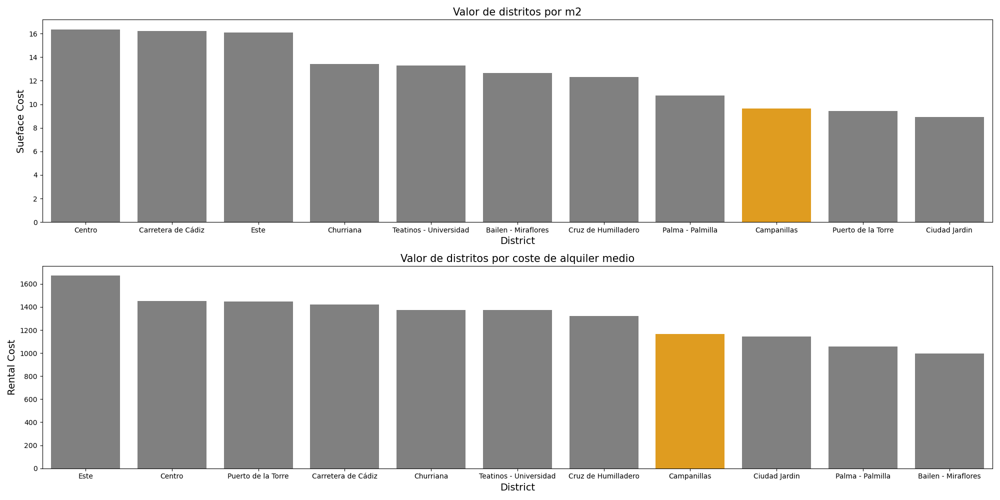
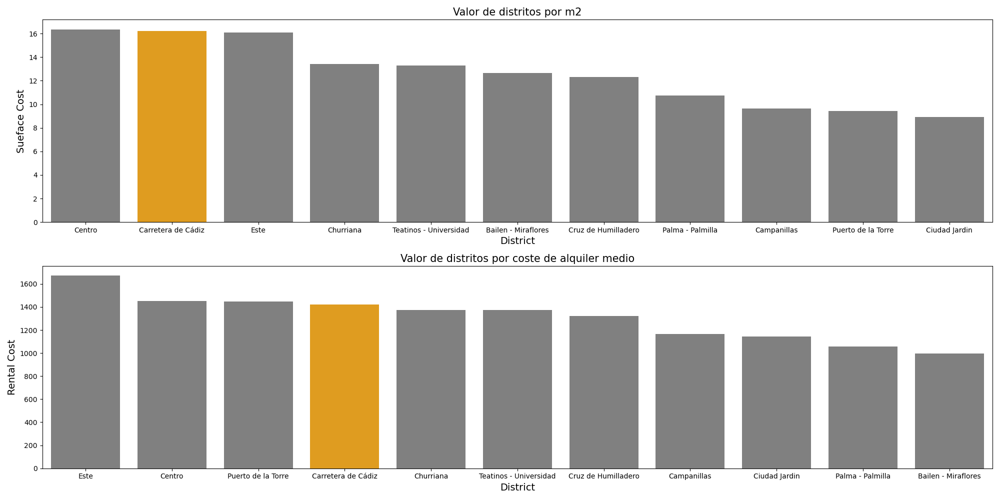
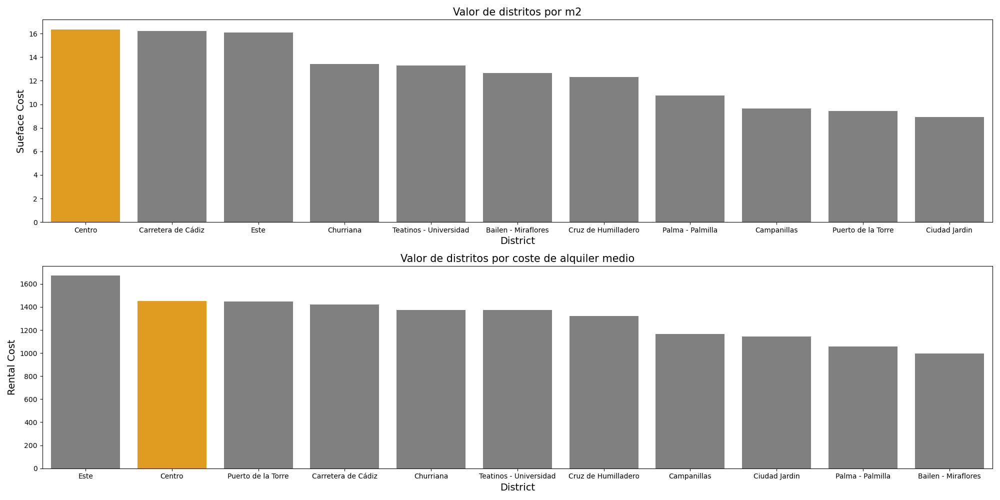
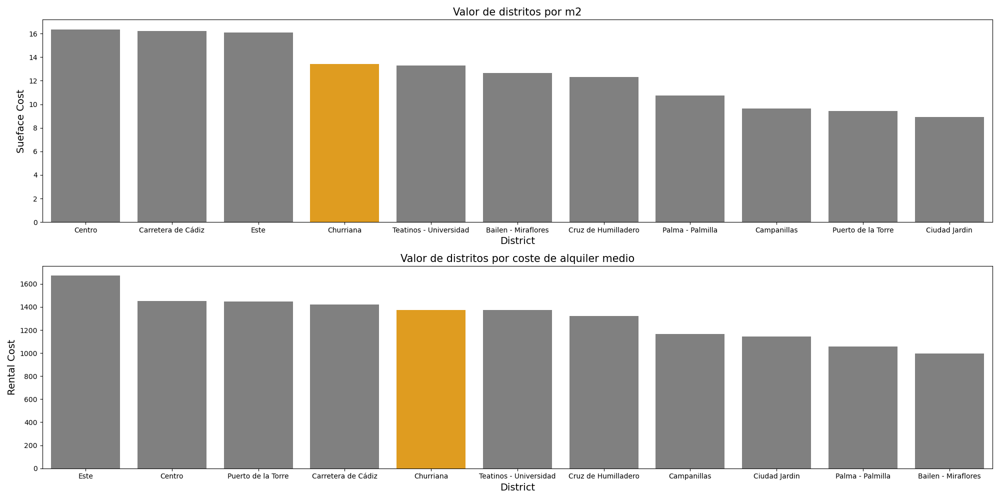
...
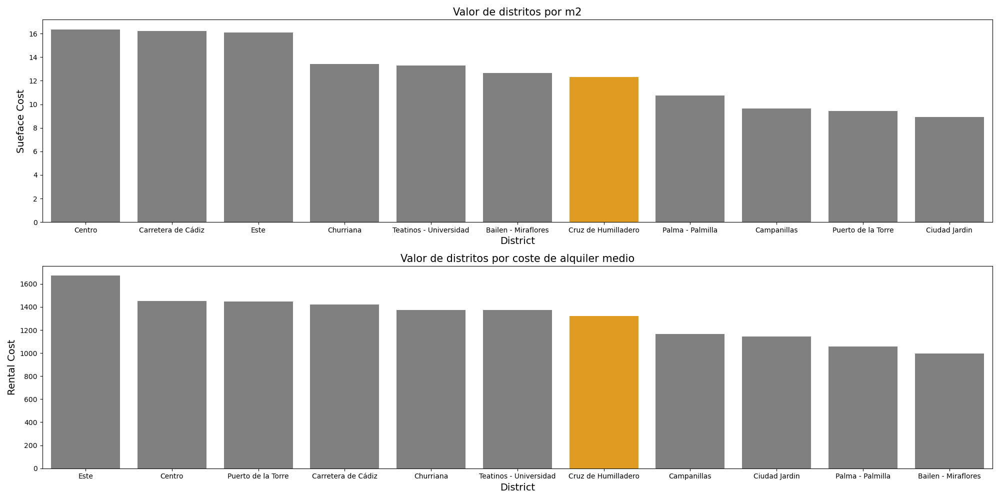
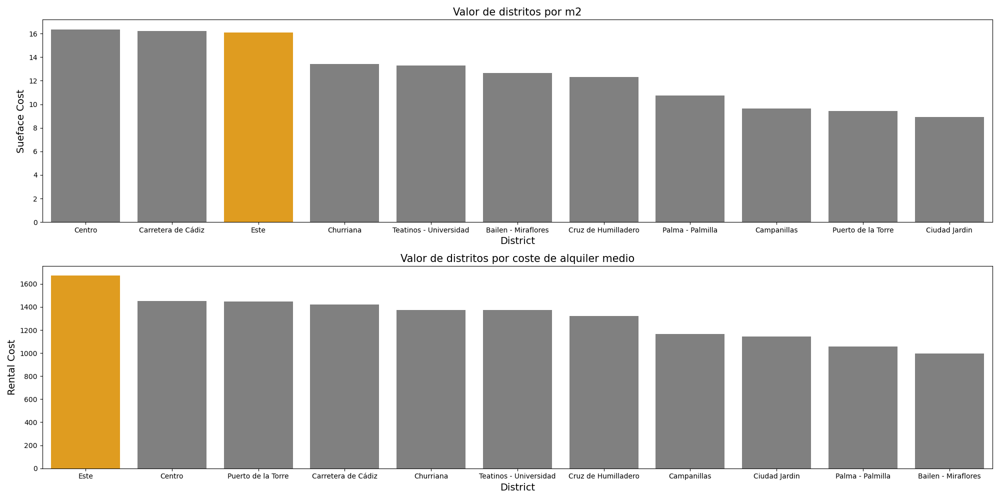
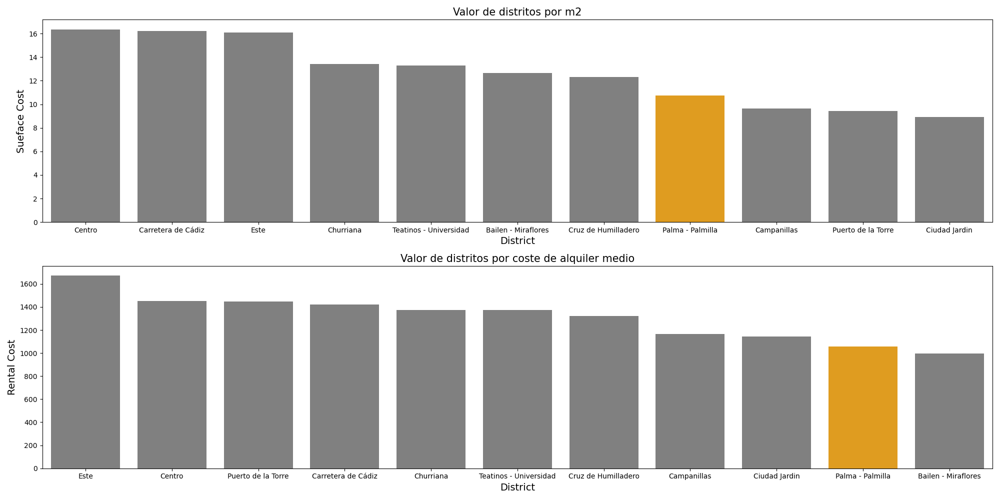
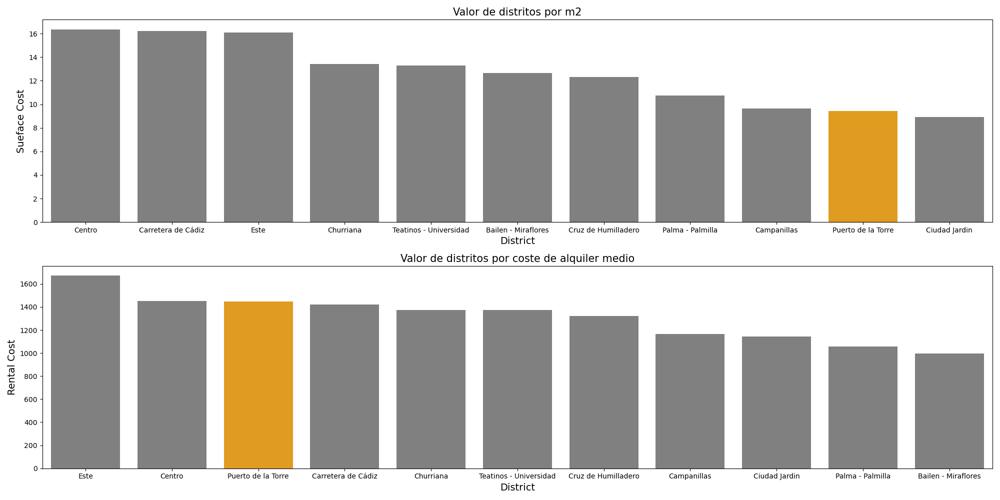
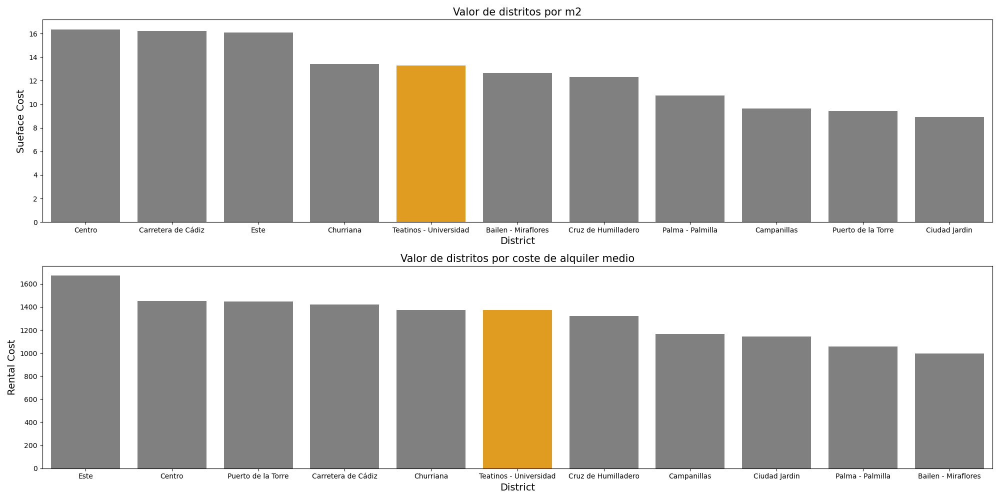

In [18]:
lat = 36.72016
lng = -4.42034

city_map = folium.Map(location = [lat, lng], zoom_start = 11.4)

# Inicializamos un FeatureGroup() para los costes medios en el DataFrame
costs_by_district = folium.map.FeatureGroup()

# Recorre los costes y agrega a cada uno al FeatureGroup() de costes medios
# La columna Y y X son las coordenadas, latitud y longitud respectivamente
# La columna "rental_cost" es el coste medio.
    # Cargar imagen del gráfico de barras
   
for name, lat, lng, rental_cost, ind, euro_per_m2 in zip(df_no_outliers_mean_malaga['district'],
                                                         df_no_outliers_mean_malaga["lat"],
                                                         df_no_outliers_mean_malaga["lon"],
                                                         df_no_outliers_mean_malaga["rental_cost"],
                                                         df_no_outliers_mean_malaga.index,
                                                         df_no_outliers_mean_malaga["euro_per_m2"]):

    with open(f'barplot_malaga_{name}.png', 'rb') as f:
        encoded_string = f"data:image/png;base64,{base64.b64encode(f.read()).decode()}"
    
    # HTML para el popup
    html = f'''<div style="white-space: nowrap; text-align: center; font-family: sans-serif">
                    Distrito: {name}<br>
                    Precio medio: {round(rental_cost,0)}<br>
                    € / m2: {round(euro_per_m2,1)}<br>
                </div>
                <div>
                    <img src="{encoded_string}" alt="barplot" style="width: 800px;" id="img_{ind}">
                </div>'''
    
    # Popup con el HTML
    popup = folium.Popup(html, max_width=1050)
    
    # Popup con el HTML
    # popup = folium.Popup(html, max_width=250)
    
    # iframe = folium.IFrame(html, width=1050, height=600)
    
    # popup = folium.Popup(iframe,max_width=1050)
    
    costs_by_district.add_child(folium.Marker(location = [lat, lng],
                                      icon     = folium.DivIcon(html=f"""<div style="white-space: nowrap; text-align: center; font-family: "Gill Sans", sans-serif; color: black; font-size: x-small">{df_no_outliers_mean_malaga['district'].iloc[ind]}</div>"""),
                                      popup = popup))
# Agrega costes medios al map
city_map.add_child(costs_by_district)

folium.Choropleth(geo_data = city_geo,
                  data     = df_no_outliers_mean_malaga,  # Utilizamos el DataFrame con la media del costo de alquiler por distrito
                  columns  = ["district", "euro_per_m2"],
                  key_on   = "feature.properties.NOMBRE",
                  # name = "geometry",
                  # fill_color   = "YlOrRd",
                  # fill_opacity=0.7,
                  # line_opacity=0.5,
                  # legend_name="Media de euros por m2"
                 ).add_to(city_map)

city_map.save("Data/mapa_malaga.html")

city_map

### 6.2 ANOVA (Análisis de Varianza) 

Es una técnica estadística que se utiliza para comparar las medias de tres o más grupos y determinar si al menos uno de los grupos difiere significativamente de los demás. En el contexto de tu análisis, estás utilizando ANOVA para comparar los precios de alquiler entre los diferentes distritos de Barcelona.

#### Cuando ejecutas el ANOVA, obtienes dos resultados principales:
- Estadístico F: Es una medida de la variabilidad entre los grupos en comparación con la variabilidad dentro de los grupos. Un valor alto del estadístico F sugiere que la variación entre los grupos es significativamente mayor que la variación dentro de los grupos.

- Valor p: Es la probabilidad de obtener un estadístico F al menos tan extremo como el observado si la hipótesis nula fuera cierta. En este caso, la hipótesis nula sería que no hay diferencias significativas en los precios de alquiler entre los distritos.

#### 6.2.1 ANOVA PARA CIUDADES

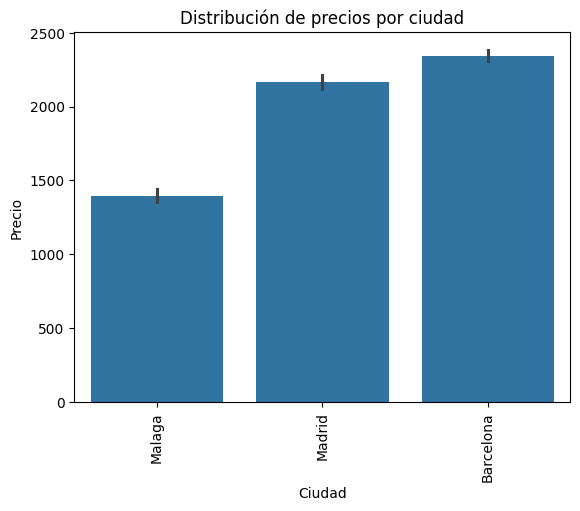

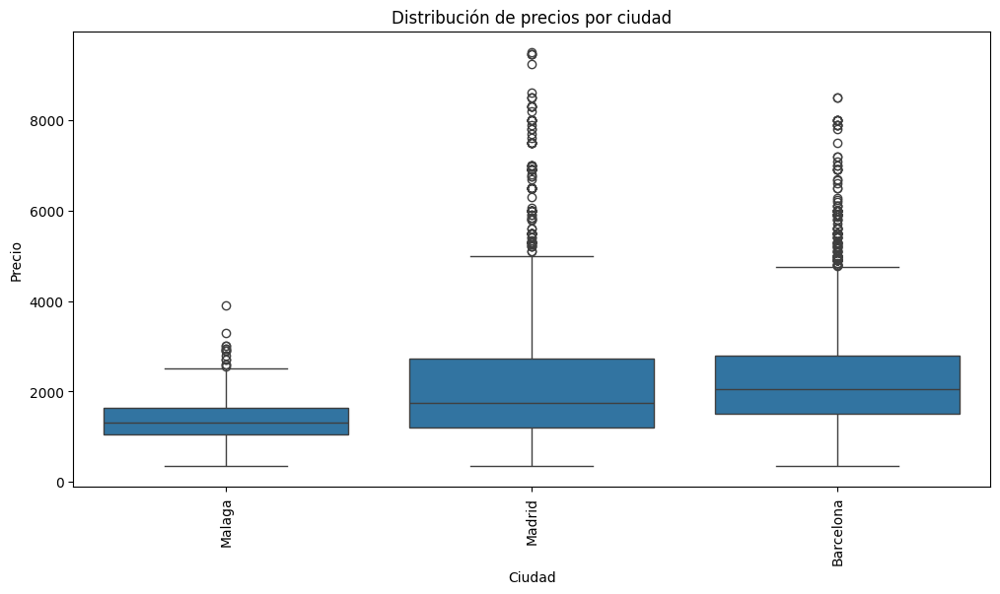

F-statistic: 125.69588125937176
p-value: 2.250732964680387e-54


In [50]:
order = df_test.groupby("city")["rental_cost"].mean().sort_values().index
sns.barplot(data = df_test, x = "city", y = "rental_cost", order = order)
plt.xticks(rotation=90)
plt.title('Distribución de precios por ciudad')
plt.xlabel('Ciudad')
plt.ylabel('Precio')
plt.show()
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(data=df_test, x='city', y='rental_cost', order = order)
plt.xticks(rotation=90)
plt.title('Distribución de precios por ciudad')
plt.xlabel('Ciudad')
plt.ylabel('Precio')
plt.show()

# ANOVA para comparar los precios entre los diferentes distritos

import scipy.stats as stats
f_statistic, p_value = stats.f_oneway(*[group['rental_cost'] for name, group in df_test.groupby('city')])
print("F-statistic:", f_statistic)
print("p-value:", p_value)

#### 6.2.2 ANOVA PARA DISTRITOS

##### 6.2.2.1 Distritos de BARCELONA

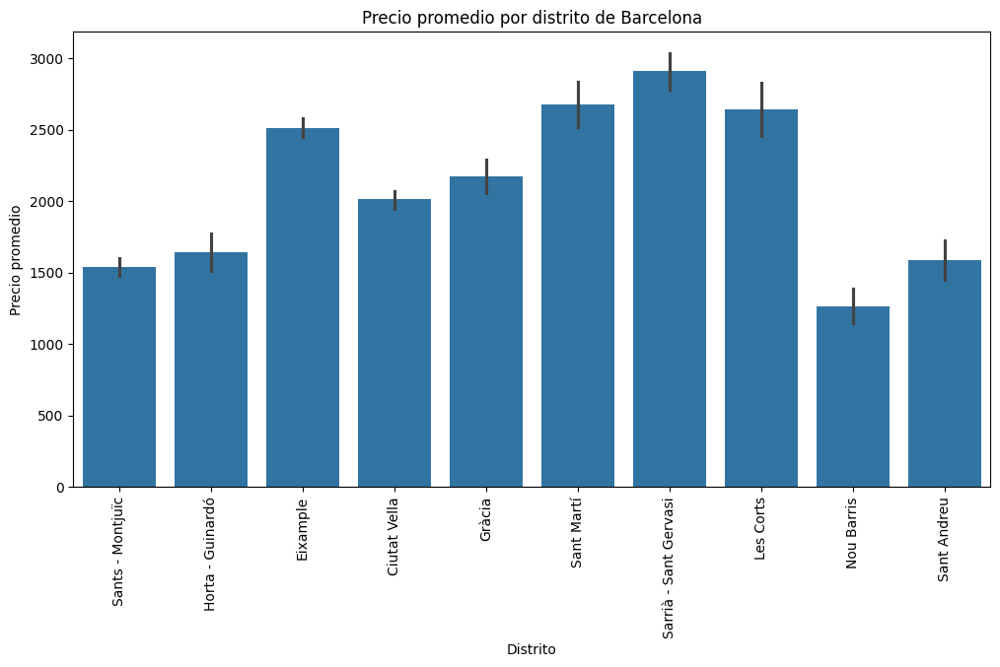

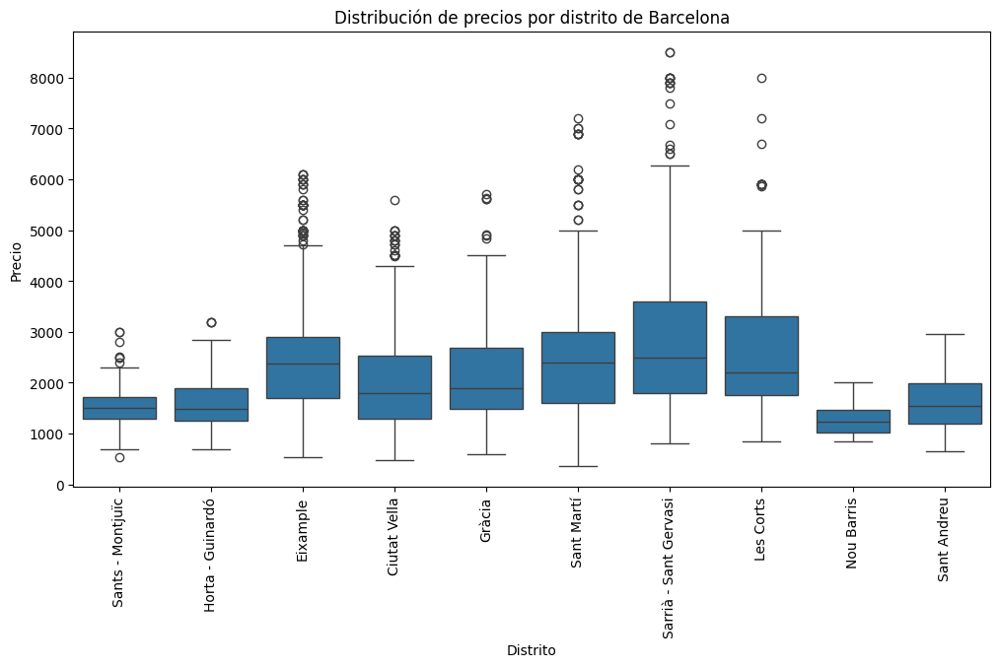

F-statistic: 48.95073956741665
p-value: 2.142833524055772e-83


In [65]:
df_bcn = df_test[df_test["city"] =="Barcelona"]
df_bcn_clean = df_bcn.dropna(subset=['rental_cost']) #quitamos los nas
plt.figure(figsize=(12, 6))
sns.barplot(data=df_bcn_clean, x='district', y='rental_cost', estimator=lambda x: sum(x) / len(x))
plt.xticks(rotation=90)
plt.title('Precio promedio por distrito de Barcelona')
plt.xlabel('Distrito')
plt.ylabel('Precio promedio')
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(data=df_bcn, x='district', y='rental_cost')
plt.xticks(rotation=90)
plt.title('Distribución de precios por distrito de Barcelona')
plt.xlabel('Distrito')
plt.ylabel('Precio')
plt.show()
# ANOVA para comparar los precios entre los diferentes distritos

import scipy.stats as stats
f_statistic, p_value = stats.f_oneway(*[group['rental_cost'] for name, group in df_bcn_clean.groupby('district')])
print("F-statistic:", f_statistic)
print("p-value:", p_value)

Resultados  
- Estadístico F: El valor de 28.53 es relativamente alto, lo que indica que la variabilidad entre los precios de alquiler en los diferentes distritos es mucho mayor que la variabilidad dentro de los distritos.

- Valor p: El valor p obtenido es 2.28e-48, lo que significa 2.28 multiplicado por 10 elevado a la potencia de -48. Este valor p es extremadamente pequeño, prácticamente cero. Por lo tanto, hay evidencia estadística abrumadora para rechazar la hipótesis nula. En otras palabras, es altamente improbable que los precios de alquiler sean iguales en todos los distritos.

En conclusión, los resultados del ANOVA sugieren que el distrito tiene un efecto significativo en el precio de los alquileres en Barcelona. Es decir, hay diferencias significativas en los precios de alquiler entre los diferentes distritos de la ciudad. Esto significa que el distrito en el que se encuentra una propiedad influye significativamente en su precio de alquiler.

##### 6.2.2.2 Distritos de Madrid

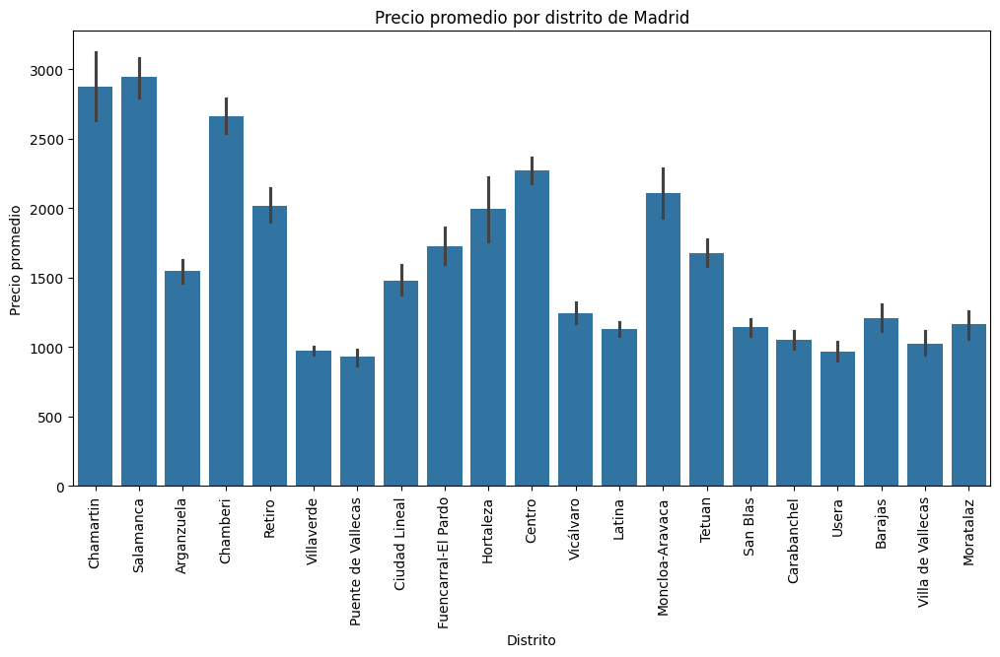

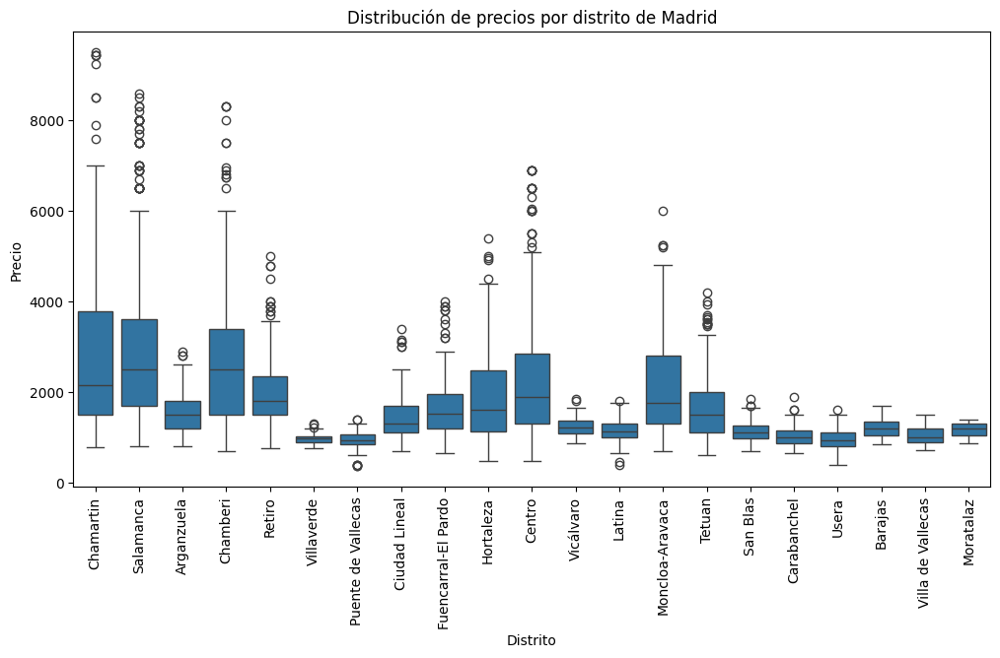

F-statistic: 44.02730640421412
p-value: 1.9223389840760932e-153


In [68]:
df_mad = df_test[df_test["city"] =="Madrid"]
df_mad_clean = df_mad.dropna(subset=['rental_cost']) #quitamos los nas
plt.figure(figsize=(12, 6))
sns.barplot(data=df_mad_clean, x='district', y='rental_cost', estimator=lambda x: sum(x) / len(x))
plt.xticks(rotation=90)
plt.title('Precio promedio por distrito de Madrid')
plt.xlabel('Distrito')
plt.ylabel('Precio promedio')
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(data=df_mad_clean, x='district', y='rental_cost')
plt.xticks(rotation=90)
plt.title('Distribución de precios por distrito de Madrid')
plt.xlabel('Distrito')
plt.ylabel('Precio')
plt.show()
# ANOVA para comparar los precios entre los diferentes distritos

import scipy.stats as stats
f_statistic, p_value = stats.f_oneway(*[group['rental_cost'] for name, group in df_mad_clean.groupby('district')])
print("F-statistic:", f_statistic)
print("p-value:", p_value)

**Resultados**  
- **Estadístico F**: El valor de 44.02 es alto, lo que indica que la variabilidad entre los precios de alquiler en los diferentes distritos es mucho mayor que la variabilidad dentro de los distritos.  
**VAR fuera de distritos >>> VAR dentro de distritos**

- **Valor p**: El valor p obtenido es 1.92e-153, lo que significa 1.92 multiplicado por 10 elevado a la potencia de -153. Este valor p es extremadamente pequeño, prácticamente cero. Por lo tanto, hay evidencia estadística abrumadora para rechazar la hipótesis nula, aceptando así la hipótesis alternativa. En otras palabras, es altamente improbable que los precios de alquiler sean iguales en todos los distritos.
Los precios SI varían dependiendo del Distrito.

En conclusión, los resultados del ANOVA sugieren que el distrito **SI** tiene un efecto significativo en el precio de los alquileres en Madrid. Es decir, **el distrito donde se encuentre la propiedad influirá significativamente en su precio de alquiler.**

##### 6.2.2.1 Distritos de Malaga

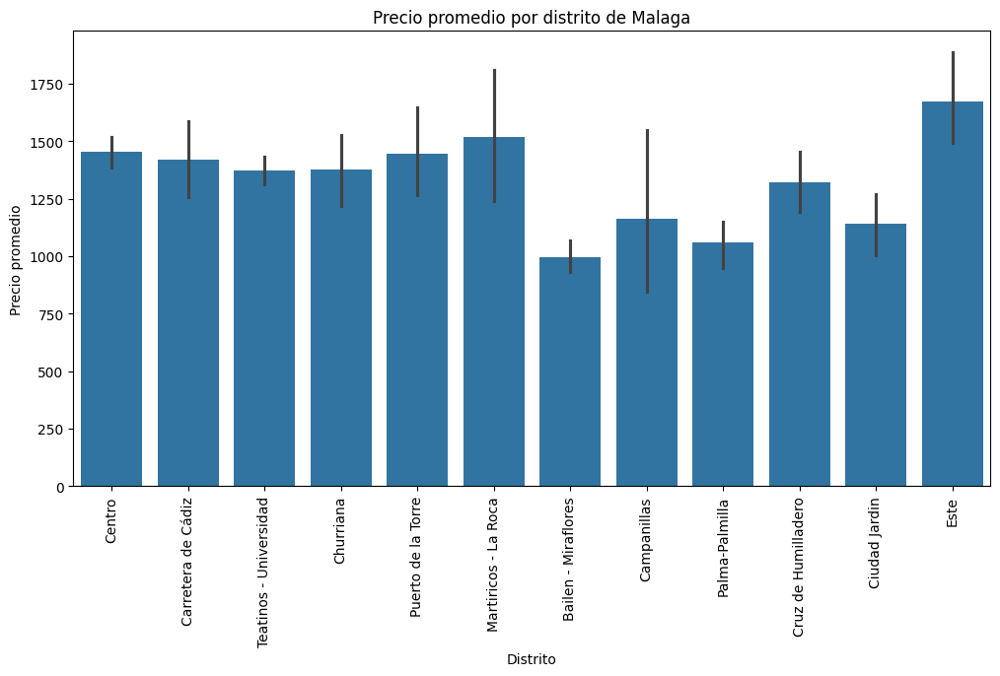

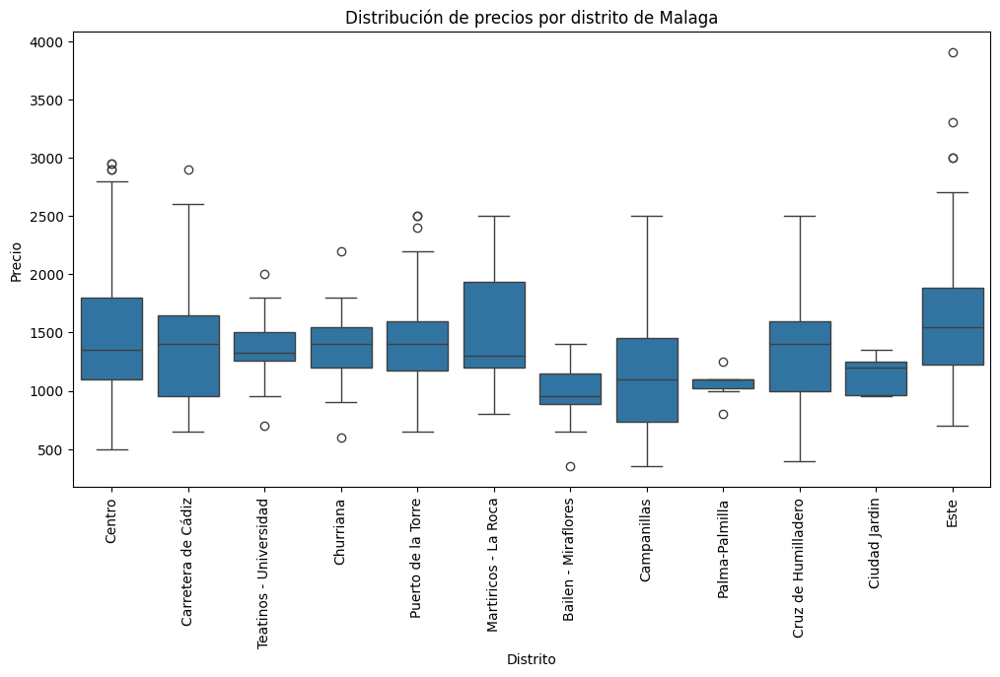

F-statistic: 4.788230257677356
p-value: 5.198603981041175e-07


In [69]:
df_mlg = df_test[df_test["city"] =="Malaga"]
df_mlg_clean = df_mlg.dropna(subset=['rental_cost']) #quitamos los nas
plt.figure(figsize=(12, 6))
sns.barplot(data=df_mlg_clean, x='district', y='rental_cost', estimator=lambda x: sum(x) / len(x))
plt.xticks(rotation=90)
plt.title('Precio promedio por distrito de Malaga')
plt.xlabel('Distrito')
plt.ylabel('Precio promedio')
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(data=df_mlg_clean, x='district', y='rental_cost')
plt.xticks(rotation=90)
plt.title('Distribución de precios por distrito de Malaga')
plt.xlabel('Distrito')
plt.ylabel('Precio')
plt.show()
# ANOVA para comparar los precios entre los diferentes distritos

import scipy.stats as stats
f_statistic, p_value = stats.f_oneway(*[group['rental_cost'] for name, group in df_mlg_clean.groupby('district')])
print("F-statistic:", f_statistic)
print("p-value:", p_value)

Resultados  
Apesar de ser la ciudad con menor F estadístico y mayor valor de p, siguen dando los mismos resultados para la prueba. Así que para el ANOVA en Malaga estos valores siguen rechazando la hipotesís nula, esto significa que sí existe un valor significativo en ambas variables (rental_cost & district).
**VAR fuera de distritos >>> VAR dentro de distritos**

Estos valores más acotados, tanto para F como p, es posible que se deba a que la cantidad de datos es menor. Ya que tanto para Madrid como para Barcelona hay una muestra mayor de 3000, mientras que en este caso (Malaga) tenemos **514**. O a que Málaga no es una ciudad tan grande ni tan importante como las otras dos.

En conclusión, los resultados del ANOVA sugieren que el distrito **SI** tiene un efecto significativo en el precio de los alquileres en Malaga. Es decir, **el distrito donde se encuentre la propiedad influirá significativamente en su precio de alquiler.**

### 6.3 Pairplot: ¿Cuál es la vivienda más común en cada una de las ciudades?

#### Pruebas

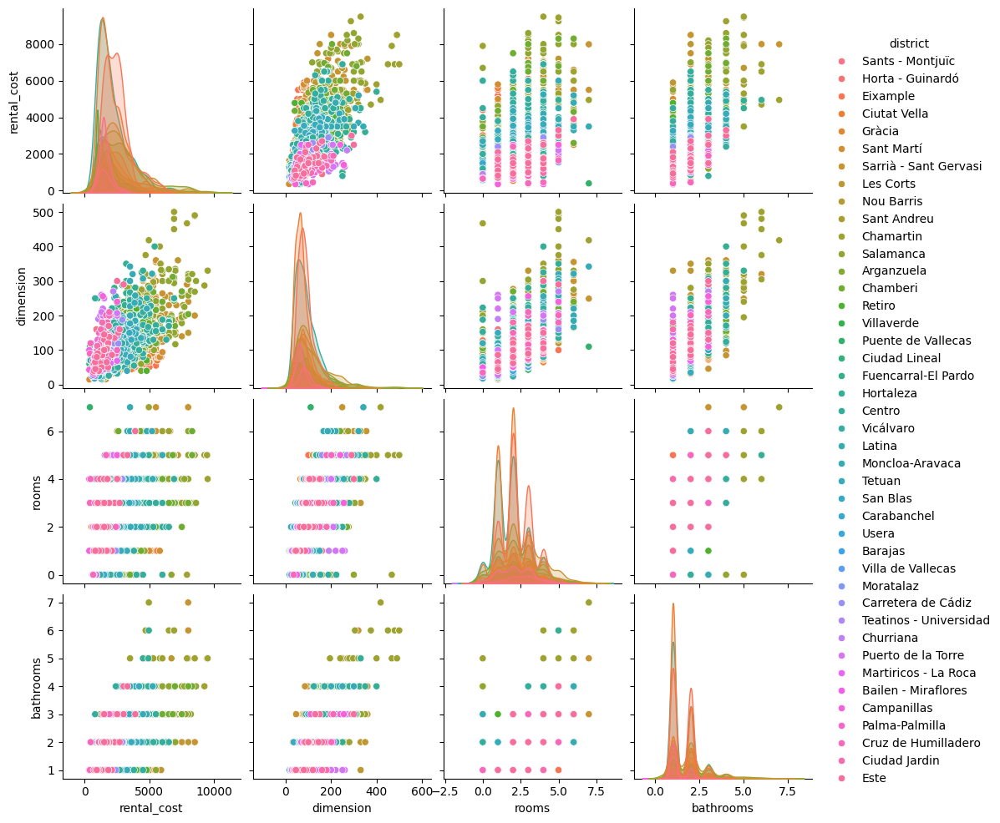

In [11]:
sns.pairplot(df_no_outliers[["rental_cost", "dimension", "rooms", "bathrooms", "district"]], hue = "district")
plt.show()

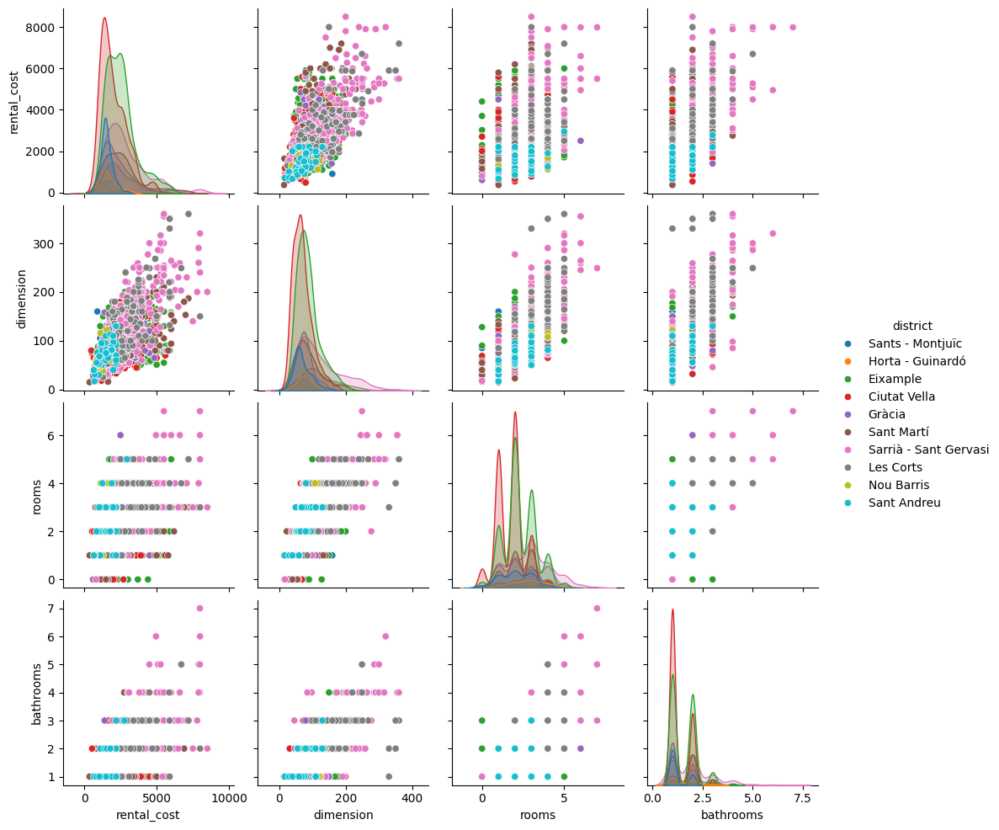

In [12]:
df_barcelona = df_no_outliers[df_no_outliers["city"] == "Barcelona"]

sns.pairplot(df_barcelona[["rental_cost", "dimension", "rooms", "bathrooms", "district"]], hue = "district")
plt.show()

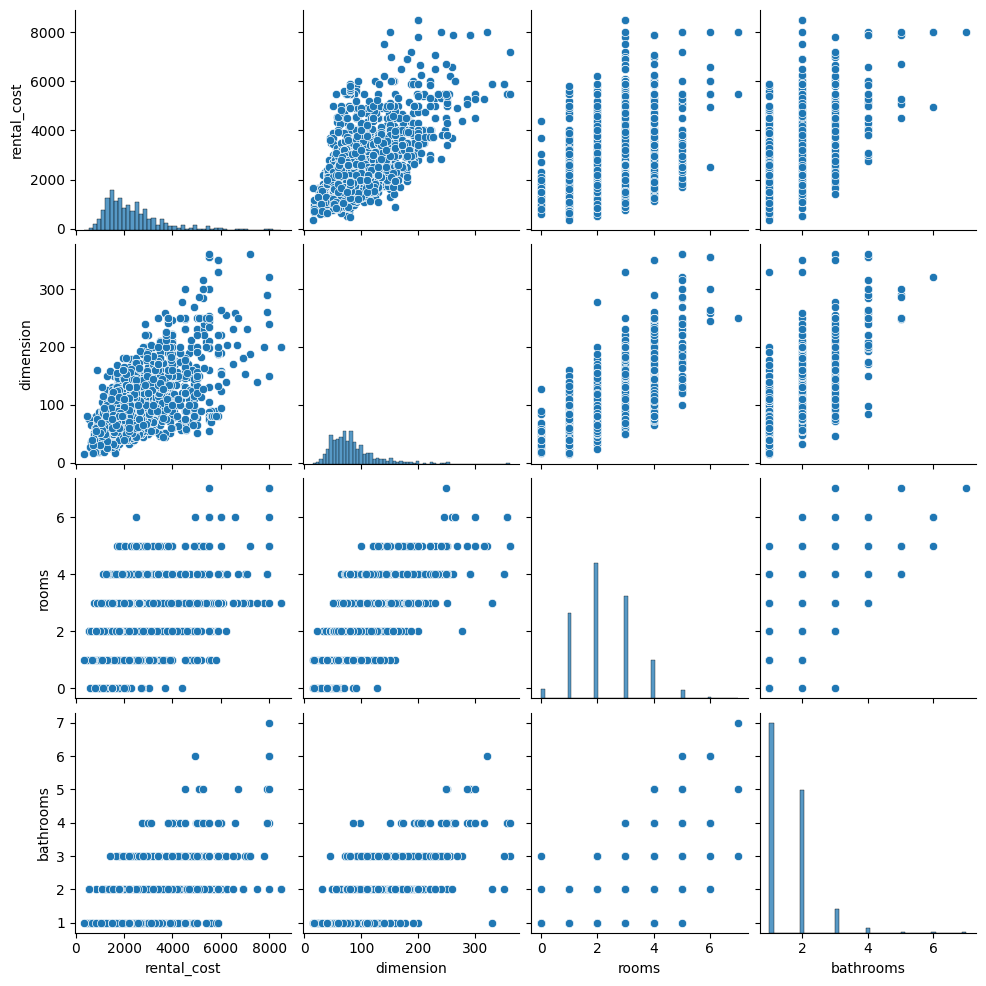

In [14]:
sns.pairplot(df_barcelona[["rental_cost", "dimension", "rooms", "bathrooms", "district"]])
plt.show()

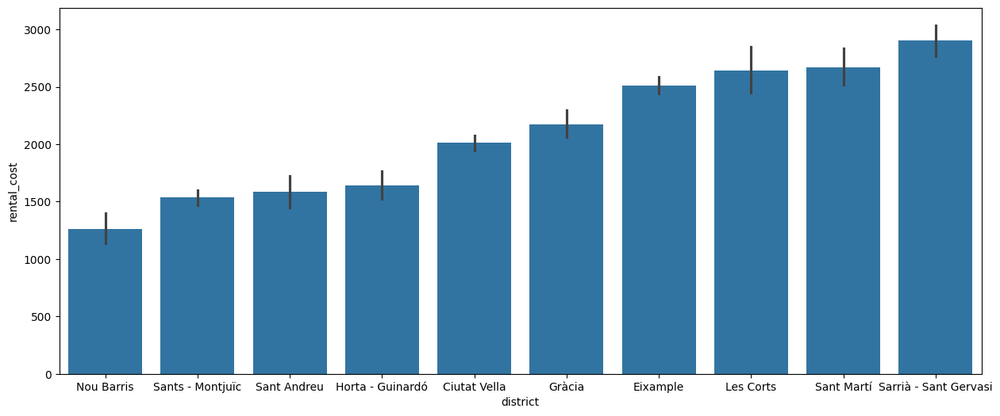

In [17]:
# Muestra el promedio del precio del tipo de habitación
plt.figure(figsize=(15, 6))
order = df_barcelona.groupby("district")["rental_cost"].mean().sort_values().index
sns.barplot(data = df_barcelona, x = "district", y = "rental_cost", order = order)
plt.show()

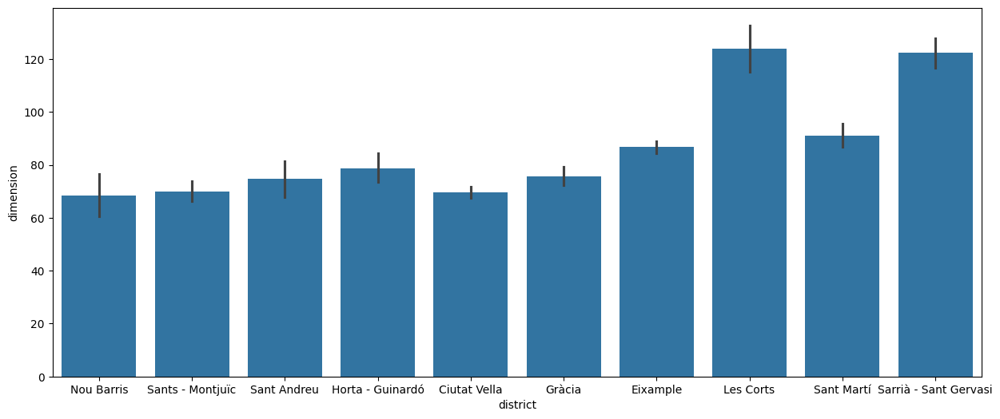

In [19]:
plt.figure(figsize=(15, 6))
order = df_barcelona.groupby("district")["rental_cost"].mean().sort_values().index
sns.barplot(data = df_barcelona, x = "district", y = "dimension", order = order)
plt.show()

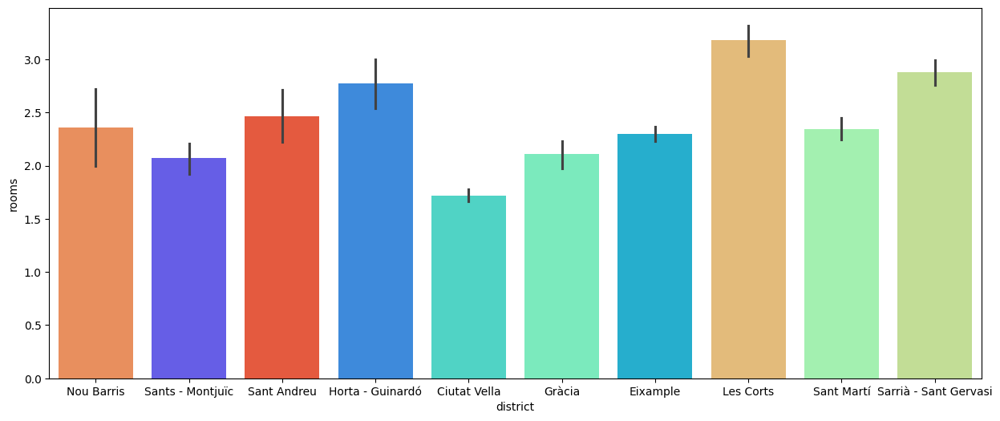

In [27]:
plt.figure(figsize=(15, 6))
order = df_barcelona.groupby("district")["rental_cost"].mean().sort_values().index
sns.barplot(data = df_barcelona, x = "district", y = "rooms", order = order, hue = "district", palette = "rainbow", legend=False)
plt.show()

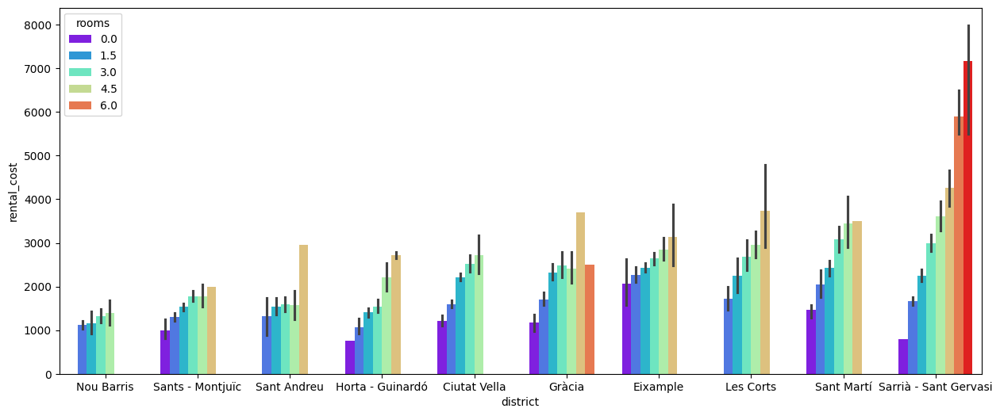

In [29]:
plt.figure(figsize=(15, 6))
order = df_barcelona.groupby("district")["rental_cost"].mean().sort_values().index
sns.barplot(data = df_barcelona, x = "district", y = "rental_cost", order = order, hue = "rooms", palette = "rainbow")
plt.show()

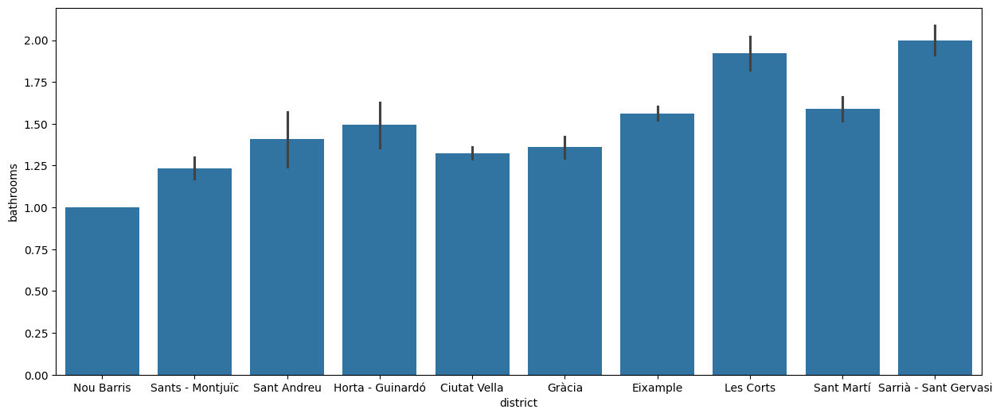

In [21]:
plt.figure(figsize=(15, 6))
order = df_barcelona.groupby("district")["rental_cost"].mean().sort_values().index
sns.barplot(data = df_barcelona, x = "district", y = "bathrooms", order = order)
plt.show()

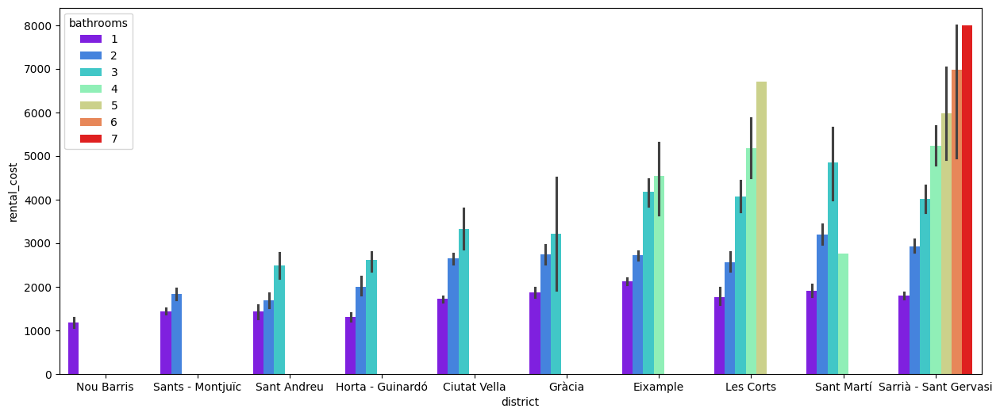

In [30]:
plt.figure(figsize=(15, 6))
order = df_barcelona.groupby("district")["rental_cost"].mean().sort_values().index
sns.barplot(data = df_barcelona, x = "district", y = "rental_cost", order = order, hue = "bathrooms", palette = "rainbow")
plt.show()

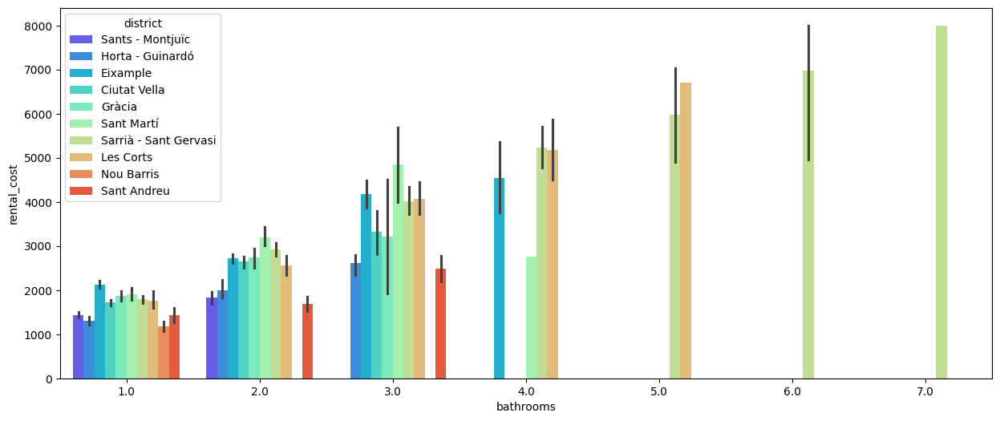

In [31]:
plt.figure(figsize=(15, 6))
order = df_barcelona.groupby("bathrooms")["rental_cost"].mean().sort_values().index
sns.barplot(data = df_barcelona, x = "bathrooms", y = "rental_cost", order = order, hue = "district", palette = "rainbow")
plt.show()

In [ ]:
plt.figure(figsize=(15, 6))
order = df_barcelona.groupby("district")["rental_cost"].mean().sort_values().index
sns.barplot(data = df_barcelona, x = "district", y = "rooms", order = order, hue = "district", palette = "rainbow", legend=False)
plt.show()

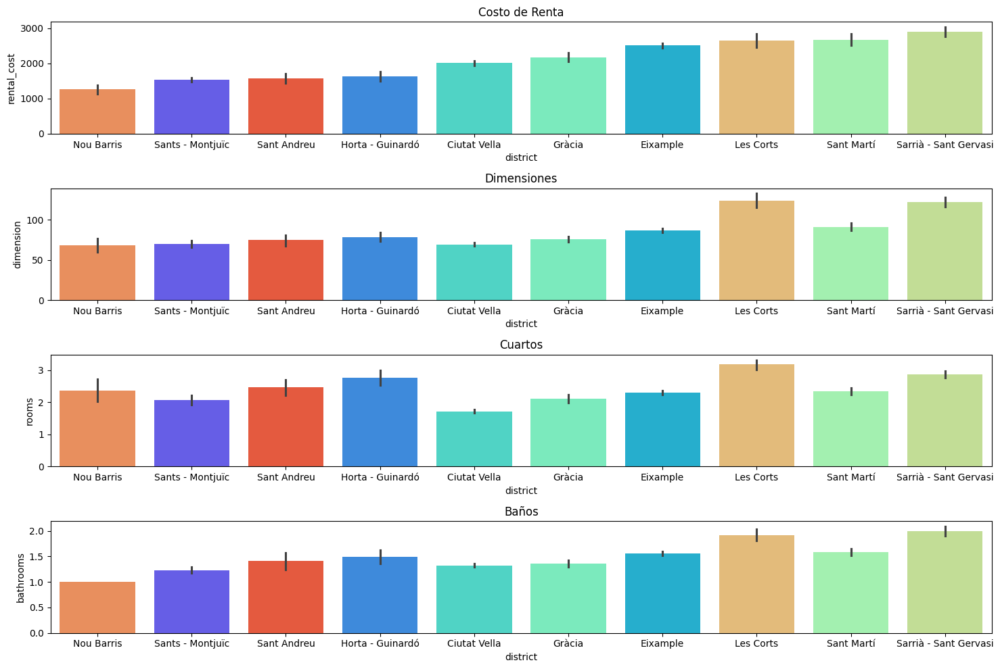

In [53]:
# Datos de ejemplo
df_barcelona = df_no_outliers[df_no_outliers["city"] == "Barcelona"]
order = df_barcelona.groupby("district")["rental_cost"].mean().sort_values().index
# Crear subgráficos
fig, axs = plt.subplots(4, 1, figsize=(15, 10))

# Gráfico 1: Rental_cost
sns.barplot(data    = df_barcelona, 
            x       = "district", 
            y       = "rental_cost", 
            order   = order, 
            hue     = "district", 
            palette = "rainbow", 
            legend  = False,
            ax      = axs[0])
axs[0].set_title("Costo de Renta")

# Gráfico 2: dimensions
sns.barplot(data    = df_barcelona, 
            x       = "district", 
            y       = "dimension", 
            order   = order, 
            hue     = "district", 
            palette = "rainbow", 
            legend  =False, 
            ax      = axs[1])
axs[1].set_title("Dimensiones")

# Gráfico 3: rooms
sns.barplot(data    = df_barcelona, 
            x       = "district", 
            y       = "rooms", 
            order   = order, 
            hue     = "district", 
            palette = "rainbow", 
            legend  = False,
            ax      = axs[2])
axs[2].set_title("Cuartos")

# Gráfico 4: bathrooms
sns.barplot(data = df_barcelona, 
            x = "district", 
            y = "bathrooms", 
            order = order, 
            hue = "district", 
            palette = "rainbow", 
            legend=False,
            ax      = axs[3])
axs[3].set_title("Baños")

# Ajustar diseño
plt.tight_layout()

# Mostrar los gráficos
plt.show()

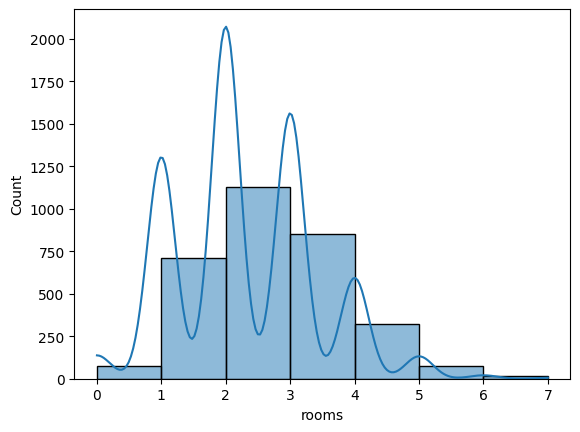

In [65]:
sns.histplot(data = df_barcelona, x = "rooms", bins = 7, kde = True)
plt.show()

#### 6.3.1 Barcelona: ¿Cuál es la vivienda más común?

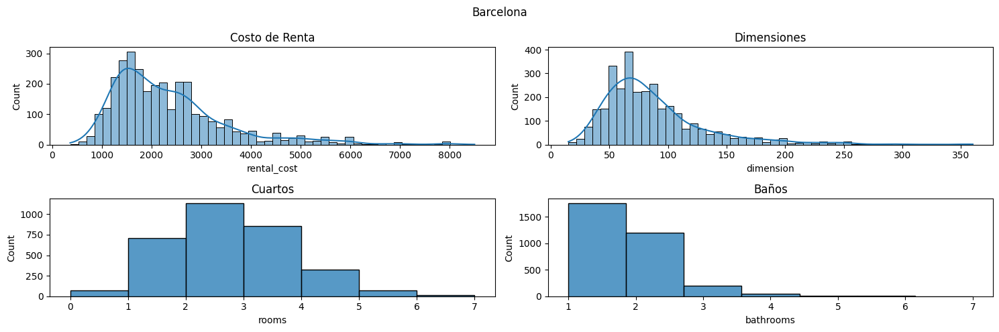

rental_cost    2050.0
dimension        77.0
rooms             2.0
bathrooms         1.0
dtype: float64

In [160]:
# Barcelona
ciudad = "Barcelona"
df_plot = df_no_outliers[df_no_outliers["city"] == ciudad]
df_plot = df_plot.copy()
# Crear subgráficos
fig, axs = plt.subplots(2, 2, figsize=(15, 5))

# Gráfico 1: Rental_cost
sns.histplot(data = df_plot,
            x       = "rental_cost", 
            bins    = 50, 
            kde     = True,
            ax      = axs[0, 0],
            #hue     = "district",
            #multiple= "stack",
            #legend   = False,
            #shrink   = 0.9,
            #edgecolor= 'None'
            )
axs[0, 0].set_title("Costo de Renta")

# Gráfico 2: dimensions
sns.histplot(data = df_plot,
            x       = "dimension", 
            bins    = 50, 
            kde     = True,
            ax      = axs[0, 1])
axs[0, 1].set_title("Dimensiones")

# Gráfico 3: rooms
sns.histplot(data = df_plot,
            x       = "rooms", 
            bins    = 7, 
            kde     = False,
            ax      = axs[1,0])
axs[1,0].set_title("Cuartos")

# Gráfico 4: bathrooms
sns.histplot(data = df_plot,
            x       = "bathrooms", 
            bins    = 7, 
            kde     = False,
            #hue     = "district",
            ax      = axs[1,1]
            )
axs[1,1].set_title("Baños")

# Titulo a toda la figura
fig.suptitle(ciudad)
# Ajustar diseño
plt.tight_layout()
# Mostrar los gráficos
plt.show()

df_plot[["rental_cost", "dimension", "rooms", "bathrooms"]].median()

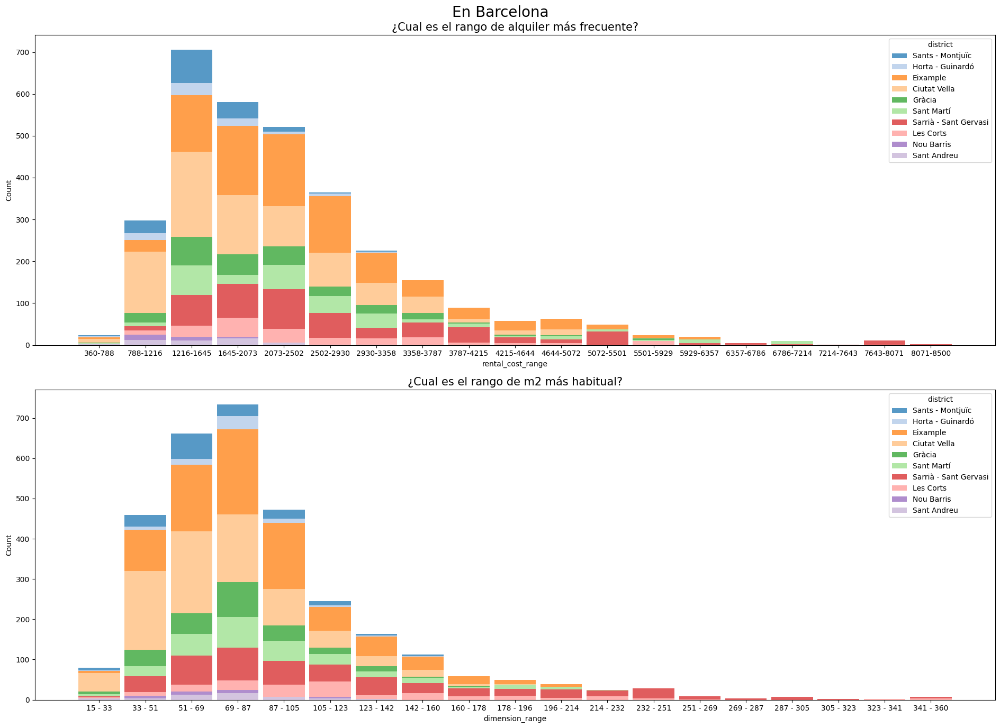

In [156]:
# Ciudad a trabajar
ciudad = "Barcelona"
df_plot = df_no_outliers[df_no_outliers["city"] == ciudad]
df_plot = df_plot.copy()
# Crear subgráficos
fig, axs = plt.subplots(2, 1, figsize=(19, 14))

##### Gráfico 1: Rental_cost_range
# Defino numero de bins
bins_rental_cost = np.linspace(min(df_plot["rental_cost"]), max(df_plot["rental_cost"]), 20)
# Genero la lista de frecuencias
group_name = []
for i in range(0,len(bins_rental_cost)):
    if i == (len(bins_rental_cost)-1):
        break
    group_name.append(f'{int(bins_rental_cost[i])}-{int(bins_rental_cost[i+1])}')
# Agrego la columna de frecuencia al df
df_plot.loc[:,"rental_cost_range"] = pd.cut(df_plot["rental_cost"], bins_rental_cost, labels = group_name, include_lowest = True)
sns.histplot(data    = df_plot,
            x        = "rental_cost_range", 
            bins     = len(bins_rental_cost), 
            kde      = False,
            ax       = axs[0],
            hue      = "district",
            multiple = "stack",
            palette  = "tab20",
            legend   = True,
            shrink   = 0.9,
            edgecolor= 'None')
axs[0].set_title("¿Cual es el rango de alquiler más frecuente?", fontsize=15)

##### Gráfico 2: dimensions
# Defino numero de bins
bins_dimension = np.linspace(min(df_plot["dimension"]), max(df_plot["dimension"]), 20)
# Genero la lista de frecuencias
group_name = []
for i in range(0,len(bins_dimension)):
    if i == (len(bins_dimension)-1):
        break
    group_name.append(f'{int(bins_dimension[i])} - {int(bins_dimension[i+1])}')
# Agrego la columna de frecuencia al df
df_plot.loc[:,"dimension_range"] = pd.cut(df_plot["dimension"], bins_dimension, labels = group_name, include_lowest = True)

sns.histplot(data    = df_plot,
            x        = "dimension_range", 
            bins     = len(bins_dimension), 
            kde      = False,
            ax       = axs[1],
            hue      = "district",
            multiple = "stack",
            legend   = True,
            shrink   = 0.9,
            palette  ='tab20',
            edgecolor='None'
            #linewidth=0.2
            )
axs[1].set_title("¿Cual es el rango de m2 más habitual?", fontsize=15)

# Titulo a toda la figura
fig.suptitle(f'En {ciudad}', fontsize=20)
# Ajustar diseño
plt.tight_layout()
# Mostrar los gráficos
plt.show()

La vivienda más común sería:
- rental cost: 1200~1650 euros
- dimension: 69~87m2
- rooms: 2 cuartos
- bathrooms: 1 baño

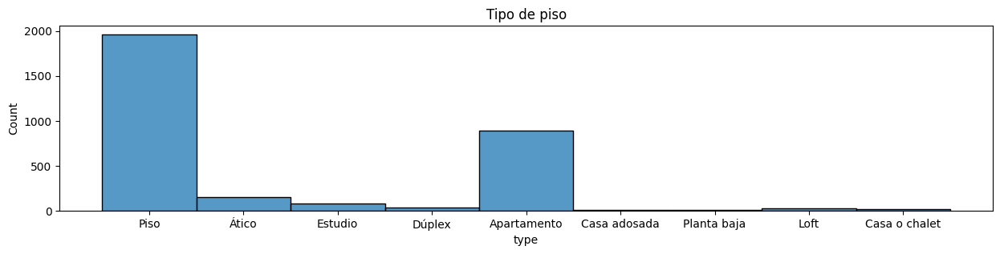

In [17]:
plt.figure(figsize=(15, 3))
sns.histplot(data = df_plot,
            x       = "type", 
            bins    = 7, 
            kde     = False)
plt.title("Tipo de piso")
plt.show()

De tipo "PISO"

##### Explicación de Binning y ejemplos sin distritos


Pasaremos las variables rental_cost y dimensions a variables categóricas para poder visualizarlas en un histograma.
- Bins = np.linspace(min(df["price"], max(df["price"]), 4)
- Group_names = ["low", "medium", "high"]
- df["price-binned"] = pd.cut(df[“price”], bins, labels = group_name, include_lowest = True)


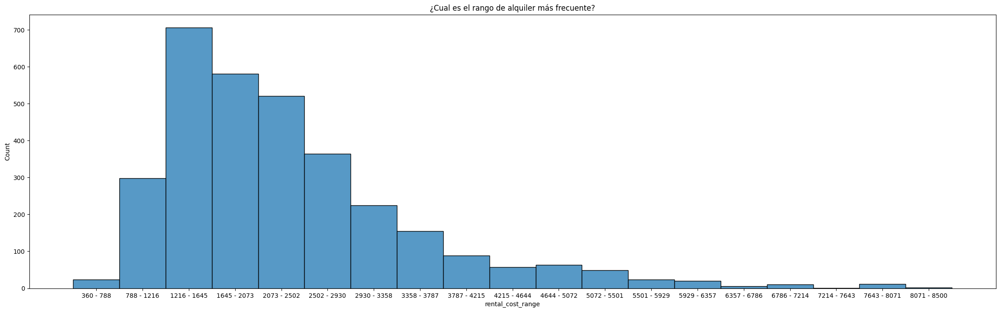

In [151]:
# Ciudad a trabajar
ciudad = "Barcelona"
df_plot = df_no_outliers[df_no_outliers["city"] == ciudad]
df_plot = df_plot.copy()
# Defino numero de bins
bins = np.linspace(min(df_plot["rental_cost"]), max(df_plot["rental_cost"]), 20)
# Genero la lista de frecuencias
group_name = []
for i in range(0,len(bins)):
    if i == (len(bins)-1):
        break
    group_name.append(f'{int(bins[i])} - {int(bins[i+1])}')
# Agrego la columna de frecuencia al df
df_plot.loc[:,"rental_cost_range"] = pd.cut(df_plot["rental_cost"], bins, labels = group_name, include_lowest = True)
# Plot
plt.figure(figsize=(28, 8))
sns.histplot(data   = df_plot,
            x       = "rental_cost_range",
            #hue     = "district",
            bins    = 20, 
            kde     = False,
            #multiple='stack', 
            #shrink  =0.8
            )
plt.title("¿Cual es el rango de alquiler más frecuente?")
plt.show()

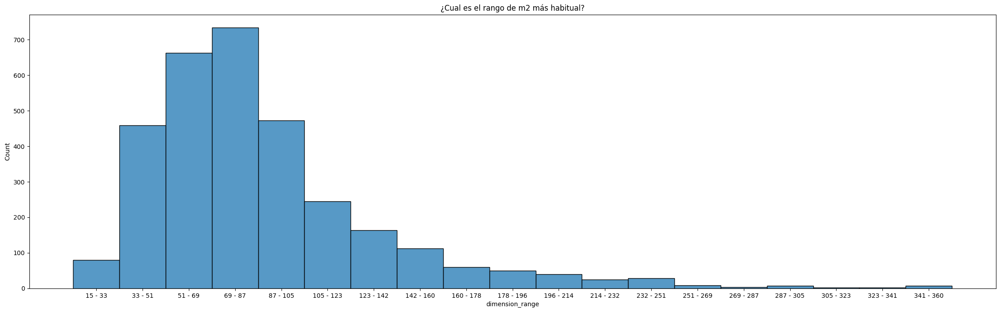

In [152]:
# Ciudad a trabajar
ciudad = "Barcelona"
df_plot = df_no_outliers[df_no_outliers["city"] == ciudad]
df_plot = df_plot.copy()
# Defino numero de bins
bins = np.linspace(min(df_plot["dimension"]), max(df_plot["dimension"]), 20)
# Genero la lista de frecuencias
group_name = []
for i in range(0,len(bins)):
    if i == (len(bins)-1):
        break
    group_name.append(f'{int(bins[i])} - {int(bins[i+1])}')
# Agrego la columna de frecuencia al df
df_plot.loc[:,"dimension_range"] = pd.cut(df_plot["dimension"], bins, labels = group_name, include_lowest = True)
# Plot
plt.figure(figsize=(28, 8))
sns.histplot(data = df_plot,
            x       = "dimension_range", 
            bins    = 20, 
            kde     = False)
plt.title("¿Cual es el rango de m2 más habitual?")
plt.show()

#### 6.3.2 Madrid: ¿Cuál es la vivienda más común?

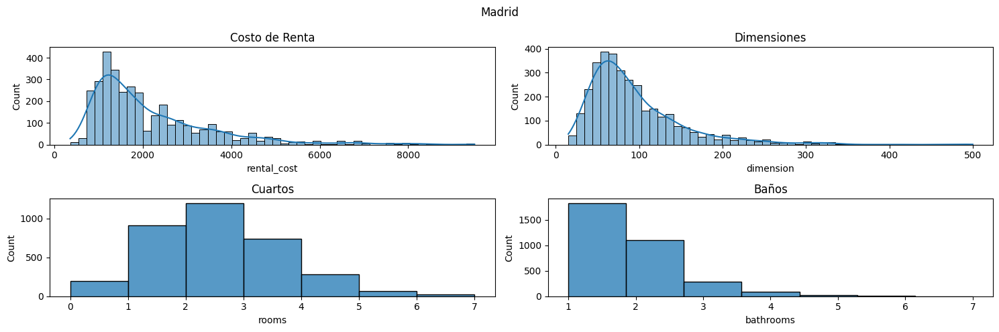

rental_cost    1750.0
dimension        80.0
rooms             2.0
bathrooms         1.0
dtype: float64

In [161]:
# Madrid
ciudad = "Madrid"
df_plot = df_no_outliers[df_no_outliers["city"] == ciudad]

# Crear subgráficos
fig, axs = plt.subplots(2, 2, figsize=(15, 5))

# Gráfico 1: Rental_cost
sns.histplot(data = df_plot,
            x       = "rental_cost", 
            bins    = 50, 
            kde     = True,
            ax      = axs[0, 0])
axs[0, 0].set_title("Costo de Renta")

# Gráfico 2: dimensions
sns.histplot(data = df_plot,
            x       = "dimension", 
            bins    = 50, 
            kde     = True,
            ax      = axs[0, 1])
axs[0, 1].set_title("Dimensiones")

# Gráfico 3: rooms
sns.histplot(data = df_plot,
            x       = "rooms", 
            bins    = 7, 
            kde     = False,
            ax      = axs[1,0])
axs[1,0].set_title("Cuartos")

# Gráfico 4: bathrooms
sns.histplot(data = df_plot,
            x       = "bathrooms", 
            bins    = 7, 
            kde     = False,
            ax      = axs[1,1])
axs[1,1].set_title("Baños")

# Titulo a toda la figura
fig.suptitle(ciudad)
# Ajustar diseño
plt.tight_layout()
# Mostrar los gráficos
plt.show()

# Mediana para las variables de interés
df_plot[["rental_cost", "dimension", "rooms", "bathrooms"]].median()

**La vivienda más común sería:**
- rental cost: 841~1300 euros
- dimension: 40~66m2
- rooms: 2 cuartos
- bathrooms: 1 baño

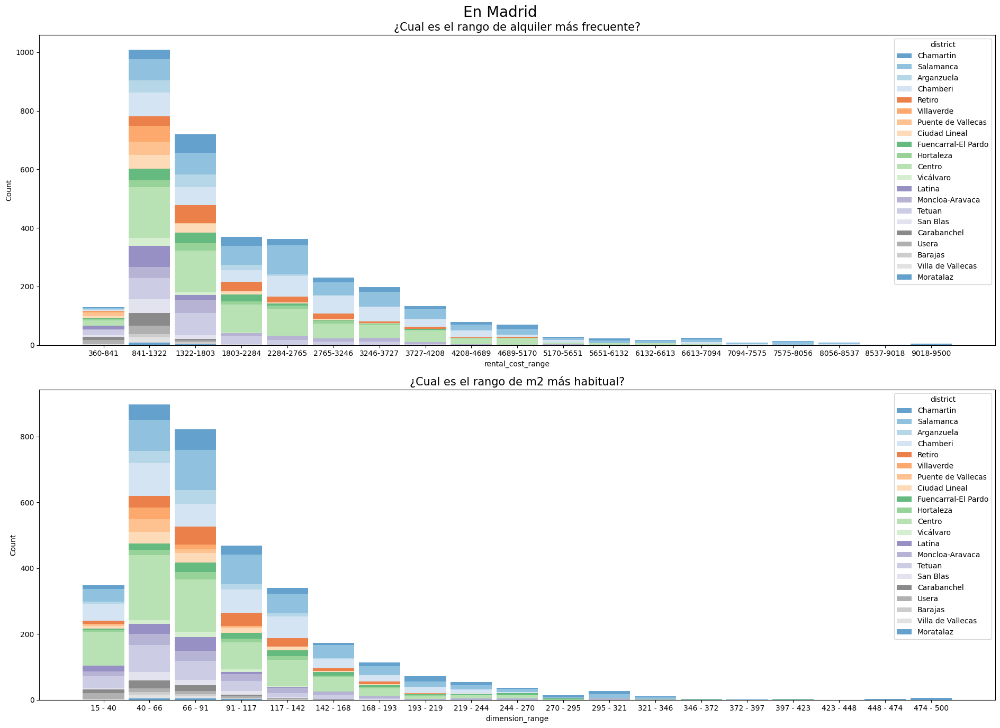

In [155]:
# Ciudad a trabajar
ciudad = "Madrid"
df_plot = df_no_outliers[df_no_outliers["city"] == ciudad]
df_plot = df_plot.copy()
# Crear subgráficos
fig, axs = plt.subplots(2, 1, figsize=(19, 14))

##### Gráfico 1: Rental_cost_range
# Defino numero de bins
bins_rental_cost = np.linspace(min(df_plot["rental_cost"]), max(df_plot["rental_cost"]), 20)
# Genero la lista de frecuencias
group_name = []
for i in range(0,len(bins_rental_cost)):
    if i == (len(bins_rental_cost)-1):
        break
    group_name.append(f'{int(bins_rental_cost[i])}-{int(bins_rental_cost[i+1])}')
# Agrego la columna de frecuencia al df
df_plot.loc[:,"rental_cost_range"] = pd.cut(df_plot["rental_cost"], bins_rental_cost, labels = group_name, include_lowest = True)
sns.histplot(data    = df_plot,
            x        = "rental_cost_range", 
            bins     = len(bins_rental_cost), 
            kde      = False,
            ax       = axs[0],
            hue      = "district",
            multiple = "stack",
            palette  = "tab20c",
            legend   = True,
            shrink   = 0.9,
            edgecolor= 'None')
axs[0].set_title("¿Cual es el rango de alquiler más frecuente?", fontsize=15)

##### Gráfico 2: dimensions
# Defino numero de bins
bins_dimension = np.linspace(min(df_plot["dimension"]), max(df_plot["dimension"]), 20)
# Genero la lista de frecuencias
group_name = []
for i in range(0,len(bins_dimension)):
    if i == (len(bins_dimension)-1):
        break
    group_name.append(f'{int(bins_dimension[i])} - {int(bins_dimension[i+1])}')
# Agrego la columna de frecuencia al df
df_plot.loc[:,"dimension_range"] = pd.cut(df_plot["dimension"], bins_dimension, labels = group_name, include_lowest = True)

sns.histplot(data    = df_plot,
            x        = "dimension_range", 
            bins     = len(bins_dimension), 
            kde      = False,
            ax       = axs[1],
            hue      = "district",
            multiple = "stack",
            legend   = True,
            shrink   = 0.9,
            palette  ='tab20c',
            edgecolor='None'
            #linewidth=0.2
            )
axs[1].set_title("¿Cual es el rango de m2 más habitual?", fontsize=15)

# Titulo a toda la figura
fig.suptitle(f'En {ciudad}', fontsize=20)
# Ajustar diseño
plt.tight_layout()
# Mostrar los gráficos
plt.show()

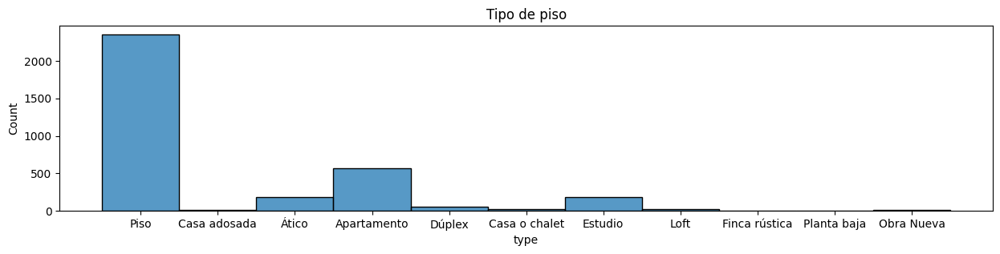

In [101]:
plt.figure(figsize=(15, 3))
sns.histplot(data = df_plot,
            x       = "type", 
            bins    = 7, 
            kde     = False)
plt.title("Tipo de piso")
plt.show()

De tipo "PISO"

#### 6.3.3 Málaga: ¿Cuál es la vivienda más común?

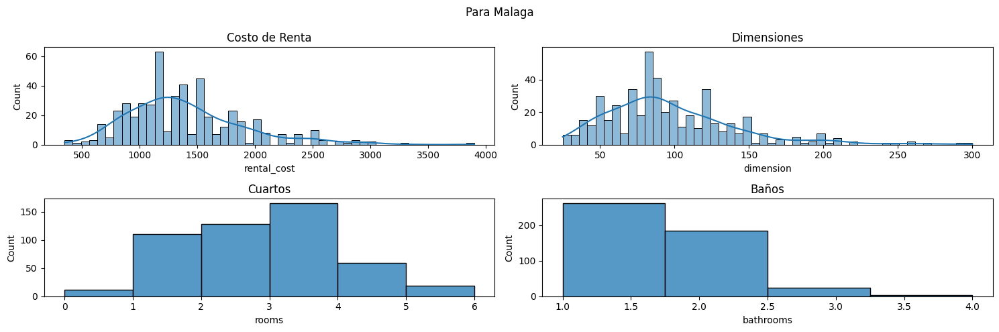

rental_cost    1300.0
dimension        90.0
rooms             2.0
bathrooms         1.0
dtype: float64

In [162]:
# Malaga
ciudad = "Malaga"
df_plot = df_no_outliers[df_no_outliers["city"] == ciudad]

# Crear subgráficos
fig, axs = plt.subplots(2, 2, figsize=(15, 5))

# Gráfico 1: Rental_cost
sns.histplot(data = df_plot,
            x       = "rental_cost", 
            bins    = 50, 
            kde     = True,
            ax      = axs[0, 0])
axs[0, 0].set_title("Costo de Renta")

# Gráfico 2: dimensions
sns.histplot(data = df_plot,
            x       = "dimension", 
            bins    = 50, 
            kde     = True,
            ax      = axs[0, 1])
axs[0, 1].set_title("Dimensiones")

# Gráfico 3: rooms
sns.histplot(data = df_plot,
            x       = "rooms", 
            bins    = 6, 
            kde     = False,
            ax      = axs[1,0])
axs[1,0].set_title("Cuartos")

# Gráfico 4: bathrooms
sns.histplot(data = df_plot,
            x       = "bathrooms", 
            bins    = 4, 
            kde     = False,
            ax      = axs[1,1])
axs[1,1].set_title("Baños")

# Titulo a toda la figura
fig.suptitle(f'Para {ciudad}')
# Ajustar diseño
plt.tight_layout()
# Mostrar los gráficos
plt.show()

# Mediana para las variables de interés
df_plot[["rental_cost", "dimension", "rooms", "bathrooms"]].median()

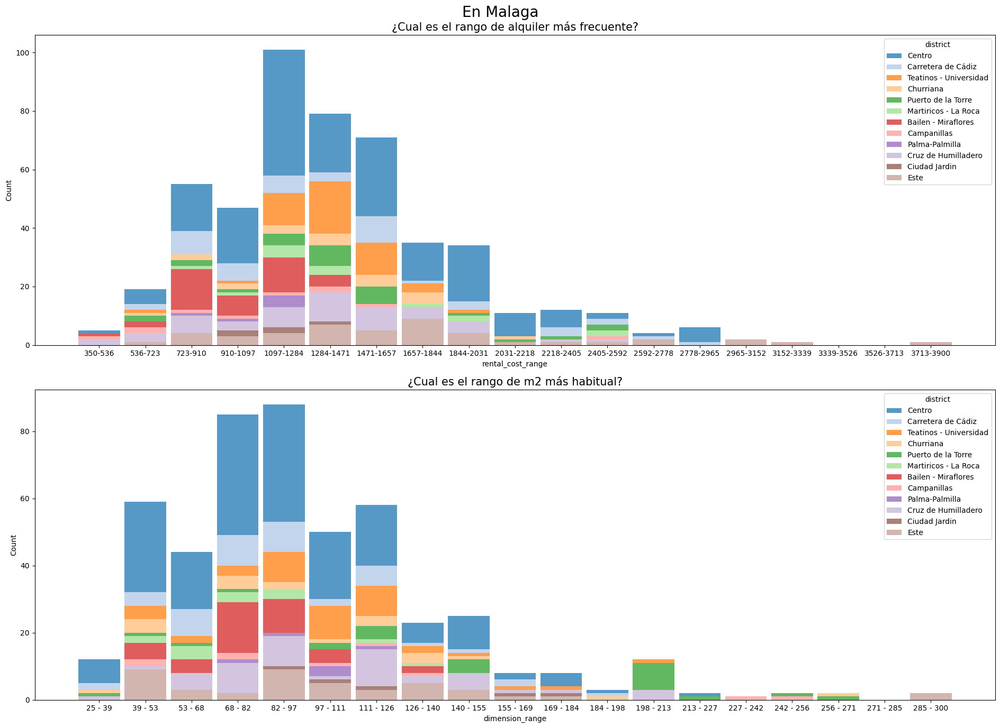

In [157]:
# Ciudad a trabajar
ciudad = "Malaga"
df_plot = df_no_outliers[df_no_outliers["city"] == ciudad]
df_plot = df_plot.copy()
# Crear subgráficos
fig, axs = plt.subplots(2, 1, figsize=(19, 14))

##### Gráfico 1: Rental_cost_range
# Defino numero de bins
bins_rental_cost = np.linspace(min(df_plot["rental_cost"]), max(df_plot["rental_cost"]), 20)
# Genero la lista de frecuencias
group_name = []
for i in range(0,len(bins_rental_cost)):
    if i == (len(bins_rental_cost)-1):
        break
    group_name.append(f'{int(bins_rental_cost[i])}-{int(bins_rental_cost[i+1])}')
# Agrego la columna de frecuencia al df
df_plot.loc[:,"rental_cost_range"] = pd.cut(df_plot["rental_cost"], bins_rental_cost, labels = group_name, include_lowest = True)
sns.histplot(data    = df_plot,
            x        = "rental_cost_range", 
            bins     = len(bins_rental_cost), 
            kde      = False,
            ax       = axs[0],
            hue      = "district",
            multiple = "stack",
            palette  = "tab20",
            legend   = True,
            shrink   = 0.9,
            edgecolor= 'None')
axs[0].set_title("¿Cual es el rango de alquiler más frecuente?", fontsize=15)

##### Gráfico 2: dimensions
# Defino numero de bins
bins_dimension = np.linspace(min(df_plot["dimension"]), max(df_plot["dimension"]), 20)
# Genero la lista de frecuencias
group_name = []
for i in range(0,len(bins_dimension)):
    if i == (len(bins_dimension)-1):
        break
    group_name.append(f'{int(bins_dimension[i])} - {int(bins_dimension[i+1])}')
# Agrego la columna de frecuencia al df
df_plot.loc[:,"dimension_range"] = pd.cut(df_plot["dimension"], bins_dimension, labels = group_name, include_lowest = True)

sns.histplot(data    = df_plot,
            x        = "dimension_range", 
            bins     = len(bins_dimension), 
            kde      = False,
            ax       = axs[1],
            hue      = "district",
            multiple = "stack",
            legend   = True,
            shrink   = 0.9,
            palette  ='tab20',
            edgecolor='None'
            #linewidth=0.2
            )
axs[1].set_title("¿Cual es el rango de m2 más habitual?", fontsize=15)

# Titulo a toda la figura
fig.suptitle(f'En {ciudad}', fontsize=20)
# Ajustar diseño
plt.tight_layout()
# Mostrar los gráficos
plt.show()

**La vivienda más común sería:**
- rental cost: 1100~1300 euros
- dimension: 82~97m2
- rooms: 3 cuartos
- bathrooms: 1 baño

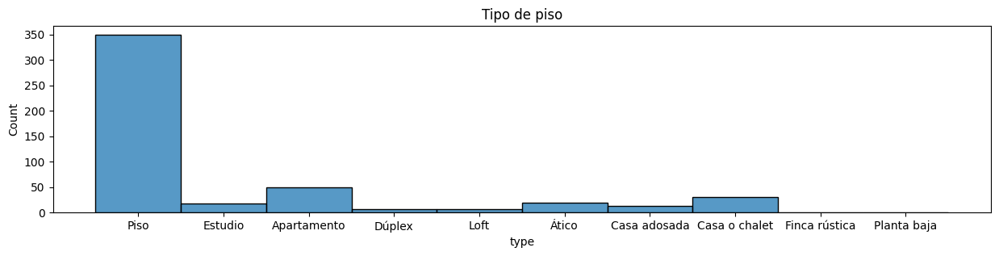

In [124]:
plt.figure(figsize=(15, 3))
sns.histplot(data = df_plot,
            x       = "type", 
            bins    = 7, 
            kde     = False)
plt.title("Tipo de piso")
plt.show()

#### 6.3.4 Todas las ciudades

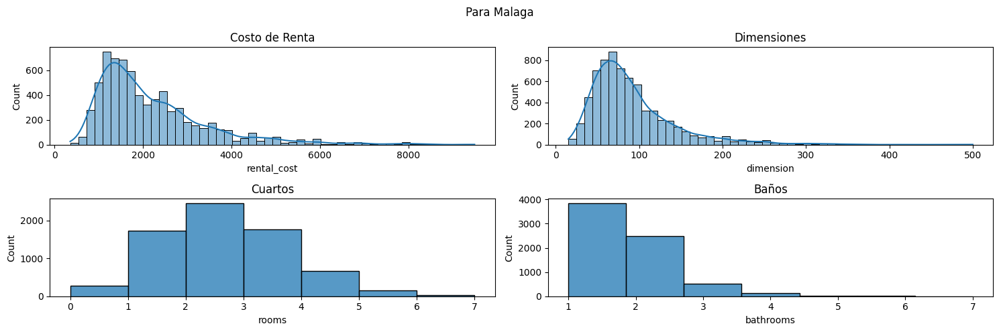

rental_cost    1800.0
dimension        80.0
rooms             2.0
bathrooms         1.0
dtype: float64

In [164]:
# Todas las ciudades
df_plot = df_no_outliers

# Crear subgráficos
fig, axs = plt.subplots(2, 2, figsize=(15, 5))

# Gráfico 1: Rental_cost
sns.histplot(data = df_plot,
            x       = "rental_cost", 
            bins    = 50, 
            kde     = True,
            ax      = axs[0, 0])
axs[0, 0].set_title("Costo de Renta")

# Gráfico 2: dimensions
sns.histplot(data = df_plot,
            x       = "dimension", 
            bins    = 50, 
            kde     = True,
            ax      = axs[0, 1])
axs[0, 1].set_title("Dimensiones")

# Gráfico 3: rooms
sns.histplot(data = df_plot,
            x       = "rooms", 
            bins    = 7, 
            kde     = False,
            ax      = axs[1,0])
axs[1,0].set_title("Cuartos")

# Gráfico 4: bathrooms
sns.histplot(data = df_plot,
            x       = "bathrooms", 
            bins    = 7, 
            kde     = False,
            ax      = axs[1,1])
axs[1,1].set_title("Baños")

# Titulo a toda la figura
fig.suptitle(f'Para {ciudad}')
# Ajustar diseño
plt.tight_layout()
# Mostrar los gráficos
plt.show()

# Mediana para las variables de interés
df_plot[["rental_cost", "dimension", "rooms", "bathrooms"]].median()

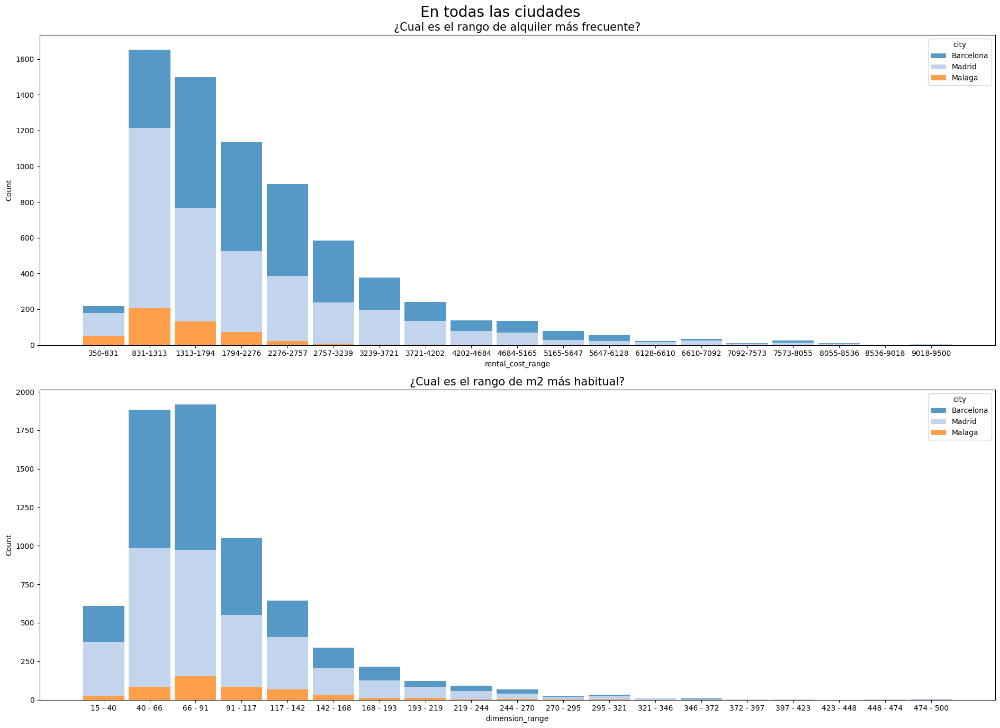

In [165]:
# Todas las ciudades
df_plot = df_no_outliers
df_plot = df_plot.copy()
# Crear subgráficos
fig, axs = plt.subplots(2, 1, figsize=(19, 14))

##### Gráfico 1: Rental_cost_range
# Defino numero de bins
bins_rental_cost = np.linspace(min(df_plot["rental_cost"]), max(df_plot["rental_cost"]), 20)
# Genero la lista de frecuencias
group_name = []
for i in range(0,len(bins_rental_cost)):
    if i == (len(bins_rental_cost)-1):
        break
    group_name.append(f'{int(bins_rental_cost[i])}-{int(bins_rental_cost[i+1])}')
# Agrego la columna de frecuencia al df
df_plot.loc[:,"rental_cost_range"] = pd.cut(df_plot["rental_cost"], bins_rental_cost, labels = group_name, include_lowest = True)
sns.histplot(data    = df_plot,
            x        = "rental_cost_range", 
            bins     = len(bins_rental_cost), 
            kde      = False,
            ax       = axs[0],
            hue      = "city",
            multiple = "stack",
            palette  = "tab20",
            legend   = True,
            shrink   = 0.9,
            edgecolor= 'None')
axs[0].set_title("¿Cual es el rango de alquiler más frecuente?", fontsize=15)

##### Gráfico 2: dimensions
# Defino numero de bins
bins_dimension = np.linspace(min(df_plot["dimension"]), max(df_plot["dimension"]), 20)
# Genero la lista de frecuencias
group_name = []
for i in range(0,len(bins_dimension)):
    if i == (len(bins_dimension)-1):
        break
    group_name.append(f'{int(bins_dimension[i])} - {int(bins_dimension[i+1])}')
# Agrego la columna de frecuencia al df
df_plot.loc[:,"dimension_range"] = pd.cut(df_plot["dimension"], bins_dimension, labels = group_name, include_lowest = True)

sns.histplot(data    = df_plot,
            x        = "dimension_range", 
            bins     = len(bins_dimension), 
            kde      = False,
            ax       = axs[1],
            hue      = "city",
            multiple = "stack",
            legend   = True,
            shrink   = 0.9,
            palette  ='tab20',
            edgecolor='None'
            #linewidth=0.2
            )
axs[1].set_title("¿Cual es el rango de m2 más habitual?", fontsize=15)

# Titulo a toda la figura
fig.suptitle(f'En todas las ciudades', fontsize=20)
# Ajustar diseño
plt.tight_layout()
# Mostrar los gráficos
plt.show()

/tmp/ipykernel_38186/2703400558.py:19: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/tmp/ipykernel_38186/2703400558.py:19: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



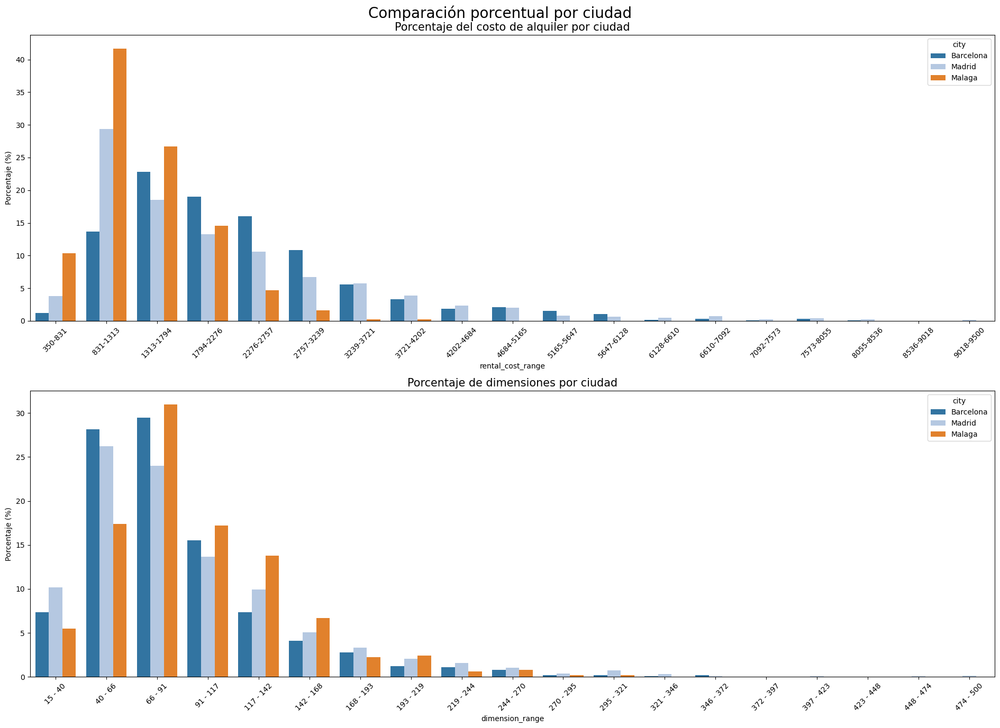

In [10]:
# Asumiendo que df_no_outliers es tu DataFrame ya definido
df_plot = df_no_outliers.copy()

# Definir número de bins y generar las etiquetas para los rangos de costo de alquiler
bins_rental_cost = np.linspace(min(df_plot["rental_cost"]), max(df_plot["rental_cost"]), 20)
group_name_rental = [f'{int(bins_rental_cost[i])}-{int(bins_rental_cost[i+1])}' for i in range(len(bins_rental_cost)-1)]
df_plot["rental_cost_range"] = pd.cut(df_plot["rental_cost"], bins_rental_cost, labels=group_name_rental, include_lowest=True)

# Definir número de bins y generar las etiquetas para los rangos de dimensiones
bins_dimension = np.linspace(min(df_plot["dimension"]), max(df_plot["dimension"]), 20)
group_name_dimension = [f'{int(bins_dimension[i])} - {int(bins_dimension[i+1])}' for i in range(len(bins_dimension)-1)]
df_plot["dimension_range"] = pd.cut(df_plot["dimension"], bins_dimension, labels=group_name_dimension, include_lowest=True)

# Calcular porcentajes para el costo de alquiler y dimensiones por ciudad, manejando correctamente los índices
def calculate_percentages(df, value_column, group_columns):
    # Calcular el total por grupo
    total_counts = df.groupby(group_columns[0]).size()
    # Calcular recuentos por categoría y ciudad
    category_counts = df.groupby(group_columns).size()
    # Calcular porcentajes
    percentages = category_counts.div(total_counts, level=0) * 100
    # Resetear índice y preparar para el gráfico
    percentages = percentages.reset_index(name='percent').rename(columns={0: 'percent'})
    # Asegurar que la columna de valor esté en el formato correcto para el gráfico
    percentages[value_column] = percentages[value_column].astype(str)
    return percentages

rental_cost_percent = calculate_percentages(df_plot, "rental_cost_range", ["city", "rental_cost_range"])
dimension_percent = calculate_percentages(df_plot, "dimension_range", ["city", "dimension_range"])

# Crear subgráficos
fig, axs = plt.subplots(2, 1, figsize=(19, 14), sharex=False)

##### Gráfico 1: Porcentaje del costo de alquiler por ciudad
sns.barplot(data=rental_cost_percent, x="rental_cost_range", y="percent", hue="city", ax=axs[0], palette="tab20")
axs[0].set_title("Porcentaje del costo de alquiler por ciudad", fontsize=15)
axs[0].tick_params(axis='x', rotation=45)
axs[0].set_ylabel("Porcentaje (%)")

##### Gráfico 2: Porcentaje de dimensiones por ciudad
sns.barplot(data=dimension_percent, x="dimension_range", y="percent", hue="city", ax=axs[1], palette="tab20")
axs[1].set_title("Porcentaje de dimensiones por ciudad", fontsize=15)
axs[1].tick_params(axis='x', rotation=45)
axs[1].set_ylabel("Porcentaje (%)")

# Título a toda la figura y ajustes finales
fig.suptitle('Comparación porcentual por ciudad', fontsize=20)
plt.tight_layout()
plt.show()


## 7 Funciones

### 7.1 Función para encontrar chollos por ciudad o distrito, usando k o el numero de chollos más cercanos a lo que buscas.


In [3]:
def chollos(df, ciudad, distrito=None, k=0.1):
    pd.options.mode.chained_assignment = None   #me daba un aviso que no tenia sentido.
    if distrito:
        df_ciudad = df[(df['city'] == ciudad) & (df['district'] == distrito)].copy()  
    else:
        df_ciudad = df[df['city'] == ciudad].copy() 

    media = df_ciudad[['rental_cost', 'rooms', 'bathrooms', "dimension"]].mean()
    std_dev = df_ciudad[['rental_cost', 'rooms', 'bathrooms', "dimension"]].std()

    limit_low = media - std_dev * k
    limit_upper = media + std_dev * k


    df_resultados = df_ciudad[(df_ciudad['rental_cost'] <= limit_low['rental_cost']) & 
                              ((df_ciudad['rooms'] >= limit_upper['rooms']) |
                               (df_ciudad['bathrooms'] >= limit_upper['bathrooms']) |
                               (df_ciudad['dimension'] >= limit_upper['dimension']))]        

    pd.set_option('display.max_colwidth', 200)

    df_resultados['puntuacion'] = 0

    condicion_rooms = df_resultados['rooms'] >= limit_upper['rooms']
    condicion_bathrooms = df_resultados['bathrooms'] >= limit_upper['bathrooms']
    condicion_dimension = df_resultados['dimension'] >= limit_upper['dimension']

    df_resultados['condiciones_cumplidas'] = condicion_rooms.astype(int) + condicion_bathrooms.astype(int) + condicion_dimension.astype(int)

    df_resultados.loc[df_resultados['condiciones_cumplidas'] == 1, 'puntuacion'] = 5
    df_resultados.loc[df_resultados['condiciones_cumplidas'] == 2, 'puntuacion'] = 7
    df_resultados.loc[df_resultados['condiciones_cumplidas'] == 3, 'puntuacion'] = 10
        
    return df_resultados.drop('condiciones_cumplidas', axis=1).sort_values(by=["puntuacion", "rental_cost","dimension", "rooms", "bathrooms"], ascending=[False, True, False, False, False])

In [7]:
chollos(df_no_outliers, ciudad="Madrid")

,rental_cost,dimension,rooms,bathrooms,city,district,puntuacion
5237,800.0,250.0,4.0,3.0,Madrid,Centro,10
5128,1150.0,115.0,4.0,2.0,Madrid,Hortaleza,10
6466,1180.0,136.0,3.0,2.0,Madrid,San Blas,10
5001,1200.0,120.0,4.0,2.0,Madrid,Fuencarral-El Pardo,10
5881,1200.0,119.0,3.0,2.0,Madrid,Vicálvaro,10
...,...,...,...,...,...,...,...
6269,2000.0,75.0,2.0,2.0,Madrid,Tetuan,5
5581,2000.0,72.0,3.0,1.0,Madrid,Centro,5
4707,2000.0,70.0,2.0,2.0,Madrid,Retiro,5
4625,2000.0,66.0,2.0,2.0,Madrid,Retiro,5


### 7.2 Función para encontrar distrito y caracteristicas principales de las casas más habituales con una inversión de dinero definida

In [8]:
def rental_house_investment(df, investment, ciudad= None):
    df_temp = pd.DataFrame()
    if ciudad: 
        df_temp = df[(df["rental_cost"] <= investment) & (df["city"] == ciudad)] 
    else:
        df_temp = df[df["rental_cost"] <= investment]
        
    if df_temp.empty:
        return print("no se encontraron resultados")
    else:
        df_temp1 = df_temp[(df_temp["rental_cost"] >=  df_temp["rental_cost"].quantile(0.5))]
        df_temp1 = df_temp1.groupby(['district'])[['rental_cost','dimension', 'rooms', 'bathrooms']].median().sort_values('rental_cost')
        return df_temp1[df_temp1['dimension'] >= df_temp['dimension'].mean()]
    

In [20]:
rental_house_investment(df_no_outliers, ciudad="Madrid", investment=950)

,rental_cost,dimension,rooms,bathrooms
district,,,,
Moratalaz,885.0,63.5,3.0,1.0
Vicálvaro,890.0,47.0,1.5,NaN
Villa de Vallecas,895.0,54.0,1.0,1.0
Tetuan,900.0,46.5,1.0,1.0
San Blas,900.0,65.0,2.0,1.0
Retiro,900.0,46.5,1.0,1.0
Puente de Vallecas,900.0,50.0,2.0,1.0
Moncloa-Aravaca,900.0,50.0,1.0,1.0
Ciudad Lineal,900.0,56.0,1.0,1.0
